# Convert pdfs to images

In [20]:
from pdf2image import convert_from_path
from pathlib import Path
import re
import shutil

# === CONFIGURATION ===
DATASET_DIR = Path("icdar_2013_dataset")
CONVERTED_DIR = Path("icdar_2013_converted")
CONVERTED_DIR.mkdir(exist_ok=True)

part1_folders = ['competition-dataset-eu', 'competition-dataset-us']
part2_folders = ['eu-dataset', 'us-gov-dataset']

pdf_pattern = re.compile(r'^[a-z]+-(\d{3})\.pdf$', re.IGNORECASE)

def convert_pdfs_to_png_and_map_gt(dataset_dir, converted_dir, folders, part_name):
    """
    Convert PDFs to PNG images and map to ground truth XML files.
    
    Returns:
        dict: {
            'pdf_name.pdf': {
                'images': [Path_to_page1.png, Path_to_page2.png, ...],
                'gt': {
                    'str': Path_to_str_xml or None,
                    'reg': Path_to_reg_xml or None
                }
            }
        }
    """
    pdf_data = {}
    
    for folder in folders:
        folder_path = dataset_dir / folder
        if not folder_path.exists():
            print(f"Folder not found: {folder_path}")
            continue
        
        print(f"\nProcessing folder: {folder}")
        
        for pdf_path in sorted(folder_path.glob("*.pdf")):
            if not pdf_pattern.match(pdf_path.name):
                print(f"  Skipping (invalid name): {pdf_path.name}")
                continue
            
            base_name = pdf_path.stem  # e.g., "us-025"
            print(f"  Converting: {pdf_path.name}")
            
            # Create output folder for this PDF's images
            pdf_output_dir = converted_dir / part_name / base_name
            pdf_output_dir.mkdir(parents=True, exist_ok=True)
            
            # Convert PDF to images
            try:
                pages = convert_from_path(str(pdf_path), dpi=300)
                image_paths = []
                
                for page_num, page in enumerate(pages, start=1):
                    img_path = pdf_output_dir / f"page_{page_num}.png"
                    page.save(str(img_path), "PNG")
                    image_paths.append(img_path)
                
                print(f"    → Saved {len(pages)} pages to {pdf_output_dir}")
                
            except Exception as e:
                print(f"    ✗ Error converting PDF: {e}")
                continue
            
            # Find ground truth XML files
            str_xml = folder_path / f"{base_name}-str.xml"
            reg_xml = folder_path / f"{base_name}-reg.xml"
            
            # Copy ground truth files to converted directory for easy access
            gt_output_dir = pdf_output_dir / "ground_truth"
            gt_output_dir.mkdir(exist_ok=True)
            
            gt_paths = {'str': None, 'reg': None}
            
            if str_xml.exists():
                str_dest = gt_output_dir / str_xml.name
                shutil.copy2(str_xml, str_dest)
                gt_paths['str'] = str_dest
                print(f"    → Found STR ground truth: {str_xml.name}")
            
            if reg_xml.exists():
                reg_dest = gt_output_dir / reg_xml.name
                shutil.copy2(reg_xml, reg_dest)
                gt_paths['reg'] = reg_dest
                print(f"    → Found REG ground truth: {reg_xml.name}")
            
            if not gt_paths['str'] and not gt_paths['reg']:
                print(f"    ⚠ No ground truth files found")
            
            # Store data
            pdf_data[pdf_path.name] = {
                'images': image_paths,
                'gt': gt_paths,
                'pdf_path': pdf_path,
                'folder': folder
            }
    
    return pdf_data

# === PROCESS DATASETS ===
all_data = {}

print("=" * 70)
print("PART 1: Competition Dataset")
print("=" * 70)
all_data['part1'] = convert_pdfs_to_png_and_map_gt(
    DATASET_DIR, CONVERTED_DIR, part1_folders, 'part1'
)

print("\n" + "=" * 70)
print("PART 2: Other Datasets")
print("=" * 70)
all_data['part2'] = convert_pdfs_to_png_and_map_gt(
    DATASET_DIR, CONVERTED_DIR, part2_folders, 'part2'
)

# === SUMMARY ===
print("\n" + "=" * 70)
print("CONVERSION SUMMARY")
print("=" * 70)

for part_name, part_data in all_data.items():
    print(f"\n{part_name.upper()}:")
    print(f"  Total PDFs: {len(part_data)}")
    
    with_str = sum(1 for v in part_data.values() if v['gt']['str'])
    with_reg = sum(1 for v in part_data.values() if v['gt']['reg'])
    total_pages = sum(len(v['images']) for v in part_data.values())
    
    print(f"  Total pages: {total_pages}")
    print(f"  PDFs with STR ground truth: {with_str}")
    print(f"  PDFs with REG ground truth: {with_reg}")

print(f"\n✓ All converted images saved to: {CONVERTED_DIR}")

PART 1: Competition Dataset

Processing folder: competition-dataset-eu
  Converting: eu-001.pdf
    → Saved 3 pages to icdar_2013_converted\part1\eu-001
    → Found STR ground truth: eu-001-str.xml
    → Found REG ground truth: eu-001-reg.xml
  Converting: eu-002.pdf
    → Saved 1 pages to icdar_2013_converted\part1\eu-002
    → Found STR ground truth: eu-002-str.xml
    → Found REG ground truth: eu-002-reg.xml
  Converting: eu-003.pdf
    → Saved 1 pages to icdar_2013_converted\part1\eu-003
    → Found STR ground truth: eu-003-str.xml
    → Found REG ground truth: eu-003-reg.xml
  Converting: eu-004.pdf
    → Saved 15 pages to icdar_2013_converted\part1\eu-004
    → Found STR ground truth: eu-004-str.xml
    → Found REG ground truth: eu-004-reg.xml
  Converting: eu-005.pdf
    → Saved 2 pages to icdar_2013_converted\part1\eu-005
    → Found STR ground truth: eu-005-str.xml
    → Found REG ground truth: eu-005-reg.xml
  Converting: eu-006.pdf
    → Saved 3 pages to icdar_2013_converted

# Load converted images and ground truth xml

In [21]:
from pathlib import Path
import xml.etree.ElementTree as ET

# === CONFIGURATION ===
CONVERTED_DIR = Path("icdar_2013_converted")

def load_ground_truth_xml(xml_path):
    """
    Parse ground truth XML file and extract table information.
    
    Returns:
        list: List of table dictionaries with bounding boxes and metadata
    """
    if not xml_path or not xml_path.exists():
        return None
    
    try:
        tree = ET.parse(xml_path)
        root = tree.getroot()
        
        tables = []
        for table in root.findall('.//table'):
            table_data = {
                'id': table.get('id'),
                'bbox': None,
                'cells': []
            }
            
            # Get table bounding box if available
            region = table.find('.//bounding-box')
            if region is not None:
                table_data['bbox'] = {
                    'x1': int(region.get('x1', 0)),
                    'y1': int(region.get('y1', 0)),
                    'x2': int(region.get('x2', 0)),
                    'y2': int(region.get('y2', 0))
                }
            
            # Get cells
            for cell in table.findall('.//cell'):
                cell_data = {
                    'row': cell.get('start-row'),
                    'col': cell.get('start-col'),
                    'row_span': cell.get('end-row'),
                    'col_span': cell.get('end-col'),
                    'bbox': None,
                    'content': cell.find('content').text if cell.find('content') is not None else ''
                }
                
                # Get cell bounding box if available
                cell_bbox = cell.find('.//bounding-box')
                if cell_bbox is not None:
                    cell_data['bbox'] = {
                        'x1': int(cell_bbox.get('x1', 0)),
                        'y1': int(cell_bbox.get('y1', 0)),
                        'x2': int(cell_bbox.get('x2', 0)),
                        'y2': int(cell_bbox.get('y2', 0))
                    }
                
                table_data['cells'].append(cell_data)
            
            tables.append(table_data)
        
        return tables
    
    except Exception as e:
        print(f"Error parsing XML {xml_path}: {e}")
        return None

def load_converted_dataset(converted_dir):
    """
    Load all converted images and their ground truth files.
    
    Returns:
        dict: {
            'part1': {
                'pdf_name': {
                    'images': [Path, ...],
                    'gt_str': list of tables or None,
                    'gt_reg': list of tables or None
                }
            },
            'part2': {...}
        }
    """
    dataset = {'part1': {}, 'part2': {}}
    
    for part in ['part1', 'part2']:
        part_dir = converted_dir / part
        if not part_dir.exists():
            print(f"Part directory not found: {part_dir}")
            continue
        
        print(f"\nLoading {part}...")
        
        for pdf_dir in sorted(part_dir.iterdir()):
            if not pdf_dir.is_dir():
                continue
            
            pdf_name = pdf_dir.name
            print(f"  Loading: {pdf_name}")
            
            # Get all page images
            images = sorted(pdf_dir.glob("page_*.png"))
            
            # Load ground truth files
            gt_dir = pdf_dir / "ground_truth"
            str_xml = None
            reg_xml = None
            
            if gt_dir.exists():
                str_files = list(gt_dir.glob("*-str.xml"))
                reg_files = list(gt_dir.glob("*-reg.xml"))
                
                str_xml = str_files[0] if str_files else None
                reg_xml = reg_files[0] if reg_files else None
            
            # Parse ground truth
            gt_str_data = load_ground_truth_xml(str_xml) if str_xml else None
            gt_reg_data = load_ground_truth_xml(reg_xml) if reg_xml else None
            
            dataset[part][pdf_name] = {
                'images': images,
                'gt_str': gt_str_data,
                'gt_reg': gt_reg_data,
                'gt_str_path': str_xml,
                'gt_reg_path': reg_xml,
                'num_pages': len(images)
            }
            
            # Print summary
            str_status = f"{len(gt_str_data)} tables" if gt_str_data else "None"
            reg_status = f"{len(gt_reg_data)} tables" if gt_reg_data else "None"
            print(f"    Pages: {len(images)}, STR GT: {str_status}, REG GT: {reg_status}")
    
    return dataset

# === LOAD DATASET ===
print("=" * 70)
print("LOADING CONVERTED DATASET")
print("=" * 70)

loaded_data = load_converted_dataset(CONVERTED_DIR)

# === SUMMARY ===
print("\n" + "=" * 70)
print("DATASET SUMMARY")
print("=" * 70)

for part_name, part_data in loaded_data.items():
    print(f"\n{part_name.upper()}:")
    print(f"  PDFs loaded: {len(part_data)}")
    
    total_pages = sum(v['num_pages'] for v in part_data.values())
    with_str = sum(1 for v in part_data.values() if v['gt_str'])
    with_reg = sum(1 for v in part_data.values() if v['gt_reg'])
    total_str_tables = sum(len(v['gt_str']) for v in part_data.values() if v['gt_str'])
    total_reg_tables = sum(len(v['gt_reg']) for v in part_data.values() if v['gt_reg'])
    
    print(f"  Total pages: {total_pages}")
    print(f"  With STR ground truth: {with_str} PDFs ({total_str_tables} tables)")
    print(f"  With REG ground truth: {with_reg} PDFs ({total_reg_tables} tables)")

LOADING CONVERTED DATASET

Loading part1...
  Loading: eu-001
    Pages: 3, STR GT: 7 tables, REG GT: 7 tables
  Loading: eu-002
    Pages: 1, STR GT: 1 tables, REG GT: 1 tables
  Loading: eu-003
    Pages: 1, STR GT: 3 tables, REG GT: 3 tables
  Loading: eu-004
    Pages: 15, STR GT: 12 tables, REG GT: 12 tables
  Loading: eu-005
    Pages: 2, STR GT: 2 tables, REG GT: 2 tables
  Loading: eu-006
    Pages: 3, STR GT: 4 tables, REG GT: 4 tables
  Loading: eu-007
    Pages: 6, STR GT: 6 tables, REG GT: 6 tables
  Loading: eu-008
    Pages: 1, STR GT: 1 tables, REG GT: 1 tables
  Loading: eu-009
    Pages: 1, STR GT: 1 tables, REG GT: 1 tables
  Loading: eu-010
    Pages: 1, STR GT: 1 tables, REG GT: 1 tables
  Loading: eu-011
    Pages: 4, STR GT: 1 tables, REG GT: 1 tables
  Loading: eu-012
    Pages: 7, STR GT: 5 tables, REG GT: 5 tables
  Loading: eu-013
    Pages: 12, STR GT: 4 tables, REG GT: 4 tables
  Loading: eu-014
    Pages: 5, STR GT: 1 tables, REG GT: 1 tables
  Loading: eu-

# Imports and Configuration

In [24]:
import cv2
import numpy as np
from pathlib import Path
import pickle
from typing import Dict, List, Tuple
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from IPython.display import display, HTML
import sys
import time
import psutil
import os
from contextlib import contextmanager
from paddleocr import PPStructure

# Add scripts to path
sys.path.append('scripts')
from evaluation_icdar2013 import (
    parse_ground_truth_tables,
    calculate_iou,
    evaluate_extractions,
    create_html_from_gt_cells
)

# Configuration
RESULTS_DIR = Path("results")
CONVERTED_DIR = Path("icdar_2013_converted")
OUTPUT_DIR = RESULTS_DIR / "visualizations_combined"
OUTPUT_DIR.mkdir(exist_ok=True)

# Pickle paths
PICKLE_PATHS = {
    'paddle_extracted': RESULTS_DIR / "extracted_tables.pkl",
    'img2table_extracted': RESULTS_DIR / "extracted_tables_img2table.pkl",
    'paddle_eval': RESULTS_DIR / "evaluation_results.pkl",
    'img2table_eval': RESULTS_DIR / "evaluation_results_img2table.pkl"
}

print("Configuration loaded ✓")

Configuration loaded ✓


In [25]:
def load_all_data():
    """Load all pickle files."""
    data = {}
    for name, path in PICKLE_PATHS.items():
        if path.exists():
            with open(path, 'rb') as f:
                data[name] = pickle.load(f)
                print(f"✓ Loaded {name} from {path}")
        else:
            print(f"⚠ File not found: {path}")
            data[name] = None
    return data

def find_xml_paths(part_name: str, pdf_name: str) -> Tuple:
    """Find XML paths for a PDF."""
    gt_dir = CONVERTED_DIR / part_name / pdf_name / "ground_truth"
    
    if not gt_dir.exists():
        return None, None
    
    str_files = list(gt_dir.glob("*-str.xml"))
    reg_files = list(gt_dir.glob("*-reg.xml"))
    
    str_xml = str_files[0] if str_files else None
    reg_xml = reg_files[0] if reg_files else None
    
    return str_xml, reg_xml

def get_page_dimensions_from_png(png_path, dpi=300):
    """Get PDF page dimensions from PNG dimensions."""
    img = cv2.imread(str(png_path))
    if img is None:
        return 612, 792  # fallback to US Letter
    png_height, png_width = img.shape[:2]
    pdf_height = png_height * 72.0 / dpi
    pdf_width = png_width * 72.0 / dpi
    return pdf_width, pdf_height

def convert_bbox_to_png(bbox, page_width_pdf, page_height_pdf, dpi=300):
    """Convert bbox from PDF coordinates to PNG coordinates."""
    scale = dpi / 72.0
    
    # Handle both list and dict formats
    if isinstance(bbox, dict):
        x1, y1_pdf, x2, y2_pdf = bbox['x1'], bbox['y1'], bbox['x2'], bbox['y2']
    else:
        x1, y1_pdf, x2, y2_pdf = bbox
    
    x1, y1_pdf, x2, y2_pdf = float(x1), float(y1_pdf), float(x2), float(y2_pdf)
    
    # Ensure proper ordering
    x1, x2 = min(x1, x2), max(x1, x2)
    y1_pdf, y2_pdf = min(y1_pdf, y2_pdf), max(y1_pdf, y2_pdf)
    
    # Convert X (scale only)
    x1_png = int(x1 * scale)
    x2_png = int(x2 * scale)
    
    # Convert Y (flip and scale)
    y1_png = int((page_height_pdf - y2_pdf) * scale)  # top edge
    y2_png = int((page_height_pdf - y1_pdf) * scale)  # bottom edge
    
    # Ensure valid bbox
    x1_png, x2_png = min(x1_png, x2_png), max(x1_png, x2_png)
    y1_png, y2_png = min(y1_png, y2_png), max(y1_png, y2_png)
    
    return [x1_png, y1_png, x2_png, y2_png]

def normalize_pred_bbox(bbox, img_width, img_height):
    """Normalize predicted bounding box to image bounds."""
    if not bbox or len(bbox) != 4:
        return bbox
    
    x1, y1, x2, y2 = bbox
    
    # Clamp to boundaries
    x1 = max(0, min(x1, img_width))
    x2 = max(0, min(x2, img_width))
    y1 = max(0, min(y1, img_height))
    y2 = max(0, min(y2, img_height))
    
    # Ensure proper ordering
    x1, x2 = min(x1, x2), max(x1, x2)
    y1, y2 = min(y1, y2), max(y1, y2)
    
    return [x1, y1, x2, y2]

@contextmanager
def measure_resources(method_name):
    """Context manager to measure execution time and resource usage."""
    process = psutil.Process(os.getpid())
    
    # Initial measurements
    start_time = time.time()
    start_cpu_times = process.cpu_times()
    start_memory = process.memory_info().rss / 1024 / 1024  # MB
    
    # Create a metrics dict that will be populated
    metrics = {
        'wall_time': 0,
        'cpu_time': 0,
        'memory_used': 0,
        'peak_memory': start_memory
    }
    
    try:
        yield metrics  # Pass the dict to the with block
    finally:
        # Final measurements (this runs even if there's an error)
        end_time = time.time()
        end_cpu_times = process.cpu_times()
        end_memory = process.memory_info().rss / 1024 / 1024  # MB
        
        # Update the metrics dict
        metrics['wall_time'] = end_time - start_time
        metrics['cpu_time'] = (end_cpu_times.user - start_cpu_times.user) + (end_cpu_times.system - start_cpu_times.system)
        metrics['memory_used'] = end_memory - start_memory
        metrics['peak_memory'] = end_memory
        
        print(f"\n{'='*70}")
        print(f"RESOURCE USAGE - {method_name}")
        print(f"{'='*70}")
        print(f"Wall Time: {metrics['wall_time']:.2f}s ({metrics['wall_time']/60:.2f}m)")
        print(f"CPU Time: {metrics['cpu_time']:.2f}s")
        print(f"Memory Used: {metrics['memory_used']:.2f} MB")
        print(f"Peak Memory: {metrics['peak_memory']:.2f} MB")
        print(f"{'='*70}\n")

print("Helper functions loaded ✓")

Helper functions loaded ✓


# Unified Evaluation Function

In [26]:
def evaluate_extraction_method(extracted_data, part_name, method_name="Method"):
    """Evaluate a single extraction method."""
    
    evaluation_results = {'matches': [], 'unmatched_pred': [], 'unmatched_gt': []}
    conversion_issues = []
    
    pred_data = extracted_data[part_name]['pred']
    
    for pdf_name in tqdm(pred_data.keys(), desc=f"  Evaluating {method_name} - {part_name}"):
        # Find XML paths
        str_xml, reg_xml = find_xml_paths(part_name, pdf_name)
        
        if not str_xml or not str_xml.exists():
            continue
        
        # Parse GT tables FRESH for each PDF - don't reuse!
        gt_tables_original = parse_ground_truth_tables(str_xml, reg_xml)
        if not gt_tables_original:
            continue
        
        # Track matched GT tables
        matched_gt_ids = set()
        
        # Evaluate each predicted table
        for page_num, pred_tables in pred_data[pdf_name].items():
            # Get page dimensions
            img_path = CONVERTED_DIR / part_name / pdf_name / f"page_{page_num}.png"
            if img_path.exists():
                img = cv2.imread(str(img_path))
                if img is not None:
                    page_img_height, page_img_width = img.shape[:2]
                else:
                    page_img_width, page_img_height = 2550, 3300
            else:
                page_img_width, page_img_height = 2550, 3300
            
            # Get page dimensions for bbox conversion
            page_width_pdf, page_height_pdf = get_page_dimensions_from_png(img_path)
            
            # Filter GT tables for THIS PAGE ONLY and convert their bboxes
            page_gt_tables = []
            for gt_table in gt_tables_original:
                if gt_table.page != page_num:
                    continue
                
                # Convert bbox for this page
                converted_bbox = convert_bbox_to_png(gt_table.bbox, page_width_pdf, page_height_pdf)
                
                # Check for conversion issues
                if converted_bbox[2] <= converted_bbox[0] or converted_bbox[3] <= converted_bbox[1]:
                    conversion_issues.append({
                        'pdf': pdf_name,
                        'page': page_num,
                        'original': gt_table.bbox,
                        'converted': converted_bbox
                    })
                    continue  # Skip invalid boxes
                
                # Convert cell bboxes
                cells_converted = []
                for cell in gt_table.cells:
                    cell_copy = cell.copy()
                    if cell_copy.get('bbox'):
                        cell_copy['bbox'] = convert_bbox_to_png(
                            cell_copy['bbox'], page_width_pdf, page_height_pdf
                        )
                    cells_converted.append(cell_copy)
                
                # Store as dict with converted data
                page_gt_tables.append({
                    'table_id': gt_table.table_id,
                    'page': gt_table.page,
                    'bbox': converted_bbox,
                    'cells': cells_converted,
                    'str_xml_path': gt_table.str_xml_path,
                    'reg_xml_path': gt_table.reg_xml_path
                })
            
            for pred_idx, pred_table in enumerate(pred_tables):
                # Skip if no HTML
                if not pred_table.get('html'):
                    evaluation_results['unmatched_pred'].append({
                        'pdf': pdf_name,
                        'page': page_num,
                        'pred_idx': pred_idx,
                        'reason': 'no_html',
                        'method': method_name
                    })
                    continue
                
                # Prepare prediction
                pred_bbox = normalize_pred_bbox(pred_table['bbox'], page_img_width, page_img_height)
                
                # Find best matching GT table from THIS PAGE ONLY
                best_match = None
                best_iou = 0
                
                for gt_dict in page_gt_tables:
                    iou = calculate_iou(pred_bbox, gt_dict['bbox'])
                    if iou > best_iou and iou >= 0.5:
                        best_iou = iou
                        best_match = gt_dict
                
                if best_match:
                    # Create a temporary GTTable-like object for TEDS
                    # Use a simple object or dict that has the required attributes
                    class TempGT:
                        def __init__(self, data):
                            self.table_id = data['table_id']
                            self.page = data['page']
                            self.bbox = data['bbox']
                            self.cells = data['cells']
                            self.str_xml_path = data['str_xml_path']
                            self.reg_xml_path = data['reg_xml_path']
                    
                    gt_for_teds = TempGT(best_match)
                    
                    try:
                        pred_formatted = {
                            'page': page_num,
                            'bbox': pred_bbox,
                            'html': pred_table['html'],
                            'cell_bbox': pred_table.get('cell_bbox', [])
                        }
                        
                        teds_score = evaluate_extractions(pred_formatted, gt_for_teds)
                    except Exception as e:
                        print(f"\n  Error evaluating TEDS for {pdf_name} page {page_num}: {e}")
                        teds_score = 0.0
                    
                    evaluation_results['matches'].append({
                        'pdf': pdf_name,
                        'page': page_num,
                        'pred_idx': pred_idx,
                        'gt_id': best_match['table_id'],
                        'teds': teds_score,
                        'iou': best_iou,
                        'pred_bbox': pred_bbox,
                        'gt_bbox': best_match['bbox'],
                        'method': method_name
                    })
                    
                    matched_gt_ids.add(best_match['table_id'])
                else:
                    evaluation_results['unmatched_pred'].append({
                        'pdf': pdf_name,
                        'page': page_num,
                        'pred_idx': pred_idx,
                        'bbox': pred_bbox,
                        'reason': 'no_match',
                        'method': method_name
                    })
        
        # Find unmatched GT tables
        for gt_table in gt_tables_original:
            if gt_table.table_id not in matched_gt_ids:
                # Convert bbox for visualization
                img_path = CONVERTED_DIR / part_name / pdf_name / f"page_{gt_table.page}.png"
                page_width_pdf, page_height_pdf = get_page_dimensions_from_png(img_path)
                converted_bbox = convert_bbox_to_png(gt_table.bbox, page_width_pdf, page_height_pdf)
                
                evaluation_results['unmatched_gt'].append({
                    'pdf': pdf_name,
                    'page': gt_table.page,
                    'gt_id': gt_table.table_id,
                    'bbox': converted_bbox,
                    'method': method_name
                })
    
    if conversion_issues:
        print(f"⚠ Found {len(conversion_issues)} bbox conversion issues in {method_name}")
    
    return evaluation_results, conversion_issues

print("Evaluation function loaded ✓")

Evaluation function loaded ✓


# Load dataset and run extraction if needed

In [27]:
import psutil

mem = psutil.virtual_memory()
print(f"Total RAM: {mem.total / 1024**3:.1f} GB")
print(f"Available RAM: {mem.available / 1024**3:.1f} GB")
print(f"Used: {mem.percent}%")

Total RAM: 31.9 GB
Available RAM: 13.0 GB
Used: 59.3%


In [28]:
# First, check if loaded_data exists or load it
if 'loaded_data' not in globals():
    print("Loading dataset from pickle...")
    # Assuming you have a pickle file with the loaded dataset
    LOADED_DATA_PATH = Path("icdar_2013_converted") / "loaded_data.pkl"
    if LOADED_DATA_PATH.exists():
        with open(LOADED_DATA_PATH, 'rb') as f:
            loaded_data = pickle.load(f)
        print("✓ Loaded dataset")
    else:
        print("ERROR: loaded_data not found. Please run data loading script first.")
        raise FileNotFoundError("loaded_data.pkl not found")

# Load all existing pickle files
print("\n" + "=" * 70)
print("CHECKING EXISTING DATA")
print("=" * 70)
data = load_all_data()

# For PPStructure Extraction
if data['paddle_extracted'] is None:
    print("\n" + "=" * 70)
    print("RUNNING PPSTRUCTURE EXTRACTION")
    print("=" * 70)
    
    with measure_resources("PPStructure Extraction") as paddle_metrics:
        
        table_engine = PPStructure(
            layout=True,
            table=True,
            ocr=True,
            use_gpu=False,
            show_log=False,
            lang='en',
            use_mp=True
        )
        
        def extract_tables_ppstructure(img_path):
            """Extract tables using PPStructure."""
            img = cv2.imread(str(img_path))
            if img is None:
                return []
            
            if len(img.shape) == 3 and img.shape[2] == 4:
                img = cv2.cvtColor(img, cv2.COLOR_BGRA2BGR)
            
            result = table_engine(img)
            
            tables = []
            for element in result:
                if element.get('type') == 'table':
                    table_data = {
                        'bbox': element.get('bbox', []),
                        'html': None,
                        'cell_bbox': []
                    }
                    
                    if 'res' in element and isinstance(element['res'], dict):
                        if 'html' in element['res']:
                            table_data['html'] = element['res']['html']
                        if 'cell_bbox' in element['res']:
                            table_data['cell_bbox'] = element['res']['cell_bbox']
                    
                    tables.append(table_data)
            
            return tables
        
        # Extract for all PDFs
        extraction_results = {'part1': {}, 'part2': {}}
        
        total_pages = 0
        for part_name, part_data in loaded_data.items():
            print(f"\nExtracting tables from {part_name}...")
            
            pred_data = {}
            gt_data = {}
            
            for pdf_name, pdf_info in tqdm(part_data.items(), desc=f"  {part_name}"):
                pred_data[pdf_name] = {}
                
                # BEFORE (WRONG):
                # for page_num, img_path in enumerate(pdf_info['images'], start=1):
                
                # AFTER (CORRECT):
                for img_path in pdf_info['images']:
                    # Extract page number from filename: "page_10.png" → 10
                    page_num = int(img_path.stem.split('_')[1])
                    
                    tables = extract_tables_ppstructure(img_path)
                    pred_data[pdf_name][page_num] = tables
                    total_pages += 1
                
                # Store ground truth
                gt_data[pdf_name] = {
                    'str': pdf_info['gt_str'],
                    'reg': pdf_info['gt_reg']
                }
            
            extraction_results[part_name] = {
                'pred': pred_data,
                'gt': gt_data
            }
        
        # Save to pickle
        with open(PICKLE_PATHS['paddle_extracted'], 'wb') as f:
            pickle.dump(extraction_results, f)
        print(f"✓ Saved PPStructure extraction to {PICKLE_PATHS['paddle_extracted']}")
        data['paddle_extracted'] = extraction_results
        
        paddle_metrics['total_pages'] = total_pages
        paddle_metrics['avg_time_per_page'] = paddle_metrics['wall_time'] / total_pages if total_pages > 0 else 0


# For img2table Extraction - Same fix applies
if data['img2table_extracted'] is None:
    print("\n" + "=" * 70)
    print("RUNNING IMG2TABLE EXTRACTION")
    print("=" * 70)
    
    with measure_resources("img2table Extraction") as img2table_metrics:
        import os
        os.environ['CUDA_VISIBLE_DEVICES'] = '-1'
        
        from img2table.document import Image as Img2TableImage
        from img2table.ocr import PaddleOCR as Img2TablePaddleOCR
        
        print("Initializing img2table with PaddleOCR...")
        img2table_ocr = Img2TablePaddleOCR(lang='en')
        
        def extract_tables_img2table(img_path, ocr_engine):
            """Extract tables using img2table."""
            tables = []
            
            try:
                img_doc = Img2TableImage(src=str(img_path))
                
                extracted_tables = img_doc.extract_tables(
                    ocr=ocr_engine,
                    implicit_rows=True,
                    implicit_columns=True,
                    borderless_tables=True,
                    min_confidence=60
                )
                
                for table in extracted_tables:
                    bbox = [table.bbox.x1, table.bbox.y1, table.bbox.x2, table.bbox.y2]
                    
                    cell_bboxes = []
                    try:
                        if hasattr(table, 'df') and table.df is not None:
                            for row_idx in range(len(table.df)):
                                for col_idx in range(len(table.df.columns)):
                                    cell_value = table.df.iloc[row_idx, col_idx]
                                    if cell_value is not None and str(cell_value).strip():
                                        cell_bboxes.append({
                                            'row': row_idx,
                                            'col': col_idx,
                                            'text': str(cell_value)
                                        })
                    except:
                        pass
                    
                    html_content = None
                    try:
                        if hasattr(table, 'html'):
                            if callable(table.html):
                                html_content = table.html()
                            else:
                                html_content = table.html
                        elif hasattr(table, 'df') and table.df is not None:
                            html_content = table.df.to_html()
                    except:
                        html_content = None
                    
                    table_data = {
                        'bbox': bbox,
                        'html': html_content,
                        'cell_bbox': cell_bboxes,
                        'confidence': getattr(table, 'score', 1.0),
                        'method': 'img2table'
                    }
                    
                    tables.append(table_data)
                    
            except Exception as e:
                print(f"  Error extracting from {img_path}: {e}")
            
            return tables
        
        # Extract for all PDFs
        extraction_results = {'part1': {}, 'part2': {}}
        
        total_pages = 0
        for part_name, part_data in loaded_data.items():
            print(f"\nExtracting tables from {part_name} using img2table...")
            
            pred_data = {}
            gt_data = {}
            
            for pdf_name, pdf_info in tqdm(part_data.items(), desc=f"  {part_name}"):
                pred_data[pdf_name] = {}
                
                # BEFORE (WRONG):
                # for page_num, img_path in enumerate(pdf_info['images'], start=1):
                
                # AFTER (CORRECT):
                for img_path in pdf_info['images']:
                    # Extract page number from filename: "page_10.png" → 10
                    page_num = int(img_path.stem.split('_')[1])
                    
                    tables = extract_tables_img2table(img_path, img2table_ocr)
                    pred_data[pdf_name][page_num] = tables
                    total_pages += 1
                
                # Store ground truth
                gt_data[pdf_name] = {
                    'str': pdf_info['gt_str'],
                    'reg': pdf_info['gt_reg']
                }
            
            extraction_results[part_name] = {
                'pred': pred_data,
                'gt': gt_data
            }
        
        # Save to pickle
        with open(PICKLE_PATHS['img2table_extracted'], 'wb') as f:
            pickle.dump(extraction_results, f)
        print(f"✓ Saved img2table extraction to {PICKLE_PATHS['img2table_extracted']}")
        data['img2table_extracted'] = extraction_results
        
        img2table_metrics['total_pages'] = total_pages
        img2table_metrics['avg_time_per_page'] = img2table_metrics['wall_time'] / total_pages if total_pages > 0 else 0



CHECKING EXISTING DATA
✓ Loaded paddle_extracted from results\extracted_tables.pkl
✓ Loaded img2table_extracted from results\extracted_tables_img2table.pkl
✓ Loaded paddle_eval from results\evaluation_results.pkl
✓ Loaded img2table_eval from results\evaluation_results_img2table.pkl


# Run Evaluations

In [29]:
print("\n" + "=" * 70)
print("RUNNING EVALUATIONS")
print("=" * 70)

# Run PPStructure evaluation if needed
if data['paddle_extracted'] is not None and data['paddle_eval'] is None:
    print("\nEvaluating PPStructure...")
    paddle_results = {'part1': {}, 'part2': {}}
    
    for part in ['part1', 'part2']:
        results, issues = evaluate_extraction_method(
            data['paddle_extracted'], part, "PPStructure"
        )
        paddle_results[part] = results
    
    # Save results
    with open(PICKLE_PATHS['paddle_eval'], 'wb') as f:
        pickle.dump(paddle_results, f)
    print(f"✓ Saved PPStructure evaluation to {PICKLE_PATHS['paddle_eval']}")
    data['paddle_eval'] = paddle_results

# Run img2table evaluation if needed
if data['img2table_extracted'] is not None and data['img2table_eval'] is None:
    print("\nEvaluating img2table...")
    img2table_results = {'part1': {}, 'part2': {}}
    
    for part in ['part1', 'part2']:
        results, issues = evaluate_extraction_method(
            data['img2table_extracted'], part, "img2table"
        )
        img2table_results[part] = results
    
    # Save results
    with open(PICKLE_PATHS['img2table_eval'], 'wb') as f:
        pickle.dump(img2table_results, f)
    print(f"✓ Saved img2table evaluation to {PICKLE_PATHS['img2table_eval']}")
    data['img2table_eval'] = img2table_results

print("\n✓ All extractions and evaluations complete!")
print(f"\nData status:")
print(f"  PPStructure extracted: {'✓' if data['paddle_extracted'] else '✗'}")
print(f"  img2table extracted: {'✓' if data['img2table_extracted'] else '✗'}")
print(f"  PPStructure evaluated: {'✓' if data['paddle_eval'] else '✗'}")
print(f"  img2table evaluated: {'✓' if data['img2table_eval'] else '✗'}")


RUNNING EVALUATIONS

✓ All extractions and evaluations complete!

Data status:
  PPStructure extracted: ✓
  img2table extracted: ✓
  PPStructure evaluated: ✓
  img2table evaluated: ✓


# Display Statistics

In [30]:
def display_statistics(eval_results, method_name):
    """Display evaluation statistics for a method."""
    print("\n" + "=" * 70)
    print(f"EVALUATION RESULTS FOR {method_name}")
    print("=" * 70)

    for part_name in ['part1', 'part2']:
        if part_name not in eval_results:
            continue

        results = eval_results[part_name]
        matches = results.get('matches', [])
        unmatched_pred = results.get('unmatched_pred', [])
        unmatched_gt = results.get('unmatched_gt', [])

        print(f"\n{part_name.upper()}:")
        print(f"  Matched tables: {len(matches)}")
        print(f"  Unmatched predictions: {len(unmatched_pred)}")
        print(f"  Unmatched ground truth: {len(unmatched_gt)}")

        if matches:
            teds_scores = [m['teds'] for m in matches]
            iou_scores = [m['iou'] for m in matches]

            print(f"\n  TEDS Statistics:")
            print(f"    Mean: {np.mean(teds_scores):.4f}")
            print(f"    Median: {np.median(teds_scores):.4f}")
            print(f"    Std: {np.std(teds_scores):.4f}")

            print(f"\n  IoU Statistics:")
            print(f"    Mean: {np.mean(iou_scores):.4f}")

            # Precision and Recall
            total_pred = len(matches) + len(unmatched_pred)
            total_gt = len(matches) + len(unmatched_gt)

            precision = len(matches) / total_pred if total_pred > 0 else 0
            recall = len(matches) / total_gt if total_gt > 0 else 0
            f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

            print(f"\n  Detection Metrics:")
            print(f"    Precision: {precision:.4f}")
            print(f"    Recall: {recall:.4f}")
            print(f"    F1-Score: {f1:.4f}")

    # Combined statistics
    print("\n" + "-" * 40)
    print("COMBINED (PART1 + PART2)")
    print("-" * 40)

    all_matches = []
    all_unmatched_pred = []
    all_unmatched_gt = []

    for part in ['part1', 'part2']:
        if part in eval_results:
            all_matches.extend(eval_results[part].get('matches', []))
            all_unmatched_pred.extend(eval_results[part].get('unmatched_pred', []))
            all_unmatched_gt.extend(eval_results[part].get('unmatched_gt', []))

    if all_matches:
        all_teds = [m['teds'] for m in all_matches]
        all_iou = [m['iou'] for m in all_matches]

        total_pred = len(all_matches) + len(all_unmatched_pred)
        total_gt = len(all_matches) + len(all_unmatched_gt)

        precision = len(all_matches) / total_pred if total_pred > 0 else 0
        recall = len(all_matches) / total_gt if total_gt > 0 else 0
        f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

        print(f"TEDS Mean: {np.mean(all_teds):.4f} | IoU Mean: {np.mean(all_iou):.4f}")
        print(f"Precision: {precision:.4f} | Recall: {recall:.4f} | F1: {f1:.4f}")
        print(f"Total Matches: {len(all_matches)} | Missed GT: {len(all_unmatched_gt)} | False Pos: {len(all_unmatched_pred)}")

# Display statistics for both methods
if data['paddle_eval']:
    display_statistics(data['paddle_eval'], "PPStructure")

if data['img2table_eval']:
    display_statistics(data['img2table_eval'], "img2table")


EVALUATION RESULTS FOR PPStructure

PART1:
  Matched tables: 132
  Unmatched predictions: 11
  Unmatched ground truth: 26

  TEDS Statistics:
    Mean: 0.8841
    Median: 0.9207
    Std: 0.1190

  IoU Statistics:
    Mean: 0.9132

  Detection Metrics:
    Precision: 0.9231
    Recall: 0.8354
    F1-Score: 0.8771

PART2:
  Matched tables: 53
  Unmatched predictions: 11
  Unmatched ground truth: 47

  TEDS Statistics:
    Mean: 0.8436
    Median: 0.9226
    Std: 0.1941

  IoU Statistics:
    Mean: 0.8858

  Detection Metrics:
    Precision: 0.8281
    Recall: 0.5300
    F1-Score: 0.6463

----------------------------------------
COMBINED (PART1 + PART2)
----------------------------------------
TEDS Mean: 0.8725 | IoU Mean: 0.9053
Precision: 0.8937 | Recall: 0.7171 | F1: 0.7957
Total Matches: 185 | Missed GT: 73 | False Pos: 22

EVALUATION RESULTS FOR img2table

PART1:
  Matched tables: 134
  Unmatched predictions: 64
  Unmatched ground truth: 24

  TEDS Statistics:
    Mean: 0.5677
    M

# Visualization Functions

In [31]:
def visualize_page_with_all_tables(img_path, matches, unmatched_pred, gt_tables, 
                                  method_name, pdf_name, page_num, output_dir, part_name):
    """Visualize all tables on a single page image."""
    
    # Load image
    img = cv2.imread(str(img_path))
    if img is None:
        print(f"Could not load image: {img_path}")
        return
    
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Create figure
    fig, ax = plt.subplots(figsize=(12, 16))
    ax.imshow(img_rgb)
    
    # Track which GT tables have been matched
    matched_gt_ids = set(m['gt_id'] for m in matches)
    
    # Draw matched predictions (blue) and their GT (green)
    for match in matches:
        # Draw prediction (blue)
        pred_bbox = match['pred_bbox']
        rect = patches.Rectangle((pred_bbox[0], pred_bbox[1]), 
                                pred_bbox[2] - pred_bbox[0],
                                pred_bbox[3] - pred_bbox[1],
                                linewidth=2, edgecolor='blue', 
                                facecolor='none', linestyle='-')
        ax.add_patch(rect)
        
        # Draw GT (green)
        gt_bbox = match['gt_bbox']
        rect = patches.Rectangle((gt_bbox[0], gt_bbox[1]), 
                                gt_bbox[2] - gt_bbox[0],
                                gt_bbox[3] - gt_bbox[1],
                                linewidth=2, edgecolor='green', 
                                facecolor='none', linestyle='--')
        ax.add_patch(rect)
        
        # Add labels
        ax.text(pred_bbox[0], pred_bbox[1]-5, 
               f"Pred #{match['pred_idx']+1} (TEDS:{match['teds']:.2f})",
               color='blue', fontsize=8, fontweight='bold',
               bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.8))
    
    # Draw unmatched predictions (red)
    for unmatch in unmatched_pred:
        if 'bbox' in unmatch:
            bbox = unmatch['bbox']
            rect = patches.Rectangle((bbox[0], bbox[1]), 
                                    bbox[2] - bbox[0],
                                    bbox[3] - bbox[1],
                                    linewidth=2, edgecolor='red', 
                                    facecolor='none', linestyle='-')
            ax.add_patch(rect)
            
            ax.text(bbox[0], bbox[1]-5, 
                   f"Unmatched: {unmatch['reason']}",
                   color='red', fontsize=8, fontweight='bold',
                   bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.8))
    
    # Draw unmatched GT tables (orange)
    for gt_table in gt_tables:
        if gt_table.table_id not in matched_gt_ids and gt_table.page == page_num:
            bbox = gt_table.bbox
            rect = patches.Rectangle((bbox[0], bbox[1]), 
                                    bbox[2] - bbox[0],
                                    bbox[3] - bbox[1],
                                    linewidth=2, edgecolor='orange', 
                                    facecolor='none', linestyle=':')
            ax.add_patch(rect)
            
            ax.text(bbox[0], bbox[1]-5, 
                   f"Missed GT: {gt_table.table_id}",
                   color='orange', fontsize=8, fontweight='bold',
                   bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.8))
    
    # Set title and legend
    ax.set_title(f"{method_name}: {pdf_name} - Page {page_num}\n" +
                f"Matches: {len(matches)} | Unmatched Pred: {len(unmatched_pred)} | " +
                f"Missed GT: {sum(1 for gt in gt_tables if gt.table_id not in matched_gt_ids and gt.page == page_num)}",
                fontsize=12, fontweight='bold')
    
    # Add legend
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor='none', edgecolor='blue', label='Predictions (matched)'),
        Patch(facecolor='none', edgecolor='green', linestyle='--', label='Ground Truth (matched)'),
        Patch(facecolor='none', edgecolor='red', label='Predictions (unmatched)'),
        Patch(facecolor='none', edgecolor='orange', linestyle=':', label='Ground Truth (missed)')
    ]
    ax.legend(handles=legend_elements, loc='upper right', fontsize=8)
    
    ax.axis('off')
    plt.tight_layout()
    
    # Save
    output_path = output_dir / f"{method_name}_{pdf_name}_page{page_num}_{part_name}.png"
    plt.savefig(output_path, dpi=150, bbox_inches='tight')
    plt.close()
    
    print(f"  Saved: {output_path}")
    return output_path

print("Visualization functions loaded ✓")

Visualization functions loaded ✓


# Generate Visualizations

In [19]:
def generate_visualizations_for_method(eval_results, extracted_data, method_name,
                                      max_pdfs=None, max_pages_per_pdf=None):
    """Generate visualizations for a single method."""

    output_dir = OUTPUT_DIR / method_name
    output_dir.mkdir(exist_ok=True)

    print(f"\n" + "=" * 70)
    print(f"GENERATING VISUALIZATIONS FOR {method_name}")
    print("=" * 70)

    for part_name in ['part1', 'part2']:
        if part_name not in eval_results:
            continue

        print(f"\n{part_name.upper()}:")

        # Group results by PDF and page
        pdf_pages = {}

        for match in eval_results[part_name].get('matches', []):
            key = (match['pdf'], match['page'])
            if key not in pdf_pages:
                pdf_pages[key] = {'matches': [], 'unmatched_pred': []}
            pdf_pages[key]['matches'].append(match)

        for unmatch in eval_results[part_name].get('unmatched_pred', []):
            key = (unmatch['pdf'], unmatch['page'])
            if key not in pdf_pages:
                pdf_pages[key] = {'matches': [], 'unmatched_pred': []}
            pdf_pages[key]['unmatched_pred'].append(unmatch)

        # Group by PDF to track PDF count properly
        pdfs_processed = {}

        for (pdf_name, page_num), page_data in sorted(pdf_pages.items()):
            # Track PDFs
            if pdf_name not in pdfs_processed:
                pdfs_processed[pdf_name] = 0

            # Check PDF limit
            if max_pdfs is not None and len(pdfs_processed) > max_pdfs:
                break

            # Check page limit per PDF
            if max_pages_per_pdf is not None and pdfs_processed[pdf_name] >= max_pages_per_pdf:
                continue

            # Get image path
            img_path = CONVERTED_DIR / part_name / pdf_name / f"page_{page_num}.png"
            if not img_path.exists():
                continue

            # Parse GT tables
            str_xml, reg_xml = find_xml_paths(part_name, pdf_name)
            if str_xml:
                gt_tables = parse_ground_truth_tables(str_xml, reg_xml)

                # Convert GT bboxes to PNG coordinates
                page_width, page_height = get_page_dimensions_from_png(img_path)
                for gt_table in gt_tables:
                    if gt_table.page == page_num:
                        gt_table.bbox = convert_bbox_to_png(gt_table.bbox, page_width, page_height)
            else:
                gt_tables = []

            # Visualize
            visualize_page_with_all_tables(
                img_path,
                page_data['matches'],
                page_data['unmatched_pred'],
                gt_tables,
                method_name,
                pdf_name,
                page_num,
                output_dir,
                part_name
            )

            # Increment page count for this PDF
            pdfs_processed[pdf_name] += 1

        print(f"  Processed {len(pdfs_processed)} PDFs")

    print(f"\n✓ Visualizations saved to {output_dir}")


# Generate visualizations for both methods - ALL documents
if data['paddle_eval'] and data['paddle_extracted']:
    generate_visualizations_for_method(
        data['paddle_eval'],
        data['paddle_extracted'],
        "PPStructure",
        max_pdfs=None,
        max_pages_per_pdf=None
    )

if data['img2table_eval'] and data['img2table_extracted']:
    generate_visualizations_for_method(
        data['img2table_eval'],
        data['img2table_extracted'],
        "img2table",
        max_pdfs=None,
        max_pages_per_pdf=None
    )


GENERATING VISUALIZATIONS FOR PPStructure

PART1:
  Saved: results\visualizations_combined\PPStructure\PPStructure_eu-001_page3_part1.png
  Saved: results\visualizations_combined\PPStructure\PPStructure_eu-002_page1_part1.png
  Saved: results\visualizations_combined\PPStructure\PPStructure_eu-003_page1_part1.png
  Saved: results\visualizations_combined\PPStructure\PPStructure_eu-004_page2_part1.png
  Saved: results\visualizations_combined\PPStructure\PPStructure_eu-004_page3_part1.png
  Saved: results\visualizations_combined\PPStructure\PPStructure_eu-004_page4_part1.png
  Saved: results\visualizations_combined\PPStructure\PPStructure_eu-004_page6_part1.png
  Saved: results\visualizations_combined\PPStructure\PPStructure_eu-004_page7_part1.png
  Saved: results\visualizations_combined\PPStructure\PPStructure_eu-004_page8_part1.png
  Saved: results\visualizations_combined\PPStructure\PPStructure_eu-004_page9_part1.png
  Saved: results\visualizations_combined\PPStructure\PPStructure_eu-0

# HTML Comparison

In [20]:
def show_html_comparison(eval_results, extracted_data, method_name, num_samples=None):
    """Show HTML comparison between predictions and ground truth."""
    
    print(f"\n" + "=" * 70)
    print(f"HTML COMPARISON - {method_name}")
    print("=" * 70)
    
    sample_count = 0
    
    for part_name in ['part1', 'part2']:
        if part_name not in eval_results:
            continue
        if num_samples is not None and sample_count >= num_samples:
            break
            
        matches = eval_results[part_name].get('matches', [])
        pred_data = extracted_data[part_name]['pred']
        
        # Determine how many samples to process from this part
        if num_samples is None:
            samples_to_process = matches
        else:
            remaining = num_samples - sample_count
            samples_to_process = matches[:remaining]
        
        for match in samples_to_process:
            pdf_name = match['pdf']
            page_num = match['page']
            pred_idx = match['pred_idx']
            gt_id = match['gt_id']
            
            # Get prediction HTML
            pred_table = pred_data[pdf_name][page_num][pred_idx]
            pred_html = pred_table.get('html', '<p>No HTML</p>')
            
            # Get ground truth HTML
            str_xml, reg_xml = find_xml_paths(part_name, pdf_name)
            if str_xml:
                gt_tables = parse_ground_truth_tables(str_xml, reg_xml)
                # FIX: Match by BOTH gt_id AND page_num
                gt_table = next((gt for gt in gt_tables 
                               if gt.table_id == gt_id and gt.page == page_num), None)
                
                if gt_table:
                    gt_html = create_html_from_gt_cells(gt_table.cells)
                else:
                    gt_html = f"<p>GT not found (ID: {gt_id}, Page: {page_num})</p>"
            else:
                gt_html = "<p>XML not found</p>"
            
            # Display comparison with better styling
            display(HTML(f"""
            <style>
                .comparison-container table {{
                    border-collapse: collapse;
                    width: 100%;
                    margin: 10px 0;
                }}
                .comparison-container table td,
                .comparison-container table th {{
                    border: 1px solid #ddd;
                    padding: 8px;
                    text-align: left;
                }}
                .comparison-container table th {{
                    background-color: #f2f2f2;
                    font-weight: bold;
                }}
                .comparison-container table tr:nth-child(even) {{
                    background-color: #f9f9f9;
                }}
                .comparison-container table tr:hover {{
                    background-color: #f5f5f5;
                }}
            </style>
            
            <div class="comparison-container" style="margin: 30px 0; padding: 20px; background: #f5f5f5; border-radius: 8px; border: 2px solid #ddd;">
                <h3 style="margin-top: 0; color: {'#0066cc' if method_name == 'PPStructure' else '#d9534f'};">
                    {method_name} [{part_name.upper()}]: {pdf_name} - Page {page_num} (GT ID: {gt_id})
                </h3>
                <p style="margin: 10px 0;">
                    <strong>TEDS:</strong> <span style="color: {'green' if match['teds'] > 0.8 else 'orange' if match['teds'] > 0.5 else 'red'}; font-weight: bold;">{match['teds']:.4f}</span> | 
                    <strong>IoU:</strong> <span style="color: {'green' if match['iou'] > 0.8 else 'orange' if match['iou'] > 0.5 else 'red'}; font-weight: bold;">{match['iou']:.4f}</span>
                </p>
                
                <div style="display: grid; grid-template-columns: 1fr 1fr; gap: 20px; margin-top: 20px;">
                    <div style="background: white; padding: 15px; border-radius: 5px; border: 2px solid #0066cc;">
                        <h4 style="color: #0066cc; margin-top: 0; border-bottom: 2px solid #0066cc; padding-bottom: 5px;">
                            🤖 Extracted ({method_name})
                        </h4>
                        <div style="overflow-x: auto;">
                            {pred_html}
                        </div>
                    </div>
                    
                    <div style="background: white; padding: 15px; border-radius: 5px; border: 2px solid #00aa00;">
                        <h4 style="color: #00aa00; margin-top: 0; border-bottom: 2px solid #00aa00; padding-bottom: 5px;">
                            ✓ Ground Truth
                        </h4>
                        <div style="overflow-x: auto;">
                            {gt_html}
                        </div>
                    </div>
                </div>
            </div>
            """))
            
            sample_count += 1
    
    print(f"\n✓ Displayed {sample_count} HTML comparisons")


# Show HTML comparisons
if data['paddle_eval'] and data['paddle_extracted']:
    show_html_comparison(data['paddle_eval'], data['paddle_extracted'], "PPStructure", num_samples=None)
    
if data['img2table_eval'] and data['img2table_extracted']:
    show_html_comparison(data['img2table_eval'], data['img2table_extracted'], "img2table", num_samples=None)
    
print("\n✓ All visualizations complete!")


HTML COMPARISON - PPStructure


,Q1,Q2,Q3,Q4,Total
2004,34.7,36.2,44.5,51.3,166.7
2005,58.1,63.4,61.6,55.2,238.4
2006,74.7,84.1,96.5,111.8,367.1
2007,148.8,142.3,156.7,186.1,633.9
2008,120.9,106,,,226.8
,Q1,Q2,Q3,Q4,Total
2004,34.7,36.2,44.5,51.3,166.7
2005,58.1,63.4,61.6,55.2,238.4
2006,74.7,84.1,96.5,111.8,367.1
2007,148.8,142.3,156.7,186.1,633.9


,All companies analysed,FTSE Eurotop 100 companies analysed
Number of member states in the analysis,21,8
Number of member states where one or more of the financial companies applied the amendment,11,3
,All companies analysed,FTSE Eurotop 100 companiesanalysed
Number of member states inthe analysis,21,8
Number of member stateswhere one or more of thefinancial companies applied theamendment,11,3


,1994,1991,1987,1981
Austria,47,,,
Belgium/Luxembourg,35,0.1,,
Denmark,27,0.1,,
Finland,32,,,
France,200,66,16,
Germany,149,73,10,0.2
Greece,,,,
Ireland,3,1,0.1,
Italy,68,37,5,0.1
Netherlands,30,11,4,


,1997,1995*,1992*,1990**,1980**,By leading retailers (1993/4)
UK,42.3,29,25,31,22,Sainsbury 55; Tesco 46; Safeway 38; Asda 32.
Belgium/Lux,24.9,22,16,,,
Netherlands,19.1,16,16,,,
France,18.2,16,16,20,11,Monoprix 28; Casino 25; Intermarche 23; Carrefour 22; Auchan 19; Leclerc 10.
Denmark,,13,,,,
Germany,12.6,11,6,24,15,Aldi 90; Metro 33; Tengelmann 18.
Spain,,10,8,9,2,Eroski 24; Pryca 20; Alcampo 15
Portugal,,9,,,,
Austria,,9,,,,
Finland,,8,8,,,


,Country of origin,Sales (bn ecus)
Nestle,Switzerland,38.2
Food Ingredients Specialities,Switzerland,38.1
Rewe,Germany,14.6
Sandoz Nutrition,Switzerland,10.7
Casino Guichard Perrachon,France,9.5
Coop Valais,Switzerland,7.3
Spar Handels,Germany,6.9
Edeka,Germany,6.3
Faellesforenigen for Danmarks,Denmark,3.0
Booker Belmont,UK,2.9


,World food sales ($US bn),Total sales in EU food manufacturing (bn ecus),Markets in which firm is one of the 5 leaders (NACE 3 digit)
Nestle,38.8,13.1,"412,413,414,417,421,423,428"
Philip Morris,33.4,11.3,"413,417,421,423,429"
Unilever,26.7,14.6,"411,412,414,415,421"
ConAgra,24.8,,
Pepsico,19.1,,
Cargill,18.7,2.4,411
Coca-Cola,18.0,1.8,428
Danone,14.2,8.9,"427,428,423,413,417 419"
Archer Daniels,13.3,,
Mars,13,3.1,"421,422"


,per capita GNP ($000) 1995,population 1995 (mn),Number of retail outlets (000),inhabitants per outlet,Retail sales (Ecu bn),Retail sales per outlet (Ecu 000)
Germany,27.5,81.9,415.3,196,373,898
France,25.0,58.1,343.4,169,292,850
UK,18.7,58.6,289.9,202,233,803
Italy,19.0,57.3,627.2,91,311,496
Spain,13.6,39.3,440.2,89,89,202
Netherlands,24.0,15.4,123.3,125,61,494
Belgium/Lux,25.7,10.6,110,92,33,300
Greece,8.2,10.4,170.7,61,25,147
Portugal,9.7,9.9,130.4,76,26,200
Sweden,23.8,8.8,52.8,167,29,547


,population 1995 (mn),number of food outlets 1996/7 (000)*,inhabitants per outlet 1996/7,number of food outlets 1992/3 (000)**,inhabitants per outlet 1992/3
Germany,81.9,73.6,1111,44,1883
France,58.1,34.8,1667,87,670
UK,58.6,33.9,1667,60,975
Italy,57.3,114.6,500,296,193
Spain,39.3,79,476,177,223
Netherlands,15.4,6,2500,21,748
Belgium/Lux,10.6,13,769,37,289
Greece,10.4,17.2,588,54,194
Portugal,9.9,27.3,344,53,188
Sweden,8.8,6.2,1428,14,609


,population (mn),number of enterprises (000),population per enterprise,turnover (mn ecu),turnover per enterprise (000 ecu)
EU15,372.3,2553,146,1261,494
USA,263.1,1530,171,1350,883
Japan,125.2,1519,82,682,449
,population(mn),number ofenterprises(000),populationperenterprise,turnover(mn ecu),turnover perenterprise(000 ecu)
EU15,372.3,2553,146,1261,494
USA,263.1,1530,171,1350,883
Japan,125.2,1519,82,682,449


,"% growth in total retail sales volume, 1990-94",value of food sales 1996 (1990=100)
Austria,n.a.,113.4
Belgium/Luxembourg,6.9,130.7
Denmark,6.4,123.8
Finland,n.a.,95.2
France,5.8,113.4
Germany,6.5,111.4**
Greece,-10.8,147.2***
Ireland,12.0,130.1
Italy,1.0*,139.9
Netherlands,7.9,117.4


,1996,1993
Austria,59,54
Belgium/Lux,62,60
Denmark,59,54
Finland,89,94
France,51,48
Germany,45,45
Greece,28,11
Ireland,64,62
Italy,12,11
Netherlands,50,52


,Our estimates 1996,LDA 1997,PBUK 1996,EH 1996,AIM 1992,HBS,OXIRM,Average of other estimates
Austria,58.6,79,67.9,72.9,,,,73.3
Bel/Lux,61.6,57,56.9,77.4,53,60,,60.9
Denmark,59.5,,48,,,78,,63.0
Finland,89.1,96,95.4,97.5,,,,96.3
France,50.6,67.2,60.1,,49,65,,60.3
Germany,45.4,75.2,41.5,73.5,37,,,56.8
Greece,28.0,,58.7,,,,,58.7
Ireland,64.2,50,50.4,,,,,50.2
Italy,11.8,30,35,,,21,58.5,36.1
Netherlands,50.4,79,76.7,71.7,59,,,71.6


Names,Own brands market share,Number of items.
Franprix,28.0,n.a.
Casino,24.8,1800
Intermarche,24.7,2500
Geant,20.0,1800
Carrefour,18.9,1642
Monoprix,18.7,1800
Systeme U,18.5,985
Continent,17.8,1440
Stoc,16.2,650
Auchan,15.7,1500


,1991,1994,1995,1996
National Brands,80.6,75.0,75.3,76.0
Own Brands,14.7,17.1,17.4,17.1
Low price items,4.7,7.9,7.3,6.9
,1991,1994,1995,1996
National Brands,80.6,75.0,75.3,76.0
Own Brands,14.7,17.1,17.4,17.1
Low price items,4.7,7.9,7.3,6.9


Retailer,Own Brands Market Shares
Monoprix,28%
Casino,25%
Intermarche,23%
Carrefour,22%
Auchan,19%
Leclerc,10%
Retailer,Own Brands Market Shares
Monoprix,28%
Casino,25%
Intermarché,23%


Groups,Foreign turnover (FFr bn.),% of Total Turnover
Carrefour,62.7,40.5%
Promodes,37.0,35.7%
Auchan,23.5,19.5%
Cora,11.0,24.0%
Casino,8.5,11.5%
Comptoirs Modernes,2.0,7.0%
Groups,Foreign turnover (FFr bn.),% of Total Turnover
Carrefour,62.7,40.5%
Promodès,37.0,35.7%
Auchan,23.5,19.5%


,Up-market,Medium,Down-market
Procter & Gamble,Ariel,Vizir,Bonux
Lever,Skip,Omo,Persil
Henkel,Le Chat,Super Croix,
Colgate-Palmolive,Dash,Axion,Gama
,Up-market,Medium,Down-market
Procter & Gamble,Ariel,Vizir,Bonux
Lever,Skip,Omo,Persil
Henkel,Le Chat,Super Croix,
Colgate-Palmolive,Dash,Axion,Gama


Years,1990,1992,1993,1994,1995,199
"Budget Coefficient for Coffee, Tea, Herb Tea",0.323,0.272,0.265,0.290,0.340,0.34
Years,1990,1992,1993,1994,1995,1996
"Budget Coefficient for Coffee,Tea, Herb Tea",0.323,0.272,0.265,0.290,0.340,0.346


Brands,Market shares in. volume (1996),Market shares in. volume (1997)
Maison du Cafe (Douwe Egberts),14.9%,16.5%
Carte Noire (K-J-S),17.0%,16.5%
Jacques Vabre (K-J-S),14.2%,13.8%
Grand Mere (K-J-S),13.2%,13.2%
Lavazza,7.0%,6.2%
Segafredo,5.8%,5.4%
Legal,5.6%,4.5%
Malongo,3.0%,3.1%
Own Brands and First Price Products,15.9%,17.3%
Other Brands,3.3%,3.4%


Product,Roast coffee,Instant Coffee
Turnover in FFr. millions,"7,581","2,517"
Product,Roast coffee,Instant Coffee
Turnover in FFr. millions,"7,581","2,517"


Groups,Butter,Margarine,Low fat products
Astra Calve,Total: 0%,"Total: 47% (Fruit d'or, Plantafin, Equilibre, Effi, Astra, ..)",Total: 39% Fruit d'or (8.4%) Effi (10.5%)
Besnier,Total: 18.1% Bfpridel (4.4%) President (13.5%),Total: 0%,Plantafin (20.1%) Total: 9.5% Bridelight (5.6%) Bridelice (3.2%)
Cema,,Primevere (1.3%),President (0.7%)
CLE,Elles Vire (6.7%),,
Laita,Paysan Breton (6.3%),,
Vedial,Total: 0%,"Total: 19% (Prima, St Hubert 41, Le Fleurier,Mr Tournesol,",Total: 34.8% Prima (3.3%) St Hubert 41 (18.7%)
Own brands,26.9%,Tournolive...) 19.4%,Le Fleurier (12.8%) 7%
Others,42.2%,13.3%,9.7%
Groups,Butter,Margarine,Low fat products
Astra Calvé,Total: 0%,"Total: 47%(Fruit d’or, Plantafin,Equilibre, Effi, Astra, ...)",Total: 39%Fruit d’or (8.4%)Effi (10.5%)Plantafin (20.1%)


Products,Butter,Margarine,Low fat products
Turnover Ffr. m.,6028,1385,836
Products,Butter,Margarine,Low fat products
Turnover Ffr. m.,6028,1385,836


Country/Heading,Cohesion Fund EURbn,ERDF Convergence EURbn,Total EURbn
Bulgaria,2.3,3.2,5.5
Cyprus,0.21,0,0.21
Czech Republic,8.8,13.4,22.2
Estonia,1.1,1.9,3.0
Hungary,8.6,11.2,19.8
Latvia,1.5,2.4,3.9
Lithuania,2.3,3.4,5.7
Malta,0.28,0.44,0.72
Poland,22,33,55
Romania,6.5,9,15.5


FEMIP Country,Signed TA
Algeria,(EURm) 6.19
Egypt,6.60
Gaza & West Bank,2.60
Jordan,4.20
Lebanon,2.57
Morocco,21.09
Regional,7.29
Syria,33.42
Tunisia,14.50
Total,98.46


,Finland,EU-15,EU-25
996,3.7,1.6,1.7
2000,5.0,3.9,3.9
2005,1.5,1.5,1.6
2006 (*),3.5,2.0,2.1
,Finland,EU-15,EU-25
1996,3.7,1.6,1.7
2000,5.0,3.9,3.9
2005,1.5,1.5,1.6
2006 (*),3.5,2.0,2.1


Country,ISCED 0-2,ISCED 3-4,ISCED 5-6
Denmark,17,49,34
Finland,21,44,34
Estonia,11,56,33
Sweden,16,54,29
Spain,51,21,29
Germany,17,58,25
Italy,49,39,13
Country,ISCED 0-2,ISCED 3-4,ISCED 5-6
Denmark,17,49,34
Finland,21,44,34


,2000,2002,2004
eneral upper secondary education,15 455,13 951,12 068
Competence-based qualifications,35 190,44 307,60 152
olytechnics,20 527,20 922,22 083
,2000,2002,2004
General upper secondary education,15 455,13 951,12 068
Competence-based qualifications,35 190,44 307,60 152
Polytechnics,20 527,20 922,22 083


,Number of participants (*),Females (%)
"Vocational further education and training, not apprenticeship training",79 935,55
"Vocational further education and training, apprenticeship training",2 961,73
Labour market training.,51 955,52
Courses ordered by employers.,298 839,43
Courses organised as liberal education.,1 649 692,72
Open polytechnics education,13 560,66
Open university education,57 986,80
Other education,91 568 Total 2.246.496,55 66
,Number ofparticipants (*),Females(%)
"Vocational further education and training, not apprenticeship training",79 935,55


Roles and tasks Curriculum development,Teachers,Trainers
Supporting students in preparing their individual study plans,x x,x
Evaluation of education,x,
Student assessment,x,x
Cooperation between school and enterprise.,x,x
Roles and tasks,Teachers,Trainers
Curriculum development,x,
Supporting students in preparing their individual study plans,x,x
Evaluation of education,x,
Student assessment,x,x
Cooperation between school and enterprise,x,x


Indicators,Weight of indicator in 2006.
Effectiveness,
Employment,40
Further studies (in higher education).,15
Processes,
Dropping out,15
% ratio of qualification certificate holders to entrants,13
Staff,
Formal teaching qualifications.,11
Staff development.,6
Indicators,Weight of indicator in 2006


Country,Domestic (%),Imported (%),Unknown (%),Total (n)
Austria,86.2,13.8,0,"3,375"
Belgium,0,0,100.0,"3,973"
Bulgaria,0,0,100.0,"1,136"
Cyprus,81.0,3.8,15.2,158
Czech Republic,98.6,1.4,0,"17,655"
Denmark,3.1,10.2,86.7,"1,662"
Estonia,94.2,5.8,0,430
Finland,13.6,83.0,3.4,"2,737"
France,0,0,100.0,"5,510"
Germany,90.5,4.4,5.1,"55,400"


Country,Domestic (%),Imported (%),Unknown (%),Total (n)
Austria,92.9,7.1,0,"5,821"
Belgium,0,0,100.0,"5,906"
Bulgaria,0,0,100.0,38
Cyprus,100.0,0,0,17
Czech Republic,99.2,0.8,0,"24,137"
Denmark,10.0,12.1,77.9,"3,868"
Estonia,86.8,13.2,0,114
Finland,19.2,56.6,24.2,"4,107"
France,23.9,4.5,71.6,"3,058"
Germany,88.0,6.6,5.3,"66,107"


Country,Domestic (%),Imported (%),Unknown (%),Total (n)
Austria,0,100,0,1
Belgium,0,0,100,3
Bulgaria,0,0,100,9
Finland,0,0,100,2
France,0,100,0,14
Germany,14.3,76.2,9.5,21
Hungary,0,100,0,1
Ireland,0,0,100,7
Italy,0,0,100,76
Netherlands,0,80.0,20.0,5


Faculty cluster,Population size,Sample size
Sciences,1269 (19.9%),101(20.4%)
Social Sciences,3212 (50.6%),247(50.0%)
Humanities,1168 (18.4%),95(19.3%)
Civil Sciences,705 (11.1%),51(10.3%)
Faculty cluster,Population size,Sample size
Sciences,1269 (19.9%),101(20.4%)
Social Sciences,3212 (50.6%),247(50.0%)
Humanities,1168 (18.4%),95(19.3%)
Civil Sciences,705 (11.1%),51(10.3%)


How often do you feel this way?.,Never,Sometimes,Often
Left out of things.,27.9%,52.2%,19.9%
Helpless,25.5%,50.1%,24.4%
Hopeless,32.4%,43.5%,24.1%
Tense and stressed out.,3.1%,31.4%,65.5%
Overwhelmed by all you had to do,6.2%,27.7%,66.1%
Exhausted (not from physical activity),7.2%,34.3%,58.5%
Depressed and difficult to function,38.2%,37.6%,24.2%
Seriously considered suicide,85.6%,11.3%,3.1%
Attempted suicide.,97.1%,1.9%,1.0%
How often do you feel this way?,Never,Sometimes,Often


,Freq.,Percent,Mean Loss,Fraction of Wealth Lost
I/we kept the assets,344,75.2,12196,17.4%
I/we sold some of the assets,53,11.6,23518,22.5%
I/we sold all of them,61,13.2,9187,22.5%
,Freq.,Percent,Mean Loss,Fraction ofWealth Lost
I/we kept the assets,344,75.2,12196,17.4%
I/we sold some of the assets,53,11.6,23518,22.5%
I/we sold all of them,61,13.2,9187,22.5%
Total,458,100.0,13153,18.7%


correct no. of answers,Freq.,Percent,Cum.
0,871,43.3,43.3
1,434,21.6,64.9
2,403,20.0,84.9
3,303,15.1,100.0
no. of correct answers,Freq.,Percent,Cum.
0,871,43.3,43.3
1,434,21.6,64.9
2,403,20.0,84.9
3,303,15.1,100.0


Variable,Mean,Std. Dev..,Min,Max
Age,50.8,15.9,21,90
Men,0.47,0.50,0,1
East,0.28,0.45,0,1
Rural,0.15,0.36,0,1
Married,0.57,0.50,0,1
Single,0.21,0.40,0,1
Divorced,0.13,0.33,0,1
Widowed,0.08,0.26,0,1
Separated,0.03,0.16,0,1
Partner,0.65,0.48,0,1


,1994,1997,2003
Lowest,"$9,594 or less","$22,400 or less","$34,000 or less"
Lower middle,"$9,595-$17,992","$22,401-$29,992","$34,001-$48,000"
Upper middle,"$17,993-$25,771","$29,993-$40,888","$48,001-$66,900"
Highest,"Greater than $25,771","Greater than $40,888","Greater than $66,900"
,1994,1997,2003
Lowest,"$9,594 or less","$22,400 or less","$34,000 or less"
Lower middle,"$9,595–$17,992","$22,401–$29,992","$34,001–$48,000"
Upper middle,"$17,993–$25,771","$29,993–$40,888","$48,001–$66,900"
Highest,"Greater than $25,771","Greater than $40,888","Greater than $66,900"


ncome level of individual or geography,% of the area median income
ow-income,Less than 50
Moderate-income,At least 50 and less than 80
Middle-income,At least 80 and less than 120
Jpper-income,120 or more
Income level of individual or geography,% of the area median income
Low-income,Less than 50
Moderate-income,At least 50 and less than 80
Middle-income,At least 80 and less than 120
Upper-income,120 or more


Child Race/Ethnicity,3-Year-Old Cohort,4-Year-Old Cohort
Hispanic,37.4%,51.6%
Black,32.8%,17.5%
White/Other,29.8%,30.8%
Child Race/Ethnicity,3-Year-Old Cohort,4-Year-Old Cohort
Hispanic,37.4%,51.6%
Black,32.8%,17.5%
White/Other,29.8%,30.8%


Age Cohort,Head Start Group,Control Group,Total Sample
3-year-olds,"1,530","1,029","2,559"
4-year-olds,"1,253",855,"2,108"
Total,"2,783","1,884","4,667"
Age Cohort,Head Start Group,Control Group,Total Sample
3-year-olds,"1,530","1,029","2,559"
4-year-olds,"1,253",855,"2,108"
Total,"2,783","1,884","4,667"


Sample Group,Some Year 1 Head Start Participation,No Year 1 Head Start Participation,Total
"All Randomly Assigned (N=4,667): 3-Year-Old Cohort.",85.1%,14.9%,
Head Start Group,17.3%,82.7%,100%
Control Group,,,100%
4-Year-Old Cohort,,,
Head Start Group,79.8%,20.2%,100%
Control Group,13.9%,86.1%,100%
Sample Group,Some Year 1Head StartParticipation,No Year 1Head StartParticipation,Total
"All Randomly Assigned (N=4,667):",,,
3-Year-Old Cohort,,,
Head Start Group,85.1%,14.9%,100%


,"Launch: May 21, 2009","1 Year: May 21, 2010","FY 2010 Sept. 30, 2011"
Total data sets available,47,"272,768","389,933"
Applications and mashups developed by the public and government,0,237,"1,079"
Data set downloads,0,"652,412","2,348,928"
Nations establishing open data sites,0,6,21
States offering open data sites,0,8,29
Cities in North America with open data sites,0,8,11
,"Launch:May 21, 2009","1 Year:May 21, 2010","FY 2010Sept. 30, 2011"
Total data sets available,47,"272,768","389,933"
Applications and mashupsdeveloped by the public andgovernment,0,237,"1,079"
Data set downloads,0,"652,412","2,348,928"


Program,Budget
Performance.gov,$1.1m
Federal Risk Authorization and Management Program (FedRAMP),$0.3M
Federal Cloud Computing/Data Center Consolidation,$0.44M
IT Dashboard,$1.06M
Data.gov,$0.9M
Challenges Platform,$0
Citizen Engagement Platform (Apps.gov),$0
USASpending.gov*,$1.2M
Small Business Dashboard*,$0.1M
FFATA Subawards Reporting System Assistance*,$2.88M


Item Property,Reason for Change or Deletion
Clarity or relevance,Reported as not relevant by a large segment of the target population Generates an unacceptably large amount of missing data points. Generates many questions or requests for clarification from patients as they complete the PRO instrument Patients interpret items and responses in a way that is inconsistent with the
Response range,PRO instrument's conceptual framework A high percent of patients respond at the floor (response scale's worst end). or ceiling (response scale's optimal end) Patients note that none of the response choices applies to them.
Variability,"Distribution of item responses is highly skewed All patients give the same answer (i.e., no variance). Most patients choose only one response choice"
Reproducibility,Differences among patients are not detected when important differences are known Unstable scores over time when there is no logical reason for variation from
Inter-item correlation,one assessment to the next Item highly correlated (redundant) with other items in the same concept of
Ability to detect change,"interest Item is not sensitive (i.e., does not change when there is a known change in"
Item discrimination,the concepts of interest) Item is highly correlated with measures of concepts other than the one it is intended to measure
,"Item does not show variability in relation to some known population characteristics (i.e., severity level, classification of condition, or other known characteristic)"
Redundancy Recall period,"Item duplicates information collected with other items that have equal or better measurement properties The population, disease state, or application of the instrument can affect the appropriateness of the recall period"
Item Property,Reason for Change or Deletion


Type,Description
Visual analog scale (VAS),A line of fixed length (usually 100 mm) with words that anchor the scale at the extreme ends and no words describing intermediate positions. Patients are instructed to indicate the place on the line corresponding to their perceived state. The mark's position is measured as the score.
Anchored or categorized VAS,"A VAS that has the addition of one or more intermediate marks positioned along the line with reference terms assigned to each mark to help patients identify the locations between the scale's ends (e.g., half-way).."
Likert scale,An ordered set of discrete terms or statements from which patients are asked to choose the response that best describes their state or experience..
Rating scale,A set of numerical categories from which patients are asked to choose the category that best describes their state or experience. The ends of rating scales are anchored with words but the categories are numbered rather than labeled with words.
Recording of events as they occur,"Specific events are recorded as they occur using an event log that can be included in a patient diary or other reporting system (e.g., interactive voice response system)."
Pictorial scale,A set of pictures applied to any of the other response option types. Pictorial scales are often used in pediatric questionnaires but also have been used for patients with cognitive. impairments and for patients who are otherwise unable to speak or write..
Checklist,"Checklists provide a simple choice between a limited set of options, such as Yes, No, and Don't know. Some checklists ask patients to place a mark in a space if the statement in the item is true. Checklists are reviewed for completeness and nonredundancy.."
Type,Description
Visual analogscale (VAS),A line of fixed length (usually 100 mm) with words that anchor the scale at the extreme endsand no words describing intermediate positions. Patients are instructed to indicate the placeon the line corresponding to their perceived state. The mark’s position is measured as thescore.
Anchored orcategorizedVAS,"A VAS that has the addition of one or more intermediate marks positioned along the line withreference terms assigned to eachmark to help patients identify the locations between thescale’s ends (e.g., half-way)."


Variable,Assumption
Demographic assumptions.,Projections are consistent with the Census Bureau estimates
Population,
18- to 24-year-old population,Census Bureau projection: average annual growth rate of 0.1%
25- to 29-year-old population,Census Bureau projection: average annual growth rate of 0.6%
30- to 34-year-old population.,Census Bureau projection: average annual growth rate of 1.3%
35- to 44-year-old population,Census Bureau projection: average annual growth rate of 0.6%
Economic assumptions,
Disposable income per capita in constant dollars,Annual percent changes range between -1.9% and 2.2% with an annual growth rate of 1.4%
Education revenue receipts from state,Annual percent changes range between -2.4% and 2.3%
sources per capita in constant dollars Inflation rate,with an annual growth rate of 1.3% Inflation rate ranges between 1.0% and 2.0%


Education system,Percentage of international desired population coverage,National desired population overall exclusion rate,Weighted school participation rate before substitution,Weighted school participation rate after substitution,Weighted student response rate,weighted school participation and student response rate
Australia,100,4,96,98,95,93
Austria,100,5,100,100,98,98
Azerbaijan,100,7,84,100,100,100
Belgium (French)-BEL,100,6,77,85,97,82
Bulgaria,100,3,97,100,95,95
Canada,100,10,98,98,96,94
Chinese Taipei-CHN,100,1,100,100,99,99
Colombia,100,2,89,99,97,95
Croatia,100,8,99,100,95,95
Czech Republic,100,5,90,99,94,94


Benchmarking education systems,Percentage of international desired population coverage,National desired population overall exclusion rate,Weighted school participation rate before substitution,Weighted school participation rate after substitution,Weighted student response rate,Combined weighted school participation and student response rate
Alberta-CAN,100,7,97,99,95,94
Ontario-CAN,100,8,99,99,96,95
Quebec-CAN,100,4,95,96,96,92
Maltese-MLT,100,4,100,100,94,94
Andalusia-ESP,100,5,99,99,97,96
Abu Dhabi-UAE,100,3,99,99,97,96
Dubai-UAE,100,5,99,99,96,94
Florida-USA,89,13,96,96,95,91
Benchmarkingeducationsystems,Percentageofinternationaldesiredpopulationcoverage,Nationaldesiredpopulationoverallexclusionrate,Weightedschoolparticipationratebeforesubstitution,Weightedschoolparticipationrateaftersubstitution,Weightedstudentresponserate,Combinedweightedschoolparticipationandstudentresponserate
Alberta-CAN,100,7,97,99,95,94


Education system,Eligible schools Schools in original sample,in original sample,Schools in original sample that participated,Substitute schools,Total schools that participated,Sampled students in participating schools,Students assessed
Australia,290,284,275,5,280,"6,709","6,126"
Austria,160,158,158,0,158,"4,976","4,670"
Azerbaijan,170,169,142,27,169,"5,098","4,881"
Belgium (French)-BEL,150,150,115,12,127,"3,910","3,727"
Bulgaria,150,147,142,5,147,"5,725","5,261"
Canada,"1,142","1,125","1,106",5,"1,111","25,707","23,206"
Chinese Taipei-CHN,150,150,150,0,150,"4,376","4,293"
Colombia,157,152,131,19,150,"4,309","3,966"
Croatia,152,152,150,2,152,"5,097","4,587"
Czech Republic,180,178,161,16,177,"4,895","4,556"


Benchmarking education systems,Schools in original sample,Eligible schools in original sample,Schools in original sample that participated,Substitute schools,Total schools that participated,Sampled students in participating schools,Students assessed
Alberta-CAN,150,147,143,2,145,"4,292","3,789"
Ontario-CAN,200,191,188,1,189,"4,932","4,561"
Quebec-CAN,200,197,189,1,190,"4,529","4,244"
Maltese-MLT,99,95,95,0,95,"3,942","3,548"
Andalusia-ESP,150,150,149,0,149,"4,652","4,333"
Abu Dhabi-UAE,168,165,164,0,164,"4,308","4,146"
Dubai-UAE,152,139,138,0,138,"6,497","6,061"
Florida-USA,81,80,77,0,77,"3,052","2,598"
Benchmarkingeducation systems,Schools inoriginal sample,Eligible schoolsin originalsample,Schoolsin originalsample thatparticipated,Substituteschools,Totalschools thatparticipated,Sampledstudents inparticipatingschools,Studentsassessed
Alberta-CAN,150,147,143,2,145,"4,292","3,789"


Item Format,Number of items,Percent of items
Total,135,100
Multiple choice.,74,55
Constructed response,61,45
Item Format,Numberofitems,Percentofitems
Total,135,100
Multiple choice,74,55
Constructed response,61,45


District Totals,FY 2007,FY 2008,FY 2009,FY 2010,FY 2011
Investigative Matters Received by AusAs,426,365,285,402,387
Defendants Charged,290,259,235,259,215
Cases Charged,217,197,173,177,168
Defendants Sentenced,287,242,223,207,208
No Prison Term,148,107,126,121,102
1-12 Months.,52,48,35,38,27
13-24 Months.,37,45,29,27,33
25-36 Months.,20,20,6,10,17
37-60 Months.,14,19,18,7,21
60+ Months,16,3,9,4,8


,Murder / Non- Negligent Manslaughter,Negligent Manslaughter,Forcible Sex Offense,Non- Forcible Sex Offense,Robbery,Aggravated Assault,Burglary,Motor Vehicle Theft,Arson
2005,28,33,"3,583",55,"5,432","5,943","37,800","11,890","1,219"
2006,25,0,"3,490",56,"4,921","5,472","35,124","9,811","1,086"
2007,66,8,"3,482",62,"4,985","5,234","33,010","8,744",915
2008,55,5,"3,287",49,"4,562","5,026","31,851","7,465",825
Total,174,46,"13,842",222,"19,900","21,675","137,785","37,910","4,045"
,Murder / Non-Negligent Manslaughter,Negligent Manslaughter,Forcible Sex Offense,Non-Forcible Sex Offense,Robbery,Aggravated Assault,Burglary,Motor Vehicle Theft,Arson
2005,28,33,"3,583",55,"5,432","5,943","37,800","11,890","1,219"
2006,25,0,"3,490",56,"4,921","5,472","35,124","9,811","1,086"
2007,66,8,"3,482",62,"4,985","5,234","33,010","8,744",915
2008,55,5,"3,287",49,"4,562","5,026","31,851","7,465",825


Buildings,n =,%
IHE Residence,60,27.7
IHE Grounds & Parking Lots,58,26.7
Administrative or Academic,56,25.8
Student/Employee Services,22,10.1
Other/Undetermined,15,6.9
Multiple Facilities/Buildings,6,2.8
Total,217,100.0
Buildings,n =,%
IHE Residence,60,27.7
IHE Grounds & Parking Lots,58,26.7


Locales,n =,%
Dorm Room or Apartment.,48,30.2
Office(s),22,13.8
Instructional Area.,20,12.6
Non-specific/Other/Undetermined,16,10.1
Common Area,15,9.4
Hallway(s)/Stairwell(s)/Restroom(s),15,9.4
Student Services Locales/Cafeteria,10,6.3
Multiple Locales within the Same Building,7,4.4
Multiple Facilities/Buildings.,6,3.8
Total,159,100


Categories,n =,%
Related to an Intimate Relationship.,77,33.9
Retaliation for Specific Action(s).,31,13.7
Refused Advances or Obsession with the Target,23,10.1
Response to Academic Stress/Failure.,23,10.1
Acquaintance/Stranger Based Sexual Violence,22,9.7
Psychotic Actions,18,7.9
Workplace Dismissal/Sanction,14,6.2
Need to Kill / Specific Victimology.,7,3.1
Draw Attention to Self/Issue(s),7,3.1
Bias Related,5,2.2


Source,Definition,Examples
Stationary:,,
Major,"Emissions of 10 tons per year or more of any one air toxic, or 25 tons per year or more of any combination of air toxics","Utilities, refineries, steel manufacturers, chemical manufacturers"
Area,"Emissions of less than 10 tons per year of any one air toxic pollutant, or less than 25 tons per year of","Dry cleaners, gas stations, auto body refinishing paint shops, decorative chromium"
Mobile:,any combination of air toxics,electroplating operations
On-road,Emissions from motorized vehicles normally operated on public roadways,"Cars, buses, sport-utility vehicles, light- and heavy- duty trucks"
Non-road,"Emissions from a diverse collection of engines, equipment, vehicles, and vessels operated off public roads","Construction and agricultural equipment, personal watercraft, lawn and garden equipment"
Source,Definition,Examples
Stationary:,,
Major,"Emissions of 10 tons per year ormore of any one air toxic, or 25tons per year or more of anycombination of air toxics","Utilities, refineries, steelmanufacturers, chemicalmanufacturers"
Area,"Emissions of less than 10 tons peryear of any one air toxic pollutant,or less than 25 tons per year ofany combination of air toxics","Dry cleaners, gas stations,auto body refinishing paintshops, decorative chromiumelectroplating operations"


Status,Sample size,Percent,Weighted Percent
Total,39695,100.0,100.0
Not interviewed,5701,14.4,18.2
"Interviewed, not examined",2683,6.8,7.5
MEC examined,30818,77.6,73.4
Home examined,493,1.2,0.8
Status,Samplesize,Percent,WeightedPercent
Total,39695,100.0,100.0
Not interviewed,5701,14.4,18.2
"Interviewed, not examined",2683,6.8,7.5
MEC examined,30818,77.6,73.4


Item,Description
Tuition,"The cost of taking a course varies from school to school. To search for tuition costs at different colleges, go to www.studentaid.ed.gov/myfsa."
Room and board.,The cost of lodging and food varies from school to school. Go to. www.studentaid.ed.gov/myfsa to search for estimated costs.
Books and school suppliese,"Books can be expensive. School supplies can include book bags, notebooks, pens, pencils, paper, folders, stapler, desk organizing system (trays, pen holder, etc.), computer paper, etc. According to the College Board, the national average cost for textbooks at four-year public colleges in 2009-10 was $1,122."
Fees,"Fees will depend on the school you're attending. This list can be obtained directly from the school. Fees include activity fees, parking decal fees, etc.e."
Equipment and room materials,"Equipment may include a computer, printer, etc. Furnishings or room materials may include such items as reading lamps, microwave, refrigerator, sheets, towels, etc."
Travel and miscellaneous expenses,"If you live on campus, you'll probably need to travel during school breaks. Other expenses can include clothing and cell phone use.."
Item,Description
Tuition,"The cost of takinga course varies froms chool to school.To search for tuition costsat different colleges, go to www.studentaid.ed.gov/myfsa."
Room and board,The cost of lodging and food varies froms chool to school. Go towww.studentaid.ed.gov/myfsa to search for estimated costs.
Books andschool supplies,"Books can be expensive. School supplies can include book bags, notebooks, pens, pencils,paper, folders, stapler, desk organizing system (trays, penholder, etc.), computer paper, etc.According to the College Board,the national average cost for textbooks at four-year publiccolleges in 2009–10 was $1,122."


Species,Percent of Range Impacted
Kingfisher,29%
Bald Eagle,34%
Osprey,20%
Common Loon,40%
Florida Panther,100%
Mink,35% 000/
Species,Percent of RangeImpacted
Kingfisher,29%
Bald Eagle,34%
Osprey,20%


Organism,Wildlife Criterion (pg/L)
Mink,57
River otter,42
Kingfisher,33
Loon,82
Osprey,82
Bald eagle,100
Organism,Wildlife Criterion (pg/L)
Mink,57
River otter,42
Kingfisher,33


,Participation,Attainment,EEI,GPI,Overall rank
Netherlands,3,3=,1,1=,1
Finland,1,8,5,5=,2
UK,5,5=,2,5=,3
US,7=,1,7,12,4
Canada,7=,2,3=,10=,5
Australia,6,3=,6,7,6
Ireland,12,5=,3=,9,7
France,4,9,8=,8,8
Sweden,9=,7,8=,13,9
Italy,2,12,10,10=,10


COUNTRY,3 years,4 years,5 years,6 years,Average
EU 25,68.2,85.7,74.6,26.1,63.7
EU 15,72.7,91.2,76.5,15.9,64.1
NMS 10,43.0,55.4,64.7,78.9,60.5
Belgium Czech,99.6 66.3,100.5 89.8,99.2 97.6,- -,99.8 84.6
Republic,,,,,
Denmark,82.7,93.2,92.0,99.6,91.9
Germany,71.4,85.9,86.8,,81.4
Estonia,76.2,80.9,83.2,103.3,85.9
Greece,n.a.,57.0,82.7,,69.9
Spain,95.3,100.2,103.0,-,99.5


COUNTRY,RESPONSIBILITY
Japan,"Kindergartens that provide pre-school education to children 3 to 6 years of age are under the authority of the Ministry of Education, Culture, Sports, Science and Technology (MEXT). Nursery schools are for children under 6 years of age whose parents are at work, and are the responsibility of the Health, Labour and Welfare Ministry."
Denmark,"Pre-primary institutions, such as day nurseries (0-3) and kindergartens (3-7), are the responsibility of the Ministry of Social Affairs and are run by the municipalities or independent / private bodies. On the other hand, pre-school classes (5-7), which are often attached to primary schools, come directly under the responsibility of the Ministry of Education."
Finland,"From birth to the age of six, children can attend day-care centres (kindergartens) or family day-care groups in private homes. The Ministry of Social Affairs and Health is in charge of this provision. Each local authority is also obliged to provide pre-school classes for all children in the year preceding the start of basic education (which begins at the age of seven) either in kindergartens or primary schools. Ministry of Education together with the National Board for Education are responsible for providing the pedagogical and quality framework for pre-school classes."
Norway,Pre-primary (0-5) education is the responsibility of the Ministry of Children and Family Affairs. School provision as such starts with compulsory primary education.
Portugal,"Ministry of Education is responsible for running most of the nursery schools in the country but also Ministry of Labour and Solidarity is responsible for a proportion of pre-school establishments, mainly those with emphasis on family support."
Scotland (UK),The Scottish Executive Education Department (SEED) has responsibility for pre- school provision.
Turkey,"Ministry of Education is responsible for providing pre-primary education in nursery classes (for children aged 3 to 6) and 'practical' nursery classes (5-6) Responsibility for day nurseries, nursery schools and child care institutions are the responsibility of other ministries and institutions in the educational or care sector."
COUNTRY,RESPONSIBILITY
Japan,"Kindergartens that provide pre-school education to children 3 to 6 years of age areunder the authority of the Ministry of Education, Culture, Sports, Science andTechnology (MEXT). Nursery schools are for children under 6 years of age whoseparents are at work, and are the responsibility of the Health, Labour and WelfareMinistry."
Denmark,"Pre-primary institutions, such as day nurseries (0-3) and kindergartens (3-7), arethe responsibility of the Ministry of Social Affairs and are run by themunicipalities or independent / private bodies. On the other hand, pre-schoolclasses (5-7), which are often attached to primary schools, come directly under theresponsibility of the Ministry of Education."


Country,BE,CZ,DK,DE,EE,EL,ES,FR,IE,IT,CY,LV,LT,LU,HU
Public,x,x,,,,x,x,x,x,x,,x,x,x,x
Private,x,,,,,,x,,,,,,x,*,x
Country,MT,NL,AT,PL,PT,SI,SK,FI,SE,UK,IS,NO,BG,RO,
Public,x,*,,x,x,,x,x,,x,,,x,x,
Private,x,*,,,x,,,x,,x,,,,,
Country,BE,CZ,DK,DE,EE,EL,ES,FR,IE,IT,CY,LV,LT,LU,HU
Public,x,x,,,,x,x,x,x,x,,x,x,x,x
Private,x,,,,,,x,,,,,,x,*,x
Country,MT,NL,AT,PL,PT,SI,SK,FI,SE,UK,IS,NO,BG,RO,
Public,x,*,,x,x,,x,x,,x,,,x,x,


Country,Student grants,Tuition fees
Denmark,3750,0
Flanders,342,100-600
France,494,200-850
Germany,374,0
Netherlands.,1750,1300
Sweden,2150,0
United Kingdom,700,1700
Country,Student grants,Tuition fees
Denmark,3750,0
Flanders,342,100-600


,Joint governance of CET funds by social partners,Intensity of collective bargaining on CET,Extent of participation on CET in works council-type bodies
Austria,No,xx,xXX
Belgium,Yes,xXX,xx
Czech Republic,No,,x
Denmark,Yes,xXX,xXX
Finland,Yes,xx,xXX
France,Yes,xXX,xXX
Germany,Yes (few sectors),xx,xXX
Hungary,,,XX
Italy,Yes,xx,x
Japan,No,x,xx


Grade,Assistants,Administrators
13,,20%
12,,25%
11,,25%
10,20%,25%
9,20%,25%
8,25%,33%
7,25%,33%
6,25%,33%
5,25%,33%
4,33%,


Database,Initial sending,Reminder 1,Final Reminder
First Sending (4.444 contacts),4 JuIy 06,19 July 06,22 September 06
Second Sending (4.115 contacts).,26 July 06,4 August 06,22 September 06
Marie Curie contacts (2.731 contacts).,20 July O6,4 September 06,22 September 06
ERACAREERS portal email list (6.000) researchers + 1.500 organisations),20 JuIy 06,N/A,N/A
Contacts Austria conference (200) contacts),20 July 06,N/A,N/A
Third Sending (822 contacts),15 September 06,N/A,22 September 06
Database,Initial sending,Reminder 1,Final Reminder
First Sending (4.444 contacts),4 July 06,19 July 06,22 September 06
Second Sending (4.115 contacts),26 July 06,4 August 06,22 September 06
Marie Curie contacts (2.731 contacts),20 July 06,4 September 06,22 September 06


Country,A - % of employer's charges from the total yearly salary average (STUDY RESULTS),B - % of employer's charges from the total yearly salary average (EUROSTAT DATA),Difference (A-B),Adjustment coefficient
Austria,"19,56",,,
Belgium,"22,91","31,12","8,21","1,08"
Bulgaria,"18,94","25,08","6,14","1,06"
Croatia,"25,62",,,
Cyprus,"10,71","15,25","4,54","1,05"
Czech Republic,"24,30","26,92","2,62","1,03"
Denmark,"12,75","10,34","-2,41","0,98"
Estonia,"27,65","25,39","-2,26","0,98"
Finland,"14,32","20,83","6,51","1,07"
France,"32,73","28,87","-3,86","0,96"


,0-4 years,5-7 years,8-10 years,11-15 years,> 15 years,TOTAL
Number of responses- Female,695,400,260,260,451,2.066
Weights,"33,64%","19,36%","12,58%","12,58%","21,83%",
Number of responses- Male,859,683,483,537,1562,4124
Weights,"20,83%","16,56%","11,71%","13,02%","37,88%",
,0-4 years,5-7 years,8-10 years,11-15 years,> 15 years,TOTAL
Number ofresponses- Female,695,400,260,260,451,2.066
Weights,"33,64%","19,36%","12,58%","12,58%","21,83%",
Number ofresponses- Male,859,683,483,537,1562,4124
Weights,"20,83%","16,56%","11,71%","13,02%","37,88%",


Category,European HICP,CPI-U
Definition,Measure of the average change in the prices of goods and services available for purchase in the economic territory of the member State for purposes of directly satisfying consumer's needs,"Measure of the average change over time in the prices of consumer items-that is, goods and services that people buy for day-to-day living"
Geographic and population coverage,All households in the territory of the member State.,Non-institutional urban population of the United States
Item coverage,"Private consumption, except owner-Includes owner-occupied occupied housing, gambling, Iotteries, and life insurance","housing and excludes gambling, lotteries, and life"
Formula,Laspeyres,insurance Laspeyres
Weight update interval,"At least 5 yearly updates, annual review",Biennial
Elementary aggregate formula|Ratio of geometric to arithmetic,mean,Weighted geometric or arithmetic mean.
Classification,Classification of individual. consumption by purpose (COIcOP),U.S. CPI item classification structure
Level of detail.,"94 classes, 160 sub-indexes","211 item strata, 38 index areas"
Category,European HICP,CPI-U
Definition,Measure of the average change in the prices of goods and services available for purchase in the economic territory of the member State for purposes of directly satisfying consumer’s needs,"Measure of the averagechange over time in the pricesof consumer items—that is,goods and services thatpeople buy for day-to-dayliving"


Country,PWT
Austria,"93,14"
Belgium,"88,91"
Czech Republic,"32,62"
Denmark,"110,09"
Finland,"96,58"
France,"93,98"
Germany,"95,04"
Greece,"67,93"
Hungary,"41,36"
Ireland,"87,34"


Country,Valid replies per country,Number of researchers per country (1),d (2),Accuracy Level
Latvia Malta Iceland,7 18 18,8.002 975 5.466 4.135,"0,37027 0,22896 0,23063 0,20841",Low
Luxembourg Israel Cyprus Estonia,22 25 45 46,30.700 2.102 7.600,"0,19592 0,14455 0,14406",Medium
Bulgaria Slovenia Switzerland Austria,52 56,17.400 12.501 68.465,"0,13570 0,13067 0,12244",
Czech Republic,64 78,65.725 55.699,"0,11090",
Lithuania,78,14.534,"0,11089",
Turkey,95,,"0,10022",
,,,,
,96,79.958,,
,,,"0,09996",
Netherlands,,,,


,Employer's charges,Employee contribution to SS,Holiday pay,Personal income tax
Austria,13.382,7.624,5.100,13.712
Belgium,12.508,5.299,2.298,18.277
Bulgaria,777,469,552,609
Croatia,5.474,2.573,489,3.367
Cyprus,4.254,2.647,2.095,7.173
Czech Republic,5.363,2.223,431,3.749
Denmark,10.850,5.575,3.769,28.303
Estonia,3.164,1.640,1.138,3.417
Finland,12.579,2.145,2.097,31.411
France,20.786,6.797,2.757,5.653


should,Do you agree that the. support for research at a European level. be strengthened?,Do you agree that a strengthened European level research support will. have an important impact. on Europe's research capacities and capabilities?,"Do you agree that strengthened European level research support will contribute significantly to Europe's competitiveness, social welfare and sustainability?"
agree,56.4%,56.7%,54.6%
mostly agree,41.2% 0.5%,38.8%,37.5%
mostly disagree disagree,0.9%,0.6% 0.4%,1.0% 0.6%
don't know,0.9%,1.0%,2.3%
,Do you agree that thesupport for researchat a European levelshould bestrengthened?,Do you agree that astrengthened Europeanlevel research support willhave an important impacton Europe's researchcapacities and capabilities?,"Do you agree that astrengthened European levelresearch support will contributesignificantly to Europe'scompetitiveness, social welfareand sustainability?"
agree,56.4%,56.7%,54.6%
mostly agree,41.2%,38.8%,37.5%
mostly disagree,0.5%,0.6%,1.0%
disagree,0.9%,0.4%,0.6%
don't know,0.9%,1.0%,2.3%


Country,Number of responses,% of total responses,Country,Number of responses,% of total responses
DE - Germany,258,14.9%,CH - Switzerland,25,1.4%
UK - United Kingdom,157,9.1%,FI - Finland,22,1.3%
IT - Italy,147,8.5%,LT - Lithuania,22,1.3%
BE - Belgium,142,8.2%,IL - Israel,17,1.0%
FR - France,132,7.6%,PL - Poland,16,0.9%
ES - Spain,123,7.1%,CY - Cyprus,12,0.7%
NL - Netherlands,89,5.2%,CZ - Czech Republic,10,0.6%
PT - Portugal,81,4.7%,EE - Estonia,10,0.6%
EL - Greece,80,4.6%,HU - Hungary,10,0.6%
AT - Austria,79,4.6%,BG - Bulgaria,8,0.5%


Type of respondent.,Number of responses,% of responses
Individual person Other,540,31.3%
University/higher education,456,26.4%
Commercial organisation (including consultancy) less than 250 employees,144,8.3%
Governmental body,141,8.2%
Commercial organisation (including consultancy) more than 250. employees,115,6.7%
"Association (e.g. trade association, trade union, employers association, chamber of commerce, NGO)",113,6.5%
,218,12.6%
TOTAL,1727,100%
Type of respondent,Number of responses,% ofresponses
Individual person,540,31.3%


(percentages),,,Period,,,
Country,1995-1997,1998-2000,2001-2003,2004-2006,2007-2009,Average
United States,16.9,19.4,18.6,15.5,13.5,16.8
United Kingdom,18.3,17.7,16.7,14.2,11.9,15.8
China,4.4,5.3,7.6,11.4,15.0,8.7
Japan,9.7,8.8,7.6,6.7,5.8,7.7
Switzerland,6.6,5.9,5.7,5.2,5.2,5.7
Sweden,4.7,4.3,3.8,4.0,3.7,4.1
Poland,2.4,2.8,3.3,3.9,4.9,3.4
Czech Republic,2.2,2.4,3.0,3.4,4.0,3.0
Korea,2.9,2.7,2.8,3.2,3.1,2.9


,in year-on-year terms,in quarter-on-quarter terms
Germany,0.34,0.18
Spain,0.75,0.70
France,0.63,0.37
Italy,0.60,0.38
Euro area,0.72,0.49
,in year-on-year terms,in quarter-on-quarterterms
Germany,0.34,0.18
Spain,0.75,0.70
France,0.63,0.37
Italy,0.60,0.38


,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
Real GDP growth,-1.6,-3.3,0.3,2.1,2.0,1.8,1.6,1.6,1.6,1.6
GDP deflator growth,0.7,1.1,1.2,1.4,1.5,1.5,1.5,1.5,1.7,1.7
Primary balance-to-GDP ratio,0.1,0.5,2.2,3.3,4.5,4.4,4.3,4.1,4.0,3.9
Interest payments-to-GDP ratio,4.1,5.0,5.2,5.1,5.0,4.9,4.7,4.6,4.5,4.4
Average effective interest rates,4.4,4.6,4.7,4.6,4.6,4.6,4.6,4.6,4.6,4.6
Fiscal balance-to-GDP ratio,-4.0,-4.5,-3.0,-1.8,-0.5,-0.5,-0.5,-0.5,-0.5,-0.5
,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
Real GDP growth,-1.6,-3.3,0.3,2.1,2.0,1.8,1.6,1.6,1.6,1.6
GDP deflator growth,0.7,1.1,1.2,1.4,1.5,1.5,1.5,1.5,1.7,1.7
Primary balance-to-GDP ratio,0.1,0.5,2.2,3.3,4.5,4.4,4.3,4.1,4.0,3.9


Reporting period,Number of cases,Reporting Member States
04*,58,"AT, DE, HU, IT"
05**,72,"FR, HU, IT"
06***,2,FR
07****,39,IT
Reporting period,Number of cases,Reporting Member States
2004*,58,"AT, DE, HU, IT"
2005**,72,"FR, HU, IT"
2006***,2,FR
2007****,39,IT


Agency,2009 Actual,2009 Recovery*,2010 Estimated,2011 Proposed
DOE**,332.6,293.2,372.9,423.9
NSF,408.6,101.2,417.7,401.3
HHS/NIH,342.8,73.4,360.6,382.4
DOD***,459.0,0.0,436.4,348.5
DOC/NIST,93.4,43.4,114.4,108.0
EPA,11.6,0.0,17.7,20.0
HHS/NIOSH,6.7,0.0,9.5,16.5
NASA,13.7,0.0,13.7,15.8
HHS/FDA,6.5,0.0,7.3,15.0
DHS,9.1,0.0,11.7,11.7


,2008 Actual,2009 Estimate,2009 Recovery*,2010 Proposed
NSF,409,397,108,423
DOD**,460,464,,379
DOE***,245,337,25,351
DHHS (NIH)****,305,311,,326
DOC (NIST),86,87,7,91
EPA,12,16,,18
NASA,17,17,,17
DHHS (NIOSH),7,7,,12
DHS,3,9,,12
USDA (FS),5,5,,5


LRP,MD,MD/PhD,PhD,*Other,Total
Clinical Research,503,86,317,36,942
Pediatric Research,213,43,113,24,393
Health Disparities Research,42,2,145,20,209
Clinical Research DB,24,1,6,4,35
Contraception and Infertility Research,8,1,10,2,21
Total:,790,133,591,86,1600
LRP,MD,MD/PhD,PhD,*Other,Total
Clinical Research,503,86,317,36,942
Pediatric Research,213,43,113,24,393
Health DisparitiesResearch,42,2,145,20,209


,,,$
Weekly,,,71.15
Biweekly,,,142.31
Semimonthly,,,154.17
Monthly,,,308.33
,,,
Quarterly,,,925.00
Semiannually,,,"1,850.00"
Annually,,,
,,,
,,,


,Buildings,Structures,Linear Structures,Total
United States,"280,451","140,275","37,743","458,469"
Territories,"6,503","3,369",822,"10,694"
Overseas,"56,913","41,140","10,303","108,356"
Grand Total,"343,867","184,784","48,868","577,519"
,Buildings,Structures,Linear Structures,Total
United States,"280,451","140,275","37,743","458,469"
Territories,"6,503","3,369",822,"10,694"
Overseas,"56,913","41,140","10,303","108,356"
Grand Total,"343,867","184,784","48,868","577,519"


Facility Class,Army,Navy,Air Force,Marine Corps,WHS,DoD
Operation & Training,91.1,54.7,79.8,9.6,0.0,235.1
Maintenance & Production,108.4,79.6,124.9,19.7,0.1,332.7
"Research, Development, Test, and Evaluation",18.2,30.1,23.1,0.1,0.0,71.6
Supply,192.0,82.9,76.8,24.1,0.1,375.9
Hospital & Medical,26.9,12.5,18.6,3.1,0.0,61.1
Administrative,105.1,49.7,59.5,13.9,15.2,243.5
Family Housing,214.1,109.3,149.8,43.1,0.0,516.3
Troop Housing and Mess Facilities,133.9,55.6,66.8,28.6,0.0,284.9
Community Facilities,104.6,49.8,76.8,19.3,0.4,250.9
Utility & Ground Improvements,10.5,5.9,5.5,1.0,0.0,22.9


Federal Department or Agency,FY 2000 Actual ($M),FY 2001 Actual ($M),FY 2002 Actual ($M),FY 2003 Actual ($M),FY 2004 Actual ($M),FY 2005 Estimate ($M),FY 2006 Request ($M)
National Science Foundation (NSF),97,150,204,221,256,338,344
Department of Defense (DOD),70,125,224,322,291,257,230
Department of Energy (DOE),58,88,89,134,202,210,207
National Institutes of Health (NIH),32,40,59,78,106,142,144
National Institute of Standards and Technology (NIST),8,33,77,64,77,75,75
National Aeronautics and Space Administration (NASA),5,22,35,36,47,45,32
National Institute for Occupational Safety and Health (NIOSH),-,-,-,-,-,3,3
Environmental Protection Agency (EPA),,5,6,5,5,5,5
Homeland Security (TSA),,,2,1,1,1,1
Department of Agriculture (USDA),,,-,1,2,3,11


Region,1997,1998,1999,2000,2001,2002,2003,2004,2005
W. Europe,126,151,179,200,~ 225,~ 400,~ 650,~ 950,"1,050"
Japan,120,135,157,245,~ 465,~ 720,~ 800,~ 900,950
USA*,116**,190**,255**,270**,465**,697**,863**,~ 989,"1,081"
Others,70,83,96,110,~ 380,~ 550,~ 800,~ 900,"1,000"
Total,432,559,687,825,"1,535","2,367","3,113","3,739","4,081"
(% of1997),(100%),(129%),(159%),(191%),(355%),(547%),(720%),(866%),(945%)
Region,1997,1998,1999,2000,2001,2002,2003,2004,2005
W.Europe,126,151,179,200,~225,~400,~650,~950,"1,050"
Japan,120,135,157,245,~465,~720,~800,~900,950
USA*,116**,190**,255**,270**,465**,697**,863**,~989,"1,081"


Project,Agency,Institution
Nanotechnology and its publics,NSF,Pennsylvania State University
Public information and deliberation in nanoscience and nanotechnology policy (SGER),Interagency,North Carolina State University
Social and ethical research and education in agrifood. nanotechnology (NIRT),NSF,Michigan State University
From laboratory to society: developing an informed. approach to nanoscale science and engineering (NIRT),NSF,University of South Carolina
Database and innovation timeline for nanotechnology,NSF,UCLA
Social and ethical dimensions of nanotechnology.,NSF,University of Virginia
"Undergraduate exploration of nanoscience, applications and societal implications (NUE)",NSF,Michigan Technological University
Ethics and belief inside the development of nanotechnology (CAREER),NSF,University of Virginia.
"All centers, NNIN and NCN have a societal implications components","NSF, DOE, DOD, and NIH",All nanotechnology centers. and networks
Project,Agency,Institution


Net Financial Condition,FY 2011,FY 2010,Increase/ (Decrease),% Change
Assets,"$12,584,734","$12,804,423","($219,689)",-1.7%
Liabilities,"$581,123","$596,010","(14,887)",-2.5%
Net Position,"$12,003,611","$12,208,413","($204,802)",-1.7%
Net Cost,"$7,139,994","$6,895,106","$244,888",3.6%
Net Financial Condition,FY 2011,FY 2010,Increase/ (Decrease),% Change
Assets,"$12,584,734","$12,804,423","($219,689)",-1.7%
Liabilities,"$581,123","$596,010","(14,887)",-2.5%
Net Position,"$12,003,611","$12,208,413","($204,802)",-1.7%
NetCost,"$7,139,994","$6,895,106","$244,888",3.6%


Type,Bil. of Ibs.,Percent
Conventional pesticides,.97,21
"Other pesticide chemicals (sulfur, petroleum, etc.)",.25,6
Subtotal,1.22,27
Wood preservatives,.72,16
Specialty biocides,.26,6
Chlorine/hypochlorites,2.32,51
Total,4.52,100
Type,Bil. of lbs.,Percent
Conventional pesticides,.97,21
"Other pesticide chemicals (sulfur, petroleum, etc.)",.25,6



✓ Displayed 185 HTML comparisons

HTML COMPARISON - img2table


,Q1,Q2,Q3,Q4,Total
2004,34.7,36.2,44.5,51.3,166.7
2005,58.1,63.4,61.6,55.2,238.4
2006,74.7,84.1,96.5,111.8,367.1
2007,148.8,142.3,156.7,186.1,633.9
2008,120.9,106,,,226.8
,Q1,Q2,Q3,Q4,Total
2004,34.7,36.2,44.5,51.3,166.7
2005,58.1,63.4,61.6,55.2,238.4
2006,74.7,84.1,96.5,111.8,367.1
2007,148.8,142.3,156.7,186.1,633.9


,All companies analysed,
,,analysed
Number of member states in.,21,8
the analysis,,
Number of member states,11,3
where one or more of the.,,
financial companies applied the,,
amendment,,
,All companies analysed,FTSE Eurotop 100 companiesanalysed
Number of member states inthe analysis,21,8
Number of member stateswhere one or more of thefinancial companies applied theamendment,11,3


,Reclassification,Reclassification,,,Tota1
,from Fair value,from Available,from Fair value,from Fair value,
,through profit,for Sale to,through profit,through profit,
,and loss,loans and,and loss to,and loss to,
,loans and,receivables,Available,forHeld to,
,receivables,,sale,Maturity,
Number of,27,16,23,15,81
financial,,,,,
companies,,,,,
who applied,,,,,
the option for,,,,,


,1994,1991,1987,1981
Austria,47,,,
Belgium/Luxembourg,35,0.1,,
Denmark,27,0.1,,
Finland,32,,,
France,200,66,16,
Germany,149,73,10,0.2
Greece,,,,
Ireland,3,1,0.1,
Italy,68,37,5,0.1
Netherlands,30,11,4,


,1997,1995*,1992*,,,1990**1980**By leading retailers (1993/4)
UK,42.3,29,25,31,22,Sainsbury 55; Tesco 46; Safeway
,,,,,,38; Asda 32.
Belgium/Lux,24.9,22,16,,,
Netherlands,19.1,16,16,,,
France,18.2,16,16,20,11,Monoprix 28; Casino 25;
,,,,,,Intermarche 23; Carrefour 22;
,,,,,,Auchan 19; Leclerc 10
Denmark,,13,,,,
Germany,12.6,11,6,24,15,Aldi 90; Metro 33; Tengelmann 18.
Spain,,10,8,9,2,Eroski 24; Pryca 20; Alcampo 15


,Country of origin,Sales (bn ecus)
Nestle,Switzerland,38.2
Food Ingredients Specialities,Switzerland,38.1
Rewe,Germany,14.6
Sandoz Nutrition,Switzerland,10.7
Casino Guichard Perrachon.,France,9.5
Coop Valais,Switzerland,7.3
Spar Handels,Germany,6.9
Edeka,Germany,6.3
Faellesforenigen for Danmarks,Denmark,3.0
Booker Belmont,UK,2.9


,World food,Total sales in EU food,Markets in which firm is one.
,sales,manufacturing,of the 5 leaders
,($US bn),(bn ecus),(NACE 3 digit)
Nestle,38.8,13.1,"412,413,414,417,421,423,428"
Philip Morris,33.4,11.3,"413,417,421,423,429"
Unilever,26.7,14.6,"411,412,414,415,421"
ConAgra,24.8,,
Pepsico,19.1,,
Cargill,18.7,2.4,411
Coca-Cola,18.0,1.8,428
Danone,14.2,8.9,"427,428,423,413,417 419"


population 1995 (mn),number of food outlets,inhabitants per outlet,number of food outlets 1992/3,inhabitants per outlet
,1996/7 (000)*,1996/7,(000)**,1992/3
81.9,73.6,1111,44,1883
58.1,34.8,1667,87,670
58.6,33.9,1667,60,975
57.3,114.6,500,296,193
39.3,79,476,177,223
15.4,6,2500,21,748
10.6,13,769,37,289
10.4,17.2,588,54,194
9.9,27.3,344,53,188


,% growth in total,value of food sales.
,"retail sales volume,.",1996 (1990=100)
,1990-94,
Austria,n.a.,113.4
Belgium/Luxembourg,6.9,130.7
Denmark,6.4,123.8
Finland,n.a.,95.2
France,5.8,113.4
Germany,6.5,111.4**
Greece,-10.8,147.2***
Ireland,12.0,130.1


,1996,,1991,,growth in share
,% of,no. of,% of,no. of,(% points)
,national,stores,national,stores,
,turnover,,turnover,,
Austria,17,568,14,530,3
Belgium/Luxembourg,25,762,18,587,7
Denmark,20,739,15,544,5
Finland,12,820,10,760,2
France,7,1940,1,436,6
Germany,30,12130,24,8290,6
Greece,n.a.,n.a.,n.a.,n.a.,n.a.


,1996,1993
Austria,59,54
Belgium/Lux,62,60
Denmark,59,54
Finland,89,94
France,51,48
Germany,45,45
Greece,28,11
Ireland,64,62
Italy,12,11
Netherlands,50,52


Names,Own brands market share,Number of items
Franprix,28.0,n.a.
Casino,24.8,1800
Intermarche,24.7,2500
Geant,20.0,1800
Carrefour,18.9,1642
Monoprix,18.7,1800
Systeme U,18.5,985
Continent,17.8,1440
Stoc,16.2,650
Auchan,15.7,1500


,1991,1994,1995,1996
National Brands,80.6,75.0,75.3,76.0
Own Brands,14.7,17.1,17.4,17.1
Low price items,4.7,7.9,7.3,6.9
,1991,1994,1995,1996
National Brands,80.6,75.0,75.3,76.0
Own Brands,14.7,17.1,17.4,17.1
Low price items,4.7,7.9,7.3,6.9


Retailer,Own Brands Market Shares
Monoprix,28%
Casino,25%
Intermarche,23%
Carrefour,22%
Auchan,19%
Leclerc,10%
Retailer,Own Brands Market Shares
Monoprix,28%
Casino,25%
Intermarché,23%


Groups,Foreign turnover (FFr bn.),% of Total Turnover
Carrefour,62.7,40.5%
Promodes,37.0,35.7%
Auchan,23.5,19.5%
Cora,11.0,24.0%
Casino,8.5,11.5%
Comptoirs Modernes,2.0,7.0%
Groups,Foreign turnover (FFr bn.),% of Total Turnover
Carrefour,62.7,40.5%
Promodès,37.0,35.7%
Auchan,23.5,19.5%


,Up-market,Medium,Down-market
Procter & Gamble,Ariel,Vizir,Bonux
Lever,Skip,Omo,Persil
Henkel,Le Chat,Super Croix,
Colgate-Palmolive,Dash,Axion,Gama
,Up-market,Medium,Down-market
Procter & Gamble,Ariel,Vizir,Bonux
Lever,Skip,Omo,Persil
Henkel,Le Chat,Super Croix,
Colgate-Palmolive,Dash,Axion,Gama


Years,1990,1992,1993,1994,1995,1996
"Budget Coefficient for Coffee,",0.323,0.272,0.265,0.290,0.340,0.346
"Tea, Herb Tea",,,,,,
Years,1990,1992,1993,1994,1995,1996
"Budget Coefficient for Coffee,Tea, Herb Tea",0.323,0.272,0.265,0.290,0.340,0.346


Product,Roast coffee,Instant Coffee
Turnover in FFr. millions,"7,581","2,517"
Product,Roast coffee,Instant Coffee
Turnover in FFr. millions,"7,581","2,517"


Brands,Market shares in,Market shares in
,volume (1996),volume (1997)
Maison du Cafe,14.9%,16.5%
(Douwe Egberts),,
Carte Noire,17.0%,16.5%
(K-J-S),,
Jacques Vabre,14.2%,13.8%
(K-J-S),,
Grand Mere,13.2%,13.2%
(K-J-S),,
Lavazza,7.0%,6.2%


Products,Butter,Margarine,Low fat products
Turnover Ffr. m.,6028,1385,836
Products,Butter,Margarine,Low fat products
Turnover Ffr. m.,6028,1385,836


Groups,Butter,Margarine,Low fat products
Astra Calve,Total: 0%,Total: 47%,Total: 39%
,,"(Fruit d'or, Plantafin,",Fruit d'or (8.4%)
,,"Equilibre, Effi, Astra, ...).",Effi (10.5%)
,,,Plantafin (20.1%)
Besnier,Total: 18.1%,Total: 0%,Total: 9.5%
,Bfpridel (4.4%),,Bridelight (5.6%)
,President (13.5%),,Bridelice (3.2%)
,,,President (0.7%)
Cema,,Primevere (1.3%),
CLE,Elles s Vire (6.7%),,


Country/Heading,,,,Total EURbn
Bulgaria,2.3,3.2,5.5,
Cyprus,0.21,0,0.21,
Czech Republic,8.8,13.4,22.2,
Estonia,1.1,1.9,3.0,
Hungary,8.6,11.2,19.8,
Latvia,1.5,2.4,3.9,
Lithuania,2.3,3.4,5.7,
Malta,0.28,0.44,0.72,
Poland,22,33,55,
Romania,6.5,9,15.5,


FEMIP Country,Signed TA
,(EURm)
Algeria,6.19
Egypt,6.60
Gaza & West Bank,2.60
Jordan,4.20
Lebanon,2.57
Morocco,21.09
Regional,7.29
Syria,33.42
Tunisia,14.50


,,Agriculture,Industry,Services
Men,,11.0,40.7,48.4
Women,,6.6,16.0,77.4
,Total,8.9,28.7,62.4
Men,,9.5,39.4,51.0
Women,,5.3,13.9,80.9
,Total,7.5,27.3,65.2
Men,,7.5,39.4,53.1
Women,,3.7,13.8,82.5
,Total,5.7,27.2,67.1
Men,,6.7,38.1,55.2


Country,ISCED 0-2,ISCED 3-4,ISCED 5-6
Denmark,17,49,34
Finland,21,44,34
Estonia,11,56,33
Sweden,16,54,29
Spain,51,21,29
Germany,17,58,25
Italy,49,39,13
Country,ISCED 0-2,ISCED 3-4,ISCED 5-6
Denmark,17,49,34
Finland,21,44,34


Roles and tasks,Teachers,Trainers
Curriculum development,x,
Supporting students in preparing their individual study plans.,x,
Evaluation of education,x,
Student assessment,x,x
Cooperation between school and enterprise.,x,x
Roles and tasks,Teachers,Trainers
Curriculum development,x,
Supporting students in preparing their individual study plans,x,x
Evaluation of education,x,
Student assessment,x,x


Faculty cluster,Population size,Sample size
Sciences,1269 (19.9%),101(20.4%)
Social Sciences,3212 (50.6%),247(50.0%)
Humanities,1168 (18.4%),95(19.3%)
Civil Sciences,705 (11.1%),51(10.3%)
Faculty cluster,Population size,Sample size
Sciences,1269 (19.9%),101(20.4%)
Social Sciences,3212 (50.6%),247(50.0%)
Humanities,1168 (18.4%),95(19.3%)
Civil Sciences,705 (11.1%),51(10.3%)


How often do you feel this way?.,Never,Sometimes,Often
Left out of things,27.9%,52.2%,19.9%
Helpless,25.5%,50.1%,24.4%
Hopeless,32.4%,43.5%,24.1%
Tense and stressed out.,3.1%,31.4%,65.5%
Overwhelmed by all you had to do,6.2%,27.7%,66.1%
Exhausted (not from physical activity),7.2%,34.3%,58.5%
Depressed and difficult to function,38.2%,37.6%,24.2%
Seriously considered suicide.,85.6%,11.3%,3.1%
Attempted suicide.,97.1%,1.9%,1.0%
How often do you feel this way?,Never,Sometimes,Often


Perceived Discrimination,Frequently,Occasionally,Never
Age,1.5%,3.6%,94.9%
Social class,0.4%,6.8%,92.8%
Physical appearance,0.4%,5.7%,93.8%
Disability,0.0%,1.1%,98.9%
Religion,0.0%,2.3%,97.7%
Ethnicity,.2%,1.5%,98.3%
Gender,.4%,5.5%,94.1%
Sexual orientation,0.0%,1.7%,98.3%
Language,.6%,10.6%,88.8%
Perceived Discrimination,Frequently,Occasionally,Never


Age,50.8,15.9,21,90
Men,0.47,0.50,0,1
East,0.28,0.45,0,1
Rural,0.15,0.36,0,1
Married,0.57,0.50,0,1
Single,0.21,0.40,0,1
Divorced,0.13,0.33,0,1
Widowed,0.08,0.26,0,1
Separated,0.03,0.16,0,1
Partner,0.65,0.48,0,1
Employed,0.55,0.50,0,1


Total,44.8,"$33,200",23.2,10.3,27.0,20.1,19.4
Type of degree-granting institution,,,,,,,
Public 4-year,44.4,"31,200",25.5,10.2,26.9,19.3,18.1
Non-doctorate-granting,40.0,"25,000",27.3,11.3,32.4,18.3,10.7
Doctorate-granting,46.5,"33,900",24.7,9.7,24.6,19.8,21.2
Private not-for-profit 4-year,45.9,"36,600",20.3,10.3,25.7,21.8,21.8
Non-doctorate-granting,46.1,"31,300",24.8,8.9,27.5,21.6,17.1
Doctorate-granting,45.7,"42,300",15.5,11.8,23.8,22.1,26.8
Other,41.3,"31,900",11.2,11.2,43.2,15.7,18.8
Undergraduate major,,,,,,,
Business and management,34.3,"28,700",28.1,7.1,28.9,19.4,16.5


Total,31.4,23.7,17.7,27.2,,,
Type of degree-granting institution,,,,,,,
Public 4-year,32.6,23.0,19.5,24.9,"8,100","36,500","36,900"
Non-doctorate-granting,34.4,25.6,15.9,24.1,"7,800","29,100","31,900"
Doctorate-granting,31.7,21.7,21.3,25.2,"8,200","39,300","39,300"
Private not-for-profit 4-year,29.7,24.2,15.3,30.8,"12,500","37,500","48,900"
Non-doctorate-granting,27.5,26.1,14.5,32.0,"12,000","31,500","43,200"
Doctorate-granting,32.1,22.3,16.1,29.5,"13,000","43,200","55,500"
Other,26.9,31.8,7.1,34.2,,*,"39,600"
Undergraduate major.,,,,,,,
Business and management.,39.6,26.4,13.0,21.1,"8,900","33,000","38,800"


,1994,1997,2003
Lowest,"$9,594 or less","$22,400 or less","$34,000 or less"
Lower middle,"$9,595-$17,992","$22,401-$29,992","$34,001-$48,000"
Upper middle,"$17,993-$25,771","$29,993-$40,888","$48,001-$66,900"
Highest,"Greater than $25,771","Greater than $40,888","Greater than $66,900"
,1994,1997,2003
Lowest,"$9,594 or less","$22,400 or less","$34,000 or less"
Lower middle,"$9,595–$17,992","$22,401–$29,992","$34,001–$48,000"
Upper middle,"$17,993–$25,771","$29,993–$40,888","$48,001–$66,900"
Highest,"Greater than $25,771","Greater than $40,888","Greater than $66,900"


Income level of individual or geography % of the area median income,
Low-income,Less than 50
Moderate-income,At least 50 and less than 80
Middle-income,At least 80 and less than 120
Upper-income,120 or more
Income level of individual or geography,% of the area median income
Low-income,Less than 50
Moderate-income,At least 50 and less than 80
Middle-income,At least 80 and less than 120
Upper-income,120 or more


Child Race/Ethnicity,3-Year-Old Cohort,4-Year-Old Cohort
Hispanic,37.4%,51.6%
Black,32.8%,17.5%
White/Other,29.8%,30.8%
Child Race/Ethnicity,3-Year-Old Cohort,4-Year-Old Cohort
Hispanic,37.4%,51.6%
Black,32.8%,17.5%
White/Other,29.8%,30.8%


Age Cohort,Head Start Group,Control Group,Total Sample
3-year-olds,"1,530","1,029","2,559"
4-year-olds,"1,253",855,"2,108"
Total,"2,783","1,884","4,667"
Age Cohort,Head Start Group,Control Group,Total Sample
3-year-olds,"1,530","1,029","2,559"
4-year-olds,"1,253",855,"2,108"
Total,"2,783","1,884","4,667"


,Some Year 1,No Year 1,
,Head Start,Head Start,
Sample Group,Participation,Participation,Total
"All Randomly Assigned (N=4,667):",,,
3-Year-Old Cohort,,,
Head Start Group,85.1%,14.9%,100%
Control Group,17.3%,82.7%,100%
4-Year-Old Cohort,,,
Head Start Group,79.8%,20.2%,100%
Control Group,13.9%,86.1%,100%
Sample Group,Some Year 1Head StartParticipation,No Year 1Head StartParticipation,Total


,Less:,,,,
Total Costs,Exclusions &,Indirect,Total Direct,Federal,Non-Federal
All Funds,Unallowables,Costs,Costs,Program,Programs (3)
"1,314,000",,"373,250","940,750","141,000","799,750"
"352,000",,"99,988","252,012","37,772","214,240"
"26,000",,"14,000","12,000","1,800","10,200"
"94,000",,"20,000","74,000","11,100","62,900"
"10,000","10,000 (1)",,,,
"170,000",,"170,000","150,000","22,500","127,500"
"161,000",,"11,000","68,000","10,200","57,800"
"175,000","107,000 (2)",,,,


,Launch:,1 Year:,FY 2010
,"May 21, 2009","May 21, 2010","Sept. 30, 2011"
Total data sets available,47,"272,768","389,933"
Applications and mashups. developed by the public and. government,0,237,"1,079"
Data set downloads,0,"652,412","2,348,928"
Nations establishing open data. sites,0,6,21
States offering open data sites,0,8,29
Cities in North America with. open data sites,0,8,11
,"Launch:May 21, 2009","1 Year:May 21, 2010","FY 2010Sept. 30, 2011"
Total data sets available,47,"272,768","389,933"
Applications and mashupsdeveloped by the public andgovernment,0,237,"1,079"


Program,Budget
Performance.gov,$1.1M
(FedRAMP),$0.3M
,$0.44M
IT Dashboard,$1.06M
Data.gov,$0.9M
Challenges Platform,$0
,$0
USASpending.gov*,$1.2M
,$0.1M
,$2.88M


Program,Budget
,$8.6M
,$3.9M
,$6.1M
,$4.6M
,$10.8M
Total,$34M
Program,Budget
Contact Center Services,$8.6M
Printed Publications Services and Citizen Outreach,$3.9M
Web Management and Content (USA.gov & GobiernoUSA.gov),$6.1M


Item Property,Reason for Change or Deletion.
Clarity or relevance,Reported as not relevant by a large segment of the target population
,Generates an unacceptably large amount of missing data points.
,Generates many questions or requests for clarification from patients as they.
,complete the PRO instrument
,Patients interpret items and responses in a way that is inconsistent with the
,PRO instrument's conceptual framework.
Response range,A high percent of patients respond at the floor (response scale's worst end)
,or ceiling (response scale's optimal end).
,Patients note that none of the response choices applies to them.
,Distribution of item responses is highly skewed


Type,Description
Visual analog scale (VAS),A line of fixed length (usually 100 mm) with words that anchor the scale at the extreme ends. and no words describing intermediate positions. Patients are instructed to indicate the place on the line corresponding to their perceived state. The mark's position is measured as the.
,score.
Anchored or,A VAS that has the addition of one or more intermediate marks positioned along the line with
categorized VAS,"reference terms assigned to each mark to help patients identify the locations between the scale's ends (e.g., half-way)."
Likert scale,An ordered set of discrete terms or statements from which patients are asked to choose the.
,response that best describes their state or experience.
Rating scale,A set of numerical categories from which patients are asked to choose the category that best describes their state or experience. The ends of rating scales are anchored with words but the
,categories are numbered rather than labeled with words.
Recording of events as they,"Specific events are recorded as they occur using an event log that can be included in a patient diary or other reporting system (e.g., interactive voice response system).."
occur,


,,Total,,,Public,,,Private,
Year,PK-12,PK-8,9-12,PK-12,PK-8,9-12,PK-12,PK-8,9-12
Actual,,,,,,,,,
1996,"51,544","37,481","14,062","45,611","32,762","12,849","5,933","4,719","1,213"
1997,"52,071","37,797","14,275","46,127","33,071","13,056","5,944","4,726","1,219"
1998,"52,526","38,091","14,435","46,539","33,344","13,195","5,988","4,747","1,240"
1999,"52,875","38,251","14,625","46,857","33,486","13,371","6,018","4,764","1,254"
2000,"53,373","38,564","14,809","47,204","33,686","13,517","6,169","4,877","1,292"
2001,"53,992","38,929","15,063","47,672","33,936","13,736","6,320","4,993","1,327"
2002,"54,403","39,000","15,404","48,183","34,114","14,069","6,220","4,886","1,335"
2003,"54,639","38,962","15,678","48,540","34,201","14,339","6,099","4,761","1,338"


,,,,Grade,,,,Elementary,Secondary
Year,7,8,9,,10,11,12,ungraded,ungraded
Actual,,,,,,,,,
1996,"3,464","3,403","3,801",,"3,323","2,930","2,586",399,208
1997,"3,520","3,415","3,819",,"3,376","2,972","2,673",440,216
1998,"3,530","3,480","3,856",,"3,382","3,021","2,722",449,214
1999,"3,541","3,497","3,935",,"3,415","3,034","2,782",415,205
2000,"3,629","3,538","3,963",,"3,491","3,083","2,803",334,177
2001,"3,720","3,616","4,012",,"3,528","3,174","2,863",304,159
2002,"3,821","3,709","4,105",,"3,584","3,229","2,990",285,161
2003,"3,841","3,809","4,190",,"3,675","3,277","3,046",255,150


Northeast,"485,670","503,528","521,015","536,697","552,289 552,973","558,750 560,500 554,690 549,890"
Connecticut,"34,573","35,515","36,222","37,541","38,419 34,968","38,120 38,450 36,460 37,100"
Maine,"13,278","13,077","12,950","13,151","14,350 14,093","13,970 14,030 13,570 13,060"
Massachusetts,"58,326","59,665","61,272","63,903","65,197 65,258","63,530 64,040 63,820 64,210"
New Hampshire,"13,309","13,775","13,988","14,452","14,982 14,757","14,830 14,300 14,310 14,060"
New Jersey,"83,826","86,502","90,049","93,013","95,085 94,994","96,510 95,200 93,880 94,280"
New York,"142,526","153,203","161,817","168,333","176,310 180,917","182,880 185,930 185,910 187,890"
Pennsylvania,"123,474","124,758","127,830","128,603","130,658 130,298","132,100 131,250 128,430 124,830"
Rhode Island,"9,258","9,881","10,108","10,384","10,347 10,028","9,880 9,650 10,090 10,020"
Vermont,"7,100","7,152","6,779","7,317","7,392 7,209","7,070 6,790 6,860 6,530"
Midwest,"680,178","676,786","684,049","702,987","721,220 717,536","698,810 692,640 707,880 702,540"


Region and state,2013-14,2014-15,2015-16,2016-17,2017-18,2018-19,2019-20,2020-21,2021-22
United States,"3,037,040","3,043,290","3,066,000","3,096,730","3,148,670","3,155,320","3,136,780","3,163,350","3,183,360"
Northeast,"548,290","548,450","550,630","550,980","554,700","550,820","546,620","551,920","552,550"
Connecticut,"35,540","34,960","35,170","34,730","34,410","34,030","33,190","33,910","33,110"
Maine,"12,640","12,530","12,600","12,380","12,300","12,250","12,030","12,000","12,200"
Massachusetts,"62,690","62,050","63,010","62,230","62,430","62,130","61,620","62,060","62,010"
New Hampshire,"13,860","13,710","13,530","13,270","13,170","12,930","12,880","12,640","12,640"
New Jersey,"92,220","91,260","91,330","92,080","91,940","91,460","90,390","91,400","91,170"
New York,"193,480","197,730","198,150","198,570","200,720","198,170","198,050","198,800","197,120"
Pennsylvania,"122,330","120,950","121,560","123,540","125,360","124,920","123,700","126,440","129,430"
Rhode Island,"9,460","9,150","9,270","8,270","8,590","9,150","9,040","8,960","9,200"


,Actual 2003-04,,Projected,
Region and state,to 2008-09,2008-09 to 2015-16,2015-16 to 2021-22,2008-09 to 2021-22
United States,10.4,0.9,3.8,4.7
Northeast,13.9,-0.4,0.3,-0.1
Connecticut,1.1,0.6,-5.9,-5.3
Maine,6.1,-10.6,-3.2,-13.4
Massachusetts,11.9,-3.4,-1.6,-5.0
New Hampshire,10.9,-8.3,-6.6,-14.3
New Jersey,13.4,-3.9,-0.2,-4.1
New York,26.9,9.5,-0.5,9.0
Pennsylvania,5.8,-7.0,6.5,-0.9


Year,Total,Public,Private,Total,Public,Private
Actual,,,,,,
1996,"3,051","2,667",384,,,
1997,"3,138","2,746",391,,-,-
1998,"3,230","2,830",400,,,
1999,"3,319","2,911",408,305,222,83
2000,"3,366","2,941",424,,,
2001,"3,440","3,000",441,-,-,-
2002,"3,476","3,034",442,,,
2003,"3,490","3,049",441,311,236,74
2004,"3,536","3,091",445,-,,-


Year,Total,Public,Private
Actual,,,
1996,16.9,17.1,15.5
1997,16.6,16.8,15.2
1998,16.3,16.4,15.0
1999,15.9,16.1,14.7
2000,15.9,16.0,14.5
2001,15.7,15.9,14.3
2002,15.7,15.9,14.1
2003,15.7,15.9,13.8
2004,15.5,15.8,13.7


,Fall enrollment,Total,Per pupil,Total,Per pupil
School year,(in thousands),(in billions),in fall enrollment,(in billions),in fall enrollment.
Actual,,,,,
1996-97,"45,611",$375.9,"$8,242",$270.2,"$5,923"
1997-98,"46,127",390.2,"8,460",285.5,"6,189"
1998-99,"46,539",407.0,"8,745",302.9,"6,508"
1999-2000,"46,857",423.0,"9,028",323.9,"6,912"
2000-01,"47,204",440.0,"9,321",348.4,"7,380"
2001-02,"47,672",457.1,"9,589",368.4,"7,727"
2002-03,"48,183",470.6,"9,767",387.6,"8,044"
2003-04,"48,540",479.2,"9,873",403.4,"8,310"


,ADA,Total,,Total,
School year,(in thousands),(in billions),Per pupil in ADA,(in billions),Per pupil in ADA
Actual,,,,,
1996-97,"42,262",$375.9,"$8,895",$270.2,"$6,393"
1997-98,"42,766",390.2,"9,125",285.5,"6,676"
1998-99,"43,187",407.0,"9,423",302.9,"7,013"
1999-2000,"43,807",423.0,"9,656",323.9,"7,394"
2000-01,"44,076",440.0,"9,982",348.4,"7,904"
2001-02,"44,605",457.1,"10,249",368.4,"8,259"
2002-03,"45,017",470.6,"10,454",387.6,"8,610"
2003-04,"45,326",479.2,"10,573",403.4,"8,900"


Education system,Percentage of international desired population coverage,National desired population overall,Weighted school participation rate exclusion ratebefore substitution,Weighted school participation rate after substitution,Weighted student response rate,weighted school participation and student response rate
Australia,100,4,96,98,95,93
Austria,100,5,100,100,98,98
Azerbaijan,100,7,84,100,100,100
Belgium (French)-BEL,100,6,77,85,97,82
Bulgaria,100,3,97,100,95,95
Canada,100,10,98,98,96,94
Chinese Taipei-CHN,100,1,100,100,99,99
Colombia,100,2,89,99,97,95
Croatia,100,8,99,100,95,95
Czech Republic,100,5,90,99,94,94


,Percentage of,,,,,weighted school
,international,National desired,Weighted school,Weighted school,,participation
Benchmarking education systems,desired population coverage,population overall,participation rate exclusion ratebefore substitution,participation rate after substitution,Weighted student response rate,and student response rate
Alberta-CAN,100,7,97,99,95,94
Ontario-CAN,100,8,99,99,96,95
Quebec-CAN,100,4,95,96,96,92
Maltese-MLT,100,4,100,100,94,94
Andalusia-ESP,100,5,99,99,97,96
Abu Dhabi-UAE,100,3,99,99,97,96
Dubai-UAE,100,5,99,99,96,94
Florida-USA,89,13,96,96,95,91


,Schools in,Eligible schools in original,Schools in original sample that,Substitute,Total schools that,Sampled students in participating,Students
Education system,original sample,sample,participated,schools,participated,schools,assessed
Australia,290,284,275,5,280,"6,709","6,126"
Austria,160,158,158,0,158,"4,976","4,670"
Azerbaijan,170,169,142,27,169,"5,098","4,881"
Belgium (French)-BEL,150,150,115,12,127,"3,910","3,727"
Bulgaria,150,147,142,5,147,"5,725","5,261"
Canada,"1,142","1,125","1,106",5,"1,111","25,707","23,206"
Chinese Taipei-CHN,150,150,150,0,150,"4,376","4,293"
Colombia,157,152,131,19,150,"4,309","3,966"
Croatia,152,152,150,2,152,"5,097","4,587"


,,,Schools,,,Sampled,
,,Eligible schools,in original,,Total,students in,
Benchmarking,Schools in,in original,sample that,Substitute,schools that,participating,Students
education systems,original sample,sample,participated,schools,participated,schools,assessed
Alberta-CAN,150,147,143,2,145,"4,292","3,789"
Ontario-CAN,200,191,188,1,189,"4,932","4,561"
Quebec-CAN,200,197,189,1,190,"4,529","4,244"
Maltese-MLT,99,95,95,0,95,"3,942","3,548"
Andalusia-ESP,150,150,149,0,149,"4,652","4,333"
Abu Dhabi-UAE,168,165,164,0,164,"4,308","4,146"
Dubai-UAE,152,139,138,0,138,"6,497","6,061"


,Number,Percent
Item Format,of items,of items
Total,135,100
Multiple choice,74,55
Constructed response,61,45
Item Format,Numberofitems,Percentofitems
Total,135,100
Multiple choice,74,55
Constructed response,61,45


District Totals,FY 2007,FY 2008,FY 2009,FY 2010,FY 2011
Investigative Matters Received by AusAs,426,365,285,402,387
Defendants Charged,290,259,235,259,215
Cases Charged,217,197,173,177,168
Defendants Sentenced,287,242,223,207,208
No Prison Term,148,107,126,121,102
1-12 Months,52,48,35,38,27
13-24 Months,37,45,29,27,33
25-36 Months,20,20,6,10,17
37-60 Months,14,19,18,7,21
60+ Months,16,3,9,4,8


Male,"61,206","2,862",(4.7),Ref.,,"60,721","2,962",(4.9),Ref.,
Female,"49,486","2,909",(5.9),1.1,(1.1-1.2),"51,084","2,795",(5.5),1.1,(1.1-1.2)
Race/Ethnicity,,,,,,,,,,
"White, non-Hispanic","78,744","3,174",(4.0),Ref.,,"79,333","3,222",(4.1),Ref.,
Hispanic,"12,609",966,(7.7),2.0,(1.7-2.3),"12,739",991,(7.8),2.0,(1.7-2.3)
"Black, non-Hispanic","13,437","1,292",(9.6),2.5,(2.2-3.0),"13,609","1,228",(9.0),2.3,(2.0-2.7)
Asian/Pacific Islander.,"4,050",174,(4.3),1.1,(0.8-1.5),"4,181",192,(4.6),1.1,(0.8-1.5)
American Indian/Alaska,707,51,(7.2),1.8,(1.0-3.5),730,55,(7.5),1.9,(1.1-3.4)
Native,,,,,,,,,,
"Sex, by race/ethnicity",,,,,,,,,,
Male,,,,,,,,,,


Male,"61,206","14,037",(22.9),Ref.,,"60,721","13,647",(22.5),Ref.,
Female,"49,486","12,303",(24.9),1.1,(1.1-1.2),"51,084","12,549",(24.6),1.1,(1.1-1.2)
Race/Ethnicity,,,,,,,,,,
"White, non-Hispanic","78,744","18,446",(23.4),Ref.,,"79,333","17,992",(22.7),Ref.,
Hispanic,"12,609","2,754",(21.8),0.9,(0.8-1.0),"12,739","3,079",(24.2),1.1,(1.0-1.2)
"Black, non-Hispanic","13,437","3,849",(28.6),1.3,(1.2-1.4),"13,609","3,847",(28.3),1.3,(1.2-1.5)
Asian/Pacific Islander,"4,050",705,(17.4),0.7,(0.6-0.8),"4,181",720,(17.2),0.7,(0.6-0.8)
American Indian/Alaska Native,707,218,(30.8),1.5,(1.0-2.1),730,233,(31.9),1.6,(1.1-2.3)
"Sex, by race/ethnicity",,,,,,,,,,
Male,,,,,,,,,,
"White, non-Hispanic","45,116","10,384",(23.0),Ref.,,"44,537","9,895",(22.2),Ref.,


Male,"60,721","3,716",(35.2),Ref.,,"5,748",(9.6),Ref.,
Female,"51,084","3,219",(38.9),1.2,(1.0-1.3),"5,215",(10.3),1.1,(1.0-1.2)
Race/Ethnicity,,,,,,,,,
"White, non-Hispanic","51,084","4,692",(33.4),Ref.,,"8,077",(10.3),Ref.,
Hispanic,"79,333",849,(51.3),2.1,(1.7-2.6),997,(7.9),0.7,(0.6-0.9)
"Black, non-Hispanic","12,739","1,028",(44.8),1.6,(1.3-2.0),"1,447",(10.7),1.1,(0.9-1.2)
Asian/Pacific Islander,"13,609",172,(43.9),1.6,(1.1-2.3),229,(5.5),0.5,(0.4-0.7)
American Indian/Alaska,"4,181",77,(53.0),2.3,(1.1-4.7),81,(11.2),1.1,(0.7-1.8)
Native,,,,,,,,,
"Sex, by race/ethnicity",,,,,,,,,
Male,,,,,,,,,


"White, non-Hispanic",691,(2.0),Ref.,,"1,635",(4.8),Ref.,
Hispanic,156,(2.8),1.4,(1.0-2.0),601,(10.8),2.4,(2.0-3.0)
"Black, non-Hispanic",291,(3.6),1.8,(1.4-2.5),393,(4.9),1.0,(0.8-1.3)
Asian/Pacific Islander,18,(1.1),0.6,(0.2-1.4),96,(6.0),1.3,(0.8-2.0)
American Indian/Alaska Native,14,(3.7),1.9,(0.6-5.5),34,(9.1),2.0,(0.9-4.3)
Annual income ($),,,,,,,,
"24,999","1,969",(4.0),3.4,(2.7-4.2),"5,679",(12.6),5.4,(4.6-6.3)
"25,000-49,999",639,(2.1),1.8,(1.4-2.3),"1,826",(6.2),2.5,(2.1-3.0)
"50,000-74,999",332,(1.8),1.5,(1.1-2.0),752,(4.1),1.6,(1.3-2.0)
"75,000",399,(1.2),Ref.,,843,(2.6),Ref.,
Education level,,,,,,,,


45-54,47,21.8,(16.0-29.0),91,8.7,(7.0-10.6),"1,564",56.0,(53.2-58.8),"4,316",24.1,(23.4-24.8)
55-64,116,85.5,(69.9-101.0),224,31.9,(27.7-36.1),"2,636",147.8,(142.1-153.4),"10,137",73.8,(72.3-75.2)
65-74,164,234.9,(199.0-270.9),527,132.2,(120.9-143.5),"3,859",367.2,(355.6-378.8),"19,287",221.0,(217.9-224.1)
75-84,242,654.1,(571.7-736.5),"1,056",448.6,(421.5-475.7),"6,114",940.8,(917.3-964.4),"50,538",740.4,(733.9-746.8)
85,208,"1,271.7","(1,098.9-1,444.5)","1,331","1,665.5","(1,576.0-1,754.9)","7,111","2,599.5","(2,539.1-2,660.0)","89,442",,"2,761.6 (2,743.6-2,779.7)"
Total,777,163.8,(152.3-175.3),"3,229",130.9,(126.3-135.4),"21,284",324.9,(320.6-329.3),"173,720",344.3,(342.6-345.9)
Men,,,,,,,,,,,,
45-54,164,81.0,(68.6-93.4),374,39.9,(35.8-43.9),"3,140",130.9,(126.3-135.5),"15,294",86.2,(84.8-87.5)
55-64,241,191.7,(167.5-215.9),690,114.0,(105.5-122.5),"4,890",340.1,(330.6-349.7),"27,772",212.7,(210.2-215.2)
65-74,256,424.4,(372.4-476.4),858,261.7,(244.2-279.2),"5,300",704.9,(685.9-723.9),"36,434",483.8,(478.9-488.8)
75-84,248,900.6,"(788.5-1,012.7)","1,191",736.4,(694.6-778.2),,"5,3841,456.9","(1,418.0-1,495.8)","60,452","1,275.5","(1,265.3-1,285.7)"


45-54,19,,,109,10.4,(8.4-12.3),875,31.3,(29.3-33.4),"1,856",10.4,(9.9-10.8)
55-64,22,16.2,(10.2-24.5),202,28.8,(24.8-32.7),"1,090",61.1,(57.5-64.7),"3,307",24.1,(23.2-24.9)
65-74,55,78.8,(59.4-102.5),322,80.8,(72.0-89.6),"1,565",148.9,(141.5-156.3),"6,918",79.3,(77.4-81.1)
75-84,99,267.6,(217.5-325.8),669,284.2,(262.7-305.7),"2,701",415.6,(400.0-431.3),"21,943",321.5,(317.2-325.7)
85,106,648.1,(524.7-771.5),621,777.0,(715.9-838.2),"2,901",,"1,060.5 (1,021.9-1,099.1)","35,698","1,102.2","(1,090.8-1,113.7)"
Total,301,63.4,(56.3-70.6),"1,923",77.9,(74.5-81.4),"9,132",139.4,(136.5-142.3),"69,722",138.2,(137.1-139.2)
Men,,,,,,,,,,,,
45-54,33,16.3,(11.2-22.9),126,13.4,(11.1-15.8),"1,044",43.5,(40.9-46.2),"2,279",12.8,(12.3-13.4)
55-64,44,35.0,(25.4-47.0),220,36.3,(31.5-41.1),"1,523",105.9,(100.6-111.3),"4,110",31.5,(30.5-32.4)
65-74,50,82.9,(61.5-109.3),357,108.9,(97.6-120.2),"1,644",218.7,(208.1-229.2),"7,312",97.1,(94.9-99.3)
75-84,48,174.3,(128.5-231.1),477,294.9,(268.5-321.4),"1,741",471.1,(449.0-493.2),"16,041",338.5,(333.2-343.7)


Age,Enrollment,%
14-17,"231,000",1.3
18-19,"3,769,000",21.2
20-21,"3,648,000",20.5
22-24,"3,193,000",18.0
25-29,"2,401,000",13.5
30-34,"1,409,000",7.9
Over 35,"3,107,000",17.5
Total,"17,758,000",100
Age,Enrollment,%
14-17,"231,000",1.3


,Murder / Non- Negligent Manslaughter,Negligent Manslaughter,Forcible Sex Offense,Non- Forcible Sex Offense,Robbery,Aggravated Assault,Burglary,Motor Vehicle Theft,Arson
2005,28,33,"3,583",55,5.432,"5,943",37.800,"11,890","1,219"
2006,25,0,"3,490",56,"4,921","5,472","35,124","9,811","1,086"
2007,66,8,"3,482",62,"4,985","5,234","33,010","8,744",915
2008,55,5,"3,287",49,"4,562","5,026","31,851","7,465",825
Total,174,46,"13,842",222,"19,900","21,675","137,785","37,910","4,045"
,Murder / Non-Negligent Manslaughter,Negligent Manslaughter,Forcible Sex Offense,Non-Forcible Sex Offense,Robbery,Aggravated Assault,Burglary,Motor Vehicle Theft,Arson
2005,28,33,"3,583",55,"5,432","5,943","37,800","11,890","1,219"
2006,25,0,"3,490",56,"4,921","5,472","35,124","9,811","1,086"
2007,66,8,"3,482",62,"4,985","5,234","33,010","8,744",915
2008,55,5,"3,287",49,"4,562","5,026","31,851","7,465",825


Buildings,n =,%
IHE Residence,60,27.7
IHE Grounds & Parking Lots,58,26.7
Administrative or Academic,56,25.8
Student/Employee Services,22,10.1
Other/Undetermined,15,6.9
Multiple Facilities/Buildings,6,2.8
Total,217,100.0
Buildings,n =,%
IHE Residence,60,27.7
IHE Grounds & Parking Lots,58,26.7


Locales,,n =,%
Dorm Room or Apartment,,48,30.2
Office(s),,22,13.8
Instructional Area.,,20,12.6
Non-specific/Other/Undetermined,,16,10.1
Common Area,,15,9.4
Hallway(s)/Stairwell(s)/Restroom(s),,15,9.4
Student Services Locales/Cafeteria,,10,6.3
Multiple Locales within the Same Building.,,7,4.4
Multiple Facilities/Buildings,,6,3.8
,Total,159,100


Categories,,n =,%
Related to an Intimate Relationship,,77,33.9
Retaliation for Specific Action(s),,31,13.7
Refused Advances or Obsession with the Target,,23,10.1
Response to Academic Stress/Failure.,,23,10.1
Acquaintance/Stranger Based Sexual Violence,,22,9.7
Psychotic Actions,,18,7.9
Workplace Dismissal/Sanction,,14,6.2
Need to Kill / Specific Victimology.,,7,3.1
Draw Attention to Self/Issue(s),,7,3.1
Bias Related,,5,2.2


Age(years),Non-Hispanic white,Non-Hispanic black,,Mexican American,Other,Total
,Male Female,Male Female,Male,Female,Male Female,population
2-11months,"1,087, 948 1,022,490","292,652 255,744","188, 980","150,760","165,949 185,667","3,350,188"
1-2,"2,568,738 2,586, 688","647,701 639, 327","409,038","392,640","312,164 446,166","8,002,463"
3-5,"3,867, 692 3,576,723","935,862 938,510","563,286","563,183","581, 558 628,177","11, 654, 990"
6-11,"7, 808, 033 7,401, 349","1, 732, 954 1,770,525","998,192","999,217","972, 969 843,937","22,527,176"
12-19,"9,795,497 9,208, 607","2,218,406 2,191,327","1,180,160","1,173,272","1,249,752 1,364,492","28,381, 514"
20-29,"13,340, 788 14,032,118","2,194, 990 2,776,284","1,785,795","1, 462, 678","1, 967,497 1,614,120","39,174,269"
30-39,"15, 492, 738 15,745,424","2,433, 567 2, 902,296","1,318,832","1,170, 452","1,803,778 1, 851, 752","42,718,838"
40-49,"12,895,086 12,644,242","1, 641, 005 1, 995,794","795,346","757, 632","910,861 1,547,516","33,187,483"
50-59,"9,112,707 8,551,440","937,867 1,166,482","380, 932","410,833","681,281 757,342","21, 998, 882"


0.99,800,880,960,"1,040","1,120","1,200","1,280"
0.95,160,176,192,208,224,240,256
0.90,80,88,96,104,112,120,128
0.85,53,59,64,69,75,80,85
0.80,40,44,48,52,56,60,64
0.75,32,35,38,42,45,48,51
0.56-0.74,30,33,36,39,42,45,48
0.55,30,33,36,39,42,45,48
0.50,30,33,36,39,42,45,48
0.45,30,33,36,39,42,45,48
0.26-0.44,30,33,36,3 9,42,45,48


0.99,"1,360","1,440","1,520","1,600","2,000","2,400","2,800"
0.95,272,288,304,320,400,480,560
0.90,136,144,152,160,200,240,280
0.85,91,96,101,107,133,160,187
0.80,68,72,76,80,100,120,140
0.75,54,58,61,64,80,96,112
0.56-.74,51,54,57,60,75,90,105
0.55,51,54,57,60,75,90,105
0.50,51,54,57,60,75,90,105
0.45,51,54,57,60,75,90,105
0.26-.44,51,54,57,60,75,90,105


Age groups,,U.s. population
,Proportion (total),Total Proportion (20+ years)
Under 1 year,0.0156,"3,533, 692"
1 - 2 years,0.0287,"6,493,373"
3 - 5 years,0.0419,"9,483, 880"
6 - 11 years,0.0920,"20, 834, 439"
19 years 12,0.1418,"32,113,079"
29 years 20 -,0.1803,"0.2650 40, 839, 623"
30 39 years,0.1392,"0.2046 31, 526, 222"
49 years 40 -,0.1005,"0.1477 22,759,163"
59 years 50,0.1030,"0.1514 23, 325,286"


Age,Total population,Age,Total population
Under 1 year,"3,533, 692",40 years,"2,468, 083"
1 years,"3,269,557",41 years,"2,375,849"
2 years,"3,223,816",42 years,"2,325, 572"
3 years,"3,179,441",43 years,"2,237,108"
4 years,"3,141,748",44 years,"2,262,796"
5 years,"3,162, 691",45 years,"2,242,318"
6 years,"3,109,095",years 46,"2,139, 385"
7 years,"3,273,052",47 years,"2,222,969"
8 years,"3,394, 998",48 years,"2,163,709"
9 years,"3,760,120",49 years,"2,321,374"


Status,Sample size,Percent.,Weighted Percent.
Total,39695,100.0,100.0
Not interviewed,5701,14.4,18.2
"Interviewed, not examined",2683,6.8,7.5
MEC examined,30818,77.6,73.4
Home examined,493,1.2,0.8
Status,Samplesize,Percent,WeightedPercent
Total,39695,100.0,100.0
Not interviewed,5701,14.4,18.2
"Interviewed, not examined",2683,6.8,7.5
MEC examined,30818,77.6,73.4


Species,Percent of Range Impacted
Kingfisher,29%
Bald Eagle,34%
Osprey,20%
Common Loon,40%
Florida Panther,100%
Mink,35%
River Otter,38%
Species,Percent of RangeImpacted
Kingfisher,29%
Bald Eagle,34%


AT,848,"3,6",639,"4,0",464,"5,9","72,6"
BE,578,"2,5",402,"2,5",177,"2,2","44,0"
BG,58,"0,2",32,"0,2",7,"0,1","21,9"
CY,7,"0,0",4,"0,0",0,"0,0","0,0"
CZ,586,"2,5",423,"2,7",194,"2,5","45,9"
DE,2870,"12,2",2269,"14,2",1523,"19,3","67,1"
DK,549,"2,3",368,"2,3",167,"2,1","45,4"
EE,173,"0,7",152,"1,0",81,"1,0","53,3"
ES,2768,"11,8",1717,"10,8",1061,"13,4","61,8"
FI,942,"4,0",684,"4,3",275,"3,5","40,2"
FR,878,"3,7",589,"3,7",378,"4,8","64,2"


,replies,%
AT - Austria,79,(4.6%)
BE - Belgium,142,(8.2%)
DE - Germany,258,(14.9%)
DK - Denmark,28,(1.6%)
EL - Greece,80,(4.6%)
ES - Spain,123,(7.1%)
FI - Finland,22,(1.3%)
FR - France,132,(7.6%)
IE - Ireland,33,(1.9%)
IT - Italy,147,(8.5%)


EE - Estonia,10,(0.6%)
HU - Hungary,10,(0.6%)
LV - Latvia,,(0.2%)
LT - Lithuania,22,(1.3%)
MT - Malta,5,(0.3%)
PL - Poland,16,(0.9%)
SK - Slovak Republic,7,(0.4%)
SL - Slovenia,6,(0.3%)
BG - Bulgaria,8,(0.5%)
TR - Turkey,44,(2.5%)
RO - Romania,29,(1.7%)


,replies,%
local,57,(3.3%)
regional,116,(6.7%)
national,370,(21.4%)
European,292,(16.9%)
international,852,(49.3%)
not applicable,40,(2.3%)
,replies,%
local,57,(3.3%)
regional,116,(6.7%)
national,370,(21.4%)


,replies,%
Higher Education,400,(23.1%)
Research,818,(47.3%)
Industrial,199,(11.5%)
Public Administration,80,(4.6%)
Other (please specify),230,(13.3%)
,replies,%
Higher Education,400,(23.1%)
Research,818,(47.3%)
Industrial,199,(11.5%)
Public Administration,80,(4.6%)


,ParticipationAttainment,,EEI,GPI,Overall
,,,,,rank
Netherlands,3,3=,1,1=,1
Finland,1,8,5,5=,2
UK,5,5=,2,5=,3
US,7=,1,7,12,4
Canada,7=,2,3=,10=,5
Australia,6,3=,6,7,6
Ireland,12,5=,3=,9,7
France,4,9,8=,8,8
Sweden,9=,7,8=,13,9


COUNTRY,3 years,4 years,5 years,6 years,Average
EU 25,68.2,85.7,74.6,26.1,63.7
EU 15,72.7,91.2,76.5,15.9,64.1
NMS 10,43.0,55.4,64.7,78.9,60.5
Belgium,99.6,100.5,99.2,,99.8
Czech,66.3,89.8,97.6,,84.6
Republic,,,,,
Denmark,82.7,93.2,92.0,99.6,91.9
Germany,71.4,85.9,86.8,,81.4
Estonia,76.2,80.9,83.2,103.3,85.9
Greece,n.a.,57.0,82.7,-,69.9


Country,BE,cZ,DK,DE,EE,EL,ES,FR,IE,,,V,,LU,HU
Public,x,x,,,,x,x,x,x,X,,x,X,x,
Private,x,,,,,,x,,,,,,X,,
Country,MT,NL,AT,PL,PT,SI,SK,FI,SE,UK,IS,NO,,RO,
Public,x,*,,x,x,,X,x,,,,,,,
Private,x,*,,,x,,,x,,X,,,,,
Country,BE,CZ,DK,DE,EE,EL,ES,FR,IE,IT,CY,LV,LT,LU,HU
Public,x,x,,,,x,x,x,x,x,,x,x,x,x
Private,x,,,,,,x,,,,,,x,*,x
Country,MT,NL,AT,PL,PT,SI,SK,FI,SE,UK,IS,NO,BG,RO,
Public,x,*,,x,x,,x,x,,x,,,x,x,


,Joint governance of,Intensity of collective,Extent of participation
,CET funds by social,bargaining on CET,on CET in works
,partners,,council-type bodies
Austria,No,xx,xxx
Belgium,Yes,,xx
Czech Republic,No,,x
Denmark,Yes,xxx,xxx
Finland,Yes,xx,xxx
France,Yes,xXX,xXX
Germany,Yes (few sectors),xx,xxx
Hungary,,,xx


,1993,1999
Austria,,1.3
Belgium,1.4,1.6
Czech republic,,1.9
Germany,1.2,1.5
Denmark,1.3,3.0
Spain,1.0,1.5
Finland,,2.4
France,2.0,2.4
Greece,1.2,0.9
Hungary,,1.2


,National level.,Sectoral Level
Austria,No,No
Belgium,Yes,Yes
Czech Republic,No,No
Denmark,No,Yes
Finland,Yes (for training leave).,No
France,Yes,Yes
Germany,No,Yes (few sectors only).
Hungary,Yes,No
Italy,Yes,Yes
Japan,No,No


Grade,Assistants,Administrators
13,,20%
12,,25%
11,,25%
10,20%,25%
9,20%,25%
8,25%,33%
7,25%,33%
6,25%,33%
5,25%,33%
4,33%,


Database,Initial sending,Reminder 1,Final Reminder
First Sending (4.444 contacts),4 JuIy 06,19 July 06,22 September 06
Second Sending (4.115 contacts),26 July 06,4 August 06,22 September 06
Marie Curie contacts (2.731 contacts),20 JuIy 06,4 September 06,22 September 06
ERACAREERS portal email list (6.000 researchers + 1.500 organisations),20 July 06,N/A,N/A
Contacts Austria conference (200 (contacts),20 July 06,N/A,N/A
Third Sending (822 contacts).,15 September 06,N/A,22 September 06
Database,Initial sending,Reminder 1,Final Reminder
First Sending (4.444 contacts),4 July 06,19 July 06,22 September 06
Second Sending (4.115 contacts),26 July 06,4 August 06,22 September 06
Marie Curie contacts (2.731 contacts),20 July 06,4 September 06,22 September 06


,% of employer's,B - % of employer's,,
Country,charges from the total yearly salary average,charges from the total yearly salary average,Difference (A-B),Adjustment coefficient
,(STUDY RESULTS),(EUROSTAT DATA),,
Austria,"19,56",,,
Belgium,"22,91","31,12","8,21","1,08"
Bulgaria,"18,94","25,08","6,14","1,06"
Croatia,"25,62",,,
Cyprus,"10,71","15,25","4,54","1,05"
Czech Republic,"24,30","26,92","2,62","1,03"
Denmark,"12,75","10,34","-2,41","0,98"
Estonia,"27,65","25,39","-2,26","0,98"


,,,,11-15 years,> 15 years,TOTAL
Number of responses,1.528,1.058,729,787,2.008,6.110
Weights,,"25,01%17,32%","11,93%","12,88%","32,86%",
,0-4 years,5-7 years,8-10 years,11-15 years,> 15 years,TOTAL
Number of responses,1.528,1.058,729,787,2.008,6.110
Weights,"25,01%","17,32%","11,93%","12,88%","32,86%",


,0-4 years,5-7 years,8-10 years,11-15 years,> 15 years,TOTAL
Number of responses- Female,695,400,260,260,451,2.066
Weights,"33,64%","19,36%","12,58%","12,58%","21,83%",
Number of responses- Male,859,683,483,537,1562,4124
Weights,"20,83%","16,56%","11,71%","13,02%","37,88%",
,0-4 years,5-7 years,8-10 years,11-15 years,> 15 years,TOTAL
Number ofresponses- Female,695,400,260,260,451,2.066
Weights,"33,64%","19,36%","12,58%","12,58%","21,83%",
Number ofresponses- Male,859,683,483,537,1562,4124
Weights,"20,83%","16,56%","11,71%","13,02%","37,88%",


,The average weighted
Country,total yearly salary in.
,terms of PPS
Austria,60.530
Belgium,55.998
Bulgaria,9.770
Croatia,27.063
Cyprus,50.549
Czech Republic,36.950
Denmark,43.669
Estonia,21.053


,The average weighted
Country,total yearly salary in.
,terms of PPS
Italy,34.120
Latvia,21.580
Lithuania,29.660
Luxembourg,56.268
Malta,40.342
Netherlands,56.721
Norway,41.813
Poland,21.591


,Net Yearly salary
Country,average in terms of
,PPS
Austria,30.603
Belgium,26.336
Bulgaria,9.801
Croatia,20.254
Cyprus,39.732
Czech Republic,22.252
Denmark,24.917
Estonia,13.777


,Net Yearly salary
Country,average in terms of
,PPS
Italy,22.372
Latvia,18.828
Lithuania,13.507
Luxembourg,40.942
Malta,28.498
Netherlands,35.573
Norway,26.088
Poland,14.104


Category,EuropeqnHICF,CPI-U
Definition,Measure of the average change in,Measure of the average
,the prices of goods and services.,change over time in the prices
,available for purchase in the,"of consumer items-that is,"
,economic territory of the member,goods and services that
,State for purposes of directly,people buy for day-to-day
,satisfying consumer's needs,living
Geographic and population,All households in the territory of.,Non-institutional urban
coverage,the member State,population of the United
,,States
Item coverage,"Private consumption, except owner-",-Includes owner-occupied


Country,Valid replies per country,Marie Curie replies,Total
Austria,77,1,78
Belgium,159,2,161
Bulgaria,52,0,52
Croatia,144,0,144
Cyprus,43,2,45
Czech Republic,78,0,78
Denmark,151,2,153
Estonia,46,0,46
Finland,201,1,202
France,428,7,435


,Employer's charges,Employee contribution to SS,Holiday pay,Personal income tax
Austria,13.382,7.624,5.100,13.712
Belgium,12.508,5.299,2.298,18.277
Bulgaria,777,469,552,609
Croatia,5.474,2.573,489,3.367
Cyprus,4.254,2.647,2.095,7.173
Czech Republic,5.363,2.223,431,3.749
Denmark,10.850,5.575,3.769,28.303
Estonia,3.164,1.640,1.138,3.417
Finland,12.579,2.145,2.097,31.411
France,20.786,6.797,2.757,5.653


Country,Net Yearly Salary average
Austria,31.552
Belgium,25.408
Bulgaria,3.361
Croatia,12.477
Cyprus,33.865
Czech Republic,11.514
Denmark,35.874
Estonia,7.865
Finland,26.268
France,30.030


Country,Net Yearly Salary average
Italy,21.821
Latvia,9.150
Lithuania,6.340
Luxembourg,45.847
Malta,19.688
Netherlands,36.791
Norway,39.407
Poland,8.059
Portugal,18.111
Romania,5.766


,Do you agree that the.,agree that Do you,you Do that agree
,support for research.,strengthened European,strengthenedEuropean level
,at a European level,level research support will,research support will contribute
,should be,have an important impact,Europe's significantly
,strengthened?,Europe's research on,"competitiveness, social welfare"
,,capacities and capabilities?,and sustainability?
agree,56.4%,56.7%,54.6%
mostly agree,41.2%,38.8%,37.5%
mostly disagree,0.5%,0.6%,1.0%
disagree,0.9%,0.4%,0.6%
don't know,0.9%,1.0%,2.3%


Importance of,Creating European centres,Launching European,Stimulating the creativity of
the objective,of excellence through,technology initiatives,basic research through.
,collaboration between.,,competition between teams
,laboratories.,,at European level
very important,48.4%,41.9%,45.9%
Important,42.4%,44.1%,35.3%
not important,4.5%,6.3%,8.1%
Unnecessary,2.8%,1.5%,6.4%
don't know,1.3%,6.1%,4.2%
Importance ofthe objective,Creating European centres of excellence through collaboration between laboratories.,Launching Europeantechnology initiatives,Stimulating the creativity ofbasic research throughcompetition between teamsat European level
very important,48.4%,41.9%,45.9%


Importance of,Making Europe more,Developing research,Improving the coordination
the objective,attractive to the best,infrastructure of,of national programmes
,researchers,European interest,
very important,73.6%,43.4%,43%
Important,22.5%,42.4%,41.5%
not important,1.9%,5.7%,7.5%
Unnecessary,0.8%,1.4%,2.9%
don't know,1.1%,6.9%,5%
Importance ofthe objective,Making Europe more attractive to the best researchers,Developing researchinfrastructure ofEuropean interest,Improving the coordinationof national programmes
very important,73.6%,43.4%,43%
Important,22.5%,42.4%,41.5%


Type of respondent.,,Number of,% of
,,responses,responses
Individual person,,540,31.3%
University/higher education.,,456,26.4%
Commercial organisation (including consultancy) less than 250.,,144,
employees,,,8.3%
Governmental body,,141,8.2%
Commercial organisation (including consultancy) more than 250.,,115,
employees,,,6.7%
"Association trade association, trade union, (e.g.",employers,113,6.5%
"association, chamber of commerce, NGO)",,,


Country,Number of,% of total,Country,Number of,% of total
,responses,responses,,responses,responses
DE - Germany,258,14.9%,CH - Switzerland,25,1.4%
UK - United Kingdom,157,9.1%,FI - Finland,22,1.3%
IT - Italy,147,8.5%,LT - Lithuania,22,1.3%
BE - Belgium,142,8.2%,IL - Israel,17,1.0%
FR - France,132,7.6%,PL - Poland,16,0.9%
ES - Spain,123,7.1%,CY - Cyprus,12,0.7%
NL - Netherlands,89,5.2%,CZ - Czech Republic,10,0.6%
PT - Portugal,81,4.7%,EE - Estonia,10,0.6%
EL - Greece,80,4.6%,HU - Hungary,10,0.6%


French,False friend,Why is it wrong?,What's the correct word?
actuel,actual,'actual' means'real',"current, topical"
adequat.,adequate,'adequate' means'sufficient',suitable
assister d,assist at,'assist' means'help.,"attend, participate in"
attribuer,attribute to,'attribute to' means'consider to be.,"allocate to, assign to"
,,due to/characteristic of',
completer,complete,'complete' means'finish',supplement
delai,delay,'a delay' means'a postponement or.,"deadline, time limit"
,,hold-up'(= retard in French),
elaborer,elaborate (verb),'to elaborate' means'to go into,"draft, develop, produce"
,,detail',


Country,,,Period,,,
,1995-1997,1998-2000,2001-2003,2004-2006,2007-2009,Average
United States,16.9,19.4,18.6,15.5,13.5,16.8
United Kingdom,18.3,17.7,16.7,14.2,11.9,15.8
China,4.4,5.3,7.6,11.4,15.0,8.7
Japan,9.7,8.8,7.6,6.7,5.8,7.7
Switzerland,6.6,5.9,5.7,5.2,5.2,5.7
Sweden,4.7,4.3,3.8,4.0,3.7,4.1
Poland,2.4,2.8,3.3,3.9,4.9,3.4
Czech Republic,2.2,2.4,3.0,3.4,4.0,3.0
Korea,2.9,2.7,2.8,3.2,3.1,2.9


Table 8 Labour cost indicators.,,,,,,
"(annual percentage changes, unless otherwise indicated)",,,,,,
2010,2011,2010,2011,2011,2011,2011
,,Q4,Q1,Q2,Q3,Q4
Negotiated wages 1.7,2.0,,2.0,1.9,2.1,2.0
1.6 Hourly labour cost index,,1.7,2.5,3.2,2.7,
Compensation per employee 1.6,,1.6,2.4,2.5,2.4,
Memo items:,,,,,,
2.4 Labour productivity,,1.9,2.1,1.2,1.0,
Unit labour costs -0.8,,-0.3,0.3,1.2,1.3,
"Sources: Eurostat, national data and ECB calculations.",,,,,,


,10 February 2012,17 February 2012,24 February 2012,2 March 2012
Gold and gold receivables,"423,446","423,445","423,445","423,445"
Claims on non-euro area residents in foreign currency.,"245,107","245,805","245,278","246,981"
Claims on euro area residents in foreign currency,"100,629","99,629","99,874","72,110"
Claims on non-euro area residents in euro.,"23,936","23,512","23,801","23,269"
Lending to euro area credit institutions in euro,"787,255","796,332","819,682","1,130,352"
Main refinancing operations.,"109,462","142,751","166,490","29,469"
Longer-term refinancing operationse,"676,505","652,097","652,097","1,100,076"
Fine-tuning reverse operations.,0,0,0,0
Structural reverse operations,0,0,0,0
Marginal lending facility,"1,213","1,436","1,020",783


,10 February 2012,17 February 2012,24 February 2012,2 March 2012
Banknotes in circulation,"869,974","869,355","867,396","870,556"
Liabilities to euro area credit institutions in euro.,"812,062","807,200","793,399","1,148,864"
Current accounts (covering the minimum reserve system),"83,209","132,473","93,676","91,402"
Deposit facility,"507,876","454,356","477,324","820,819"
Fixed-term deposits,"219,000","219,500","219,500","219,500"
Fine-tuning reverse operations,0,0,,0
Deposits related to margin calls.,"1,977",871,"2,899","17,143"
Other liabilities to euro area credit institutions in euro,"2,215","1,931","2,329","7,368"
Debt certificates issued,0,0,,0
Liabilities to other euro area residents in euro,"94,255","110,572","153,640","147,146"


2008 Q4,"2,292.9","1,874.6",505.9,"1,014.0",207.0,11.4,136.4,418.3
2009 Q1,"2,361.0","1,939.5",531.1,"1,040.5",218.3,13.5,136.1,421.5
,"2,384.4","1,987.6",,"1,060.8",,15.0,,396.8
,"2,424.9","2,021.7",,"1,086.7",,,,403.2
Q4,"2,462.8","2,053.6",543.8,"1,114.4",,,,409.2
2010 Q1,"2,575.8","2,157.9",578.5,"1,184.6",,,146.9,417.9
,"2,613.5","2,190.3",581.7,,,,,
,"2,698.8","2,271.6",593.4,,,,,
,"2,642.2","2,218.7",594.3,"1,215.0",,,,
2011 Q1,"2,676.3","2,260.2",617.3,"1,208.6",,,,416.0
,"2,691.8","2,266.7",638.0,"1,229.6",,,,425.1


2008 Q4,"6,123.7",348.8,31.7,422.1,"5,178.6","2,909.2","1,445.8",823.6,142.6,34.8
2009 Q1,"6,129.8",347.8,,378.6,"5,228.6","2,927.5","1,460.2",841.0,142.9,58.2
,"6,215.9",,,395.1,,"3,005.5","1,477.4",842.6,140.6,114.1
,"6,363.7",,,440.0,,"3,094.8","1,501.7",842.2,,153.6
,"6,441.3",284.6,,436.2,"5,527.8","3,168.6","1,519.8",839.3,,200.8
2010 Q1,"6,622.5",293.6,39.5,455.4,"5,676.6","3,255.9","1,560.2",860.5,157.5,241.7
,"6,661.4",298.9,40.9,427.9,"5,733.7","3,281.4","1,589.1",863.2,160.0,229.7
,"6,774.7",315.0,39.8,435.7,"5,829.0","3,338.9","1,629.5",860.5,155.2,285.6
Q4,"6,816.8",284.5,42.3,444.6,"5,895.6","3,381.8","1,651.3",862.4,149.8,162.0
2011 Q1,"6,919.1",304.2,,459.7,"5,965.0","3,414.1","1,664.5",886.3,150.0,131.5
Q2,"6,933.4",305.6,,447.4,"5,987.2","3,437.1","1,674.4",875.6,149.9,140.6


2009 Dec.,"4,410.6",103.0,3.0,566.0,9.2,350.9,5.4,"3,493.7",1.8
2010 Jan.,"4,242.8",103.1,,516.7,,40.,,"3,385.4",
Feb.,"4,161.5",103.2,,,,,,"3,323.0",
Mar.,"4,474.4",103.4,,,,,,"3,565.5",
,"4,409.1",103.4,,508.4,,,,"3,555.0",
,"4,093.4",103.5,,445.9,,,,"3,324.9",
,"4,054.6",103.7,,446.4,,,,3.292.,
,,103.7,,,,,,,
,4.121.2,103.7,,,,,,"3,327.5",
,4.345.2,103.8,,,,,,"3,531.6",
,"4,531.0",104.2,,,,,,"3,683.1",


Year,Yearbook sales,Yearbook free distribution,Iris sales,Iris free distribution,Iris plus sales,Iris plus free distribution,Iris special sales
2000,715,1203,295,602,,,
2001,375,984,235,465,235,550,78
2002,324,680,210,500,210,575,228
2003,357,875,231,450,231,550,242
2004,335,890,221,500,221,550,358
2005,316,890,175,650,175,750,602
2006,350,800,168,700,168,650,650
Year,Yearbooksales,Yearbookfreedistribution,Irissales,Iris freedistribution,Iris plussales,Iris plusfreedistribution,Irisspecialsales
2000,715,1203,295,602,-,-,-
2001,375,984,235,465,235,550,78


,,2003,2004 estimate,2005 estimate
,Current Receipts,,,
Current tax receipts,,"1,029.8","1,009.2","1,210.1"
Personal current taxes,,(781.7),(721.0),(850.4)
Taxes on production and imports,,(90.3),(97.4),(97.0)
Taxes on corporate income ...,,(151.0),(184.1),(256.0)
Taxes from the rest of the world .,,(6.8),(6.7),(6.7)
Contributions for gov. social insurance,,749.8,788.0,846.7
Income receipts on assets,,21.4,23.6,24.0
Current transfer receipts .....,,26.3,27.7,30.0
Current surplus of government enterprises Total current receipts,Current Expenditures,2.9,0.6,-1.4


Tax Period,Check Date,,Amount
2007 payable 2008 Fall Provisional,01-22-10,$,"45,439.03"
Penalty 2007 payable 2008 Fall Provisional,01-22-10,,"9,087.80"
2008 payable 2009 Spring Tax,01-22-10,,"48,989.80"
2008 payable 2009 Fall Tax,01-22-10,,"48,989.80"
Penalty 2008 payable 2009 Spring Tax,01-22-10,,"4,898.98"
2009 payable 2010 Spring Tax,04-14-10,,"45,328.50"
2009 payable 2010 Fall Tax,10-06-10,,"45,328.50"
2010 payable 2011 Spring Tax,04-29-11,,"45,436.50"
2010 payable 2011 Fall Tax,10-14-11,,"45,436.50"
Total Property Taxes paid,,$,"338,935.41"


IC,Awards,Funding
NHLBI,223,"$11,970,198"
NCMHD,244,"$10,658,411"
NCI,170,"$8,156,562"
NIAID,138,"$5,627,445"
NICHD,128,"$5,220,631"
NIMH,120,"$5,026,938"
NIDDK,82,"$4,011,050"
NIDA,89,"$3,495,214"
NCRR,59,"$2,896,492"
NINDS,54,"$2,599,840"


Clinical Research,503,86,317,36,942
Pediatric Research,213,43,113,24,393
Health Disparities Research,42,2,145,20,209
Clinical Research DB,24,1,6,4,35
Contraception and Infertility Research.,8,1,10,2,21
LRP,MD,MD/PhD,PhD,*Other,Total
Clinical Research,503,86,317,36,942
Pediatric Research,213,43,113,24,393
Health DisparitiesResearch,42,2,145,20,209
Clinical Research DB,24,1,6,4,35
Contraception andInfertility Research,8,1,10,2,21


Column A,,
1,1,0
2,1,1
3,1,2
4,1,3
5,1,4
6,1,5
7,1,6
8,1,7
9,2,7
2% of total,,


,,Total.,Total
Discount rate,NPV,,
,,(benefits),(costs)
3%,$40.4,$66.2,$25.8
,9.3,22.0,12.8
Discountrate,ExpectedNPV,TotalexpectedPV(benefits),TotalexpectedPV(costs)
3%.......,$40.4,$66.2,$25.8
7 ..........,9.3,22.0,12.8


Funder,Delay Period,Funding
NIH Public Access Requirement (Sec. 218),up to 12 mo,allowable cost for grants
Howard Hughes Medical Institute,up to 6 mo,dedicated fund
European Research Council,up to 6 mo,allowable cost for grants
UK Medical Research Council,up to 6 mo,allowable cost for grants.
Wellcome Trust,up to 6 mo,dedicated fund
Funder,Delay Period,Funding
NIH Public Access Requirement (Sec.218),up to 12 mo,allowable cost for grants
Howard Hughes Medical Institute,up to 6 mo,dedicated fund
European Research Council,up to 6 mo,allowable cost for grants
UK Medical Research Council,up to 6 mo,allowable cost for grants



✓ Displayed 196 HTML comparisons

✓ All visualizations complete!


# Debug

DEBUG: eu-004.pdf TABLE EXTRACTION AND MATCHING

[STEP 1] EXTRACTING WITH PPSTRUCTURE
--------------------------------------------------------------------------------
Found 15 pages for eu-004
  Page 1: Found 0 tables
  Page 10: Found 1 tables
  Page 11: Found 1 tables
  Page 12: Found 1 tables
  Page 13: Found 0 tables
  Page 14: Found 1 tables
  Page 15: Found 0 tables
  Page 2: Found 2 tables
  Page 3: Found 1 tables
  Page 4: Found 1 tables
  Page 5: Found 0 tables
  Page 6: Found 1 tables
  Page 7: Found 1 tables
  Page 8: Found 1 tables
  Page 9: Found 1 tables

[STEP 2] LOADING GROUND TRUTH
--------------------------------------------------------------------------------
Found 12 GT tables total
  GT 1: Page 2, bbox=['78.0', '505.0', '516.0', '743.0'] (PDF coords)
  GT 2: Page 2, bbox=['77.0', '157.0', '513.0', '399.0'] (PDF coords)
  GT 3: Page 3, bbox=['79.0', '182.0', '514.0', '259.0'] (PDF coords)
  GT 4: Page 4, bbox=['118.0', '238.0', '464.0', '466.0'] (PDF coords)
  GT 5: 

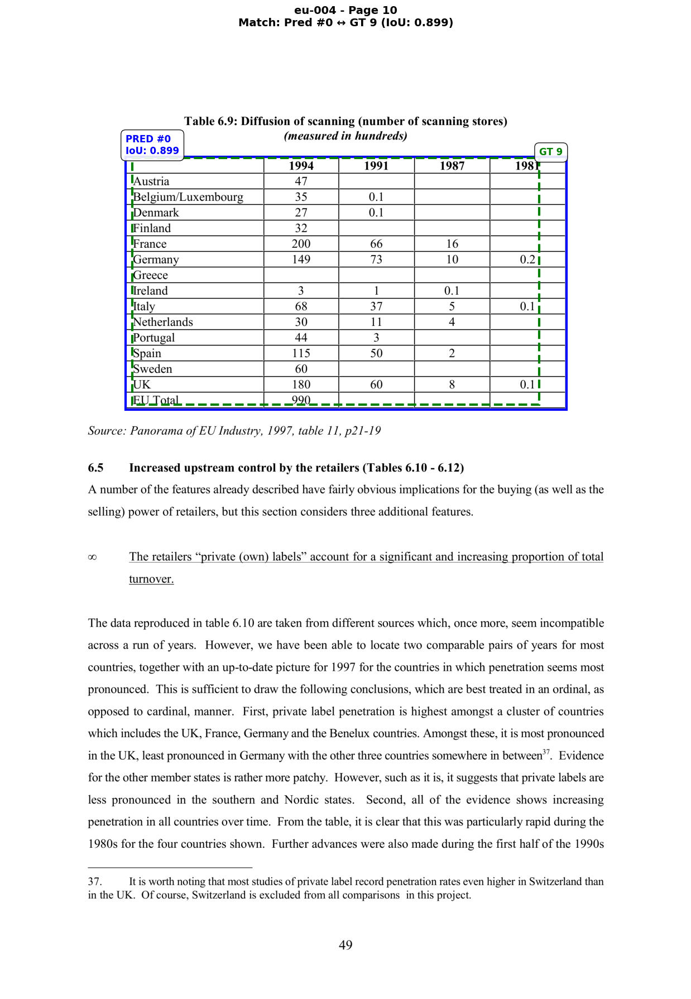

✓ Visualized Page 10


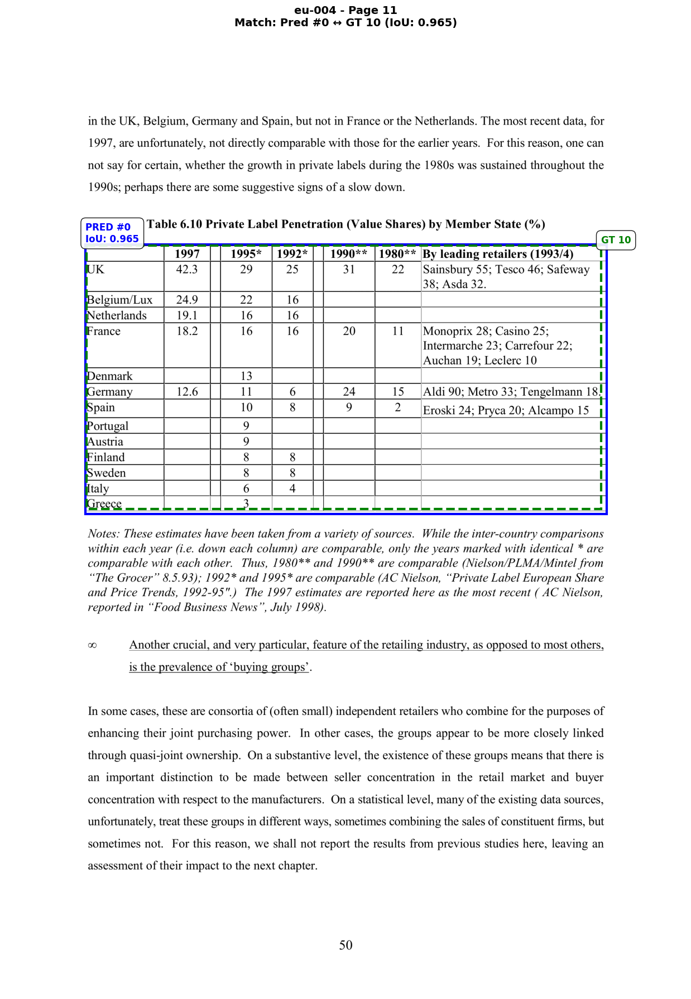

✓ Visualized Page 11


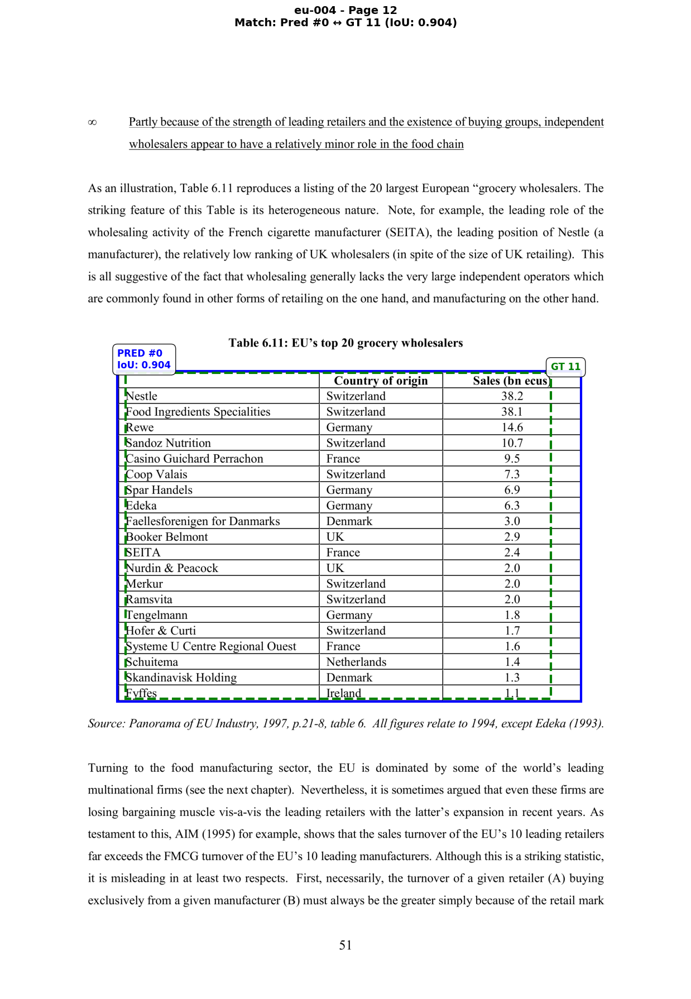

✓ Visualized Page 12


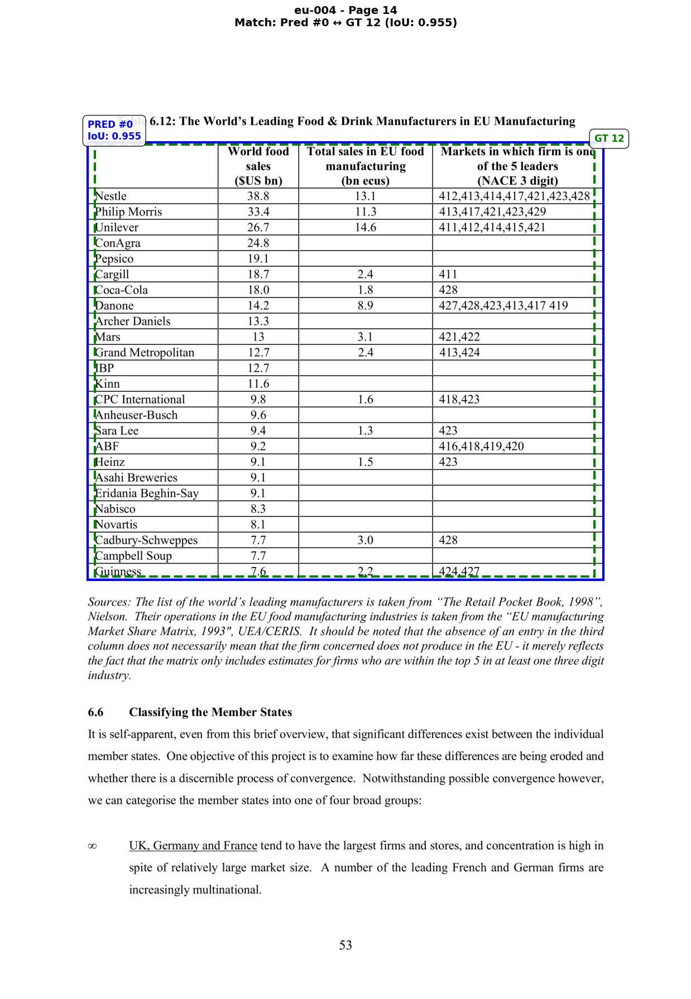

✓ Visualized Page 14


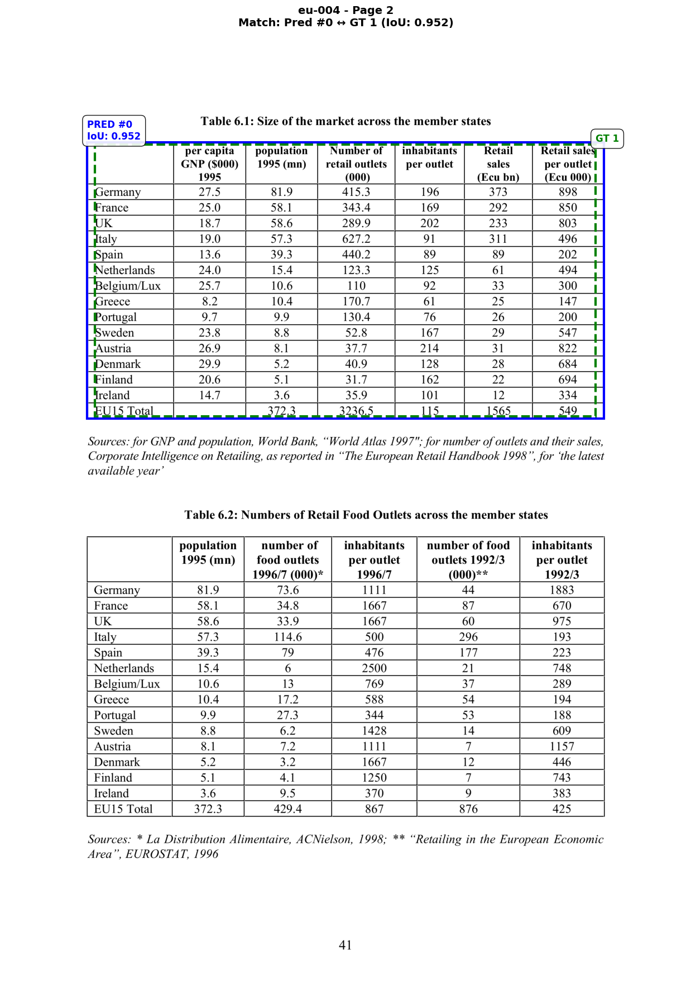

✓ Visualized Page 2


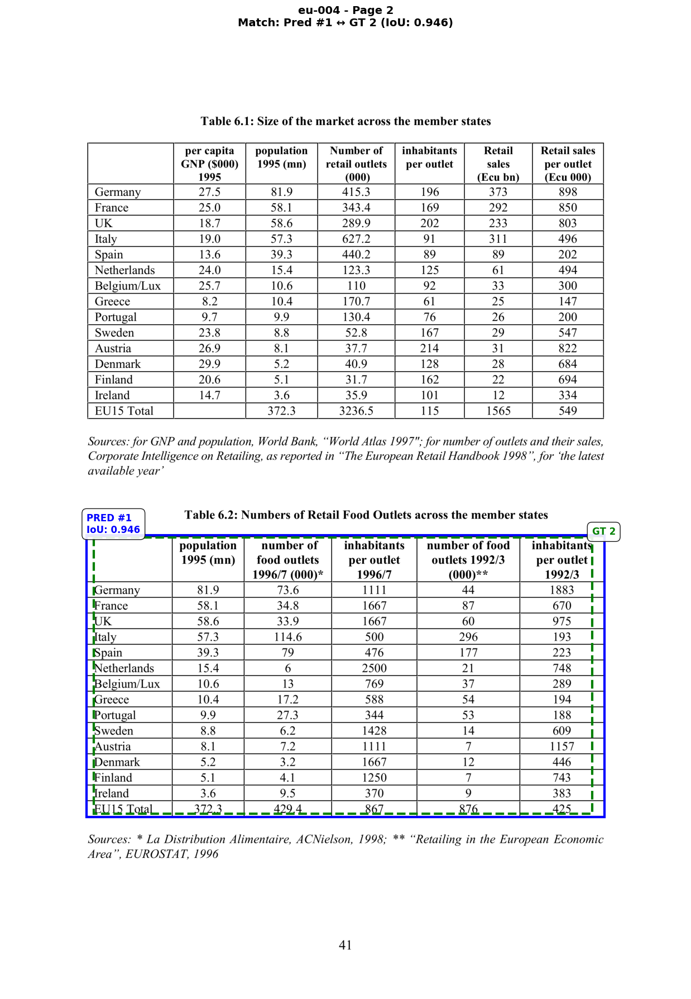

✓ Visualized Page 2


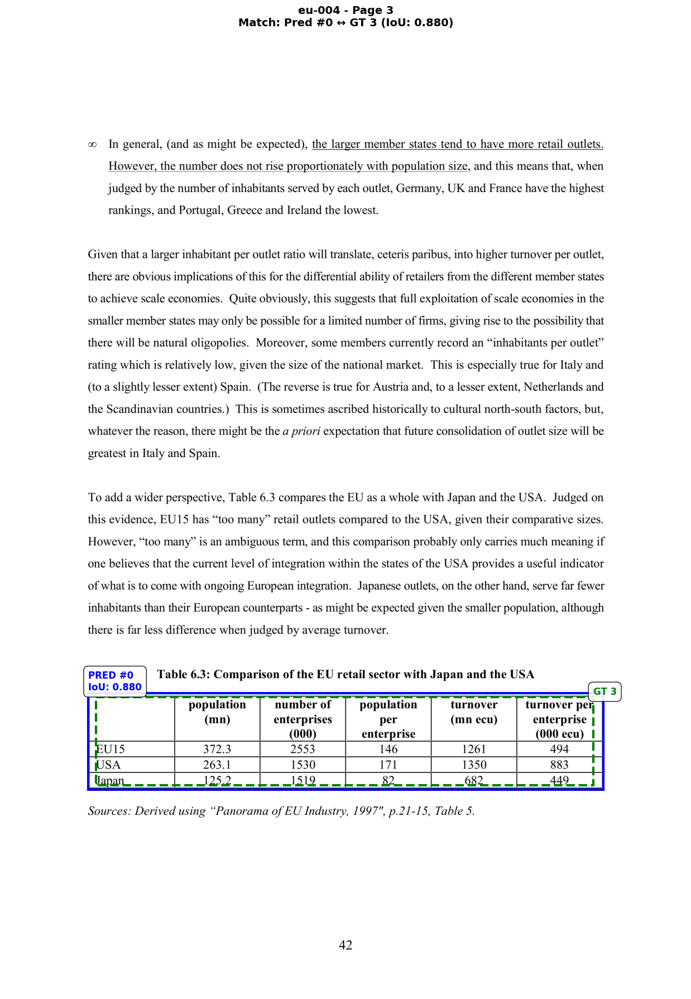

✓ Visualized Page 3


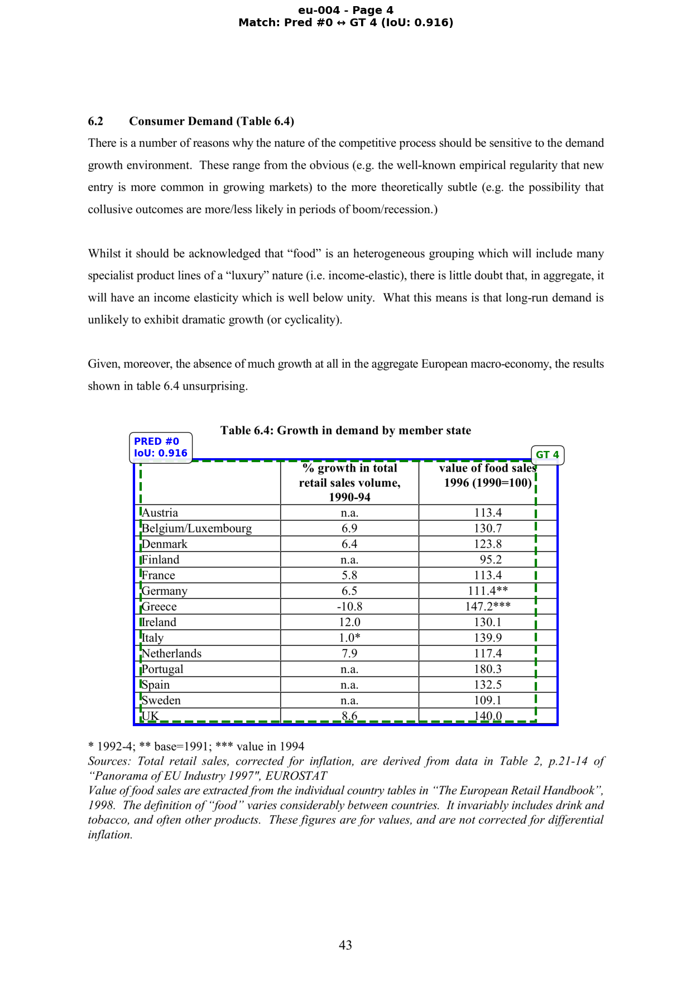

✓ Visualized Page 4


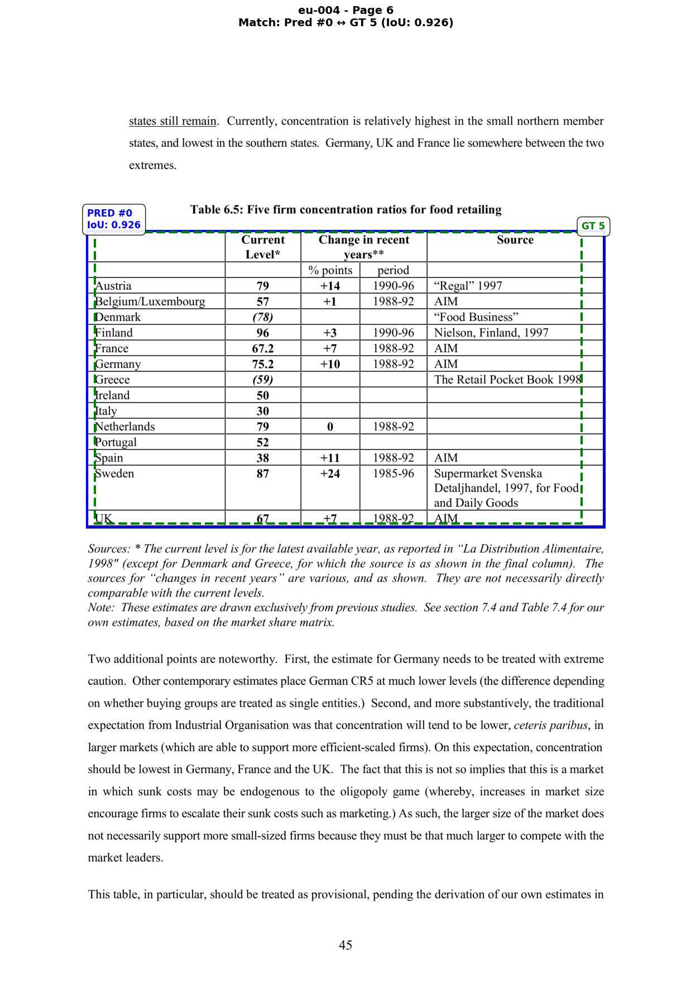

✓ Visualized Page 6


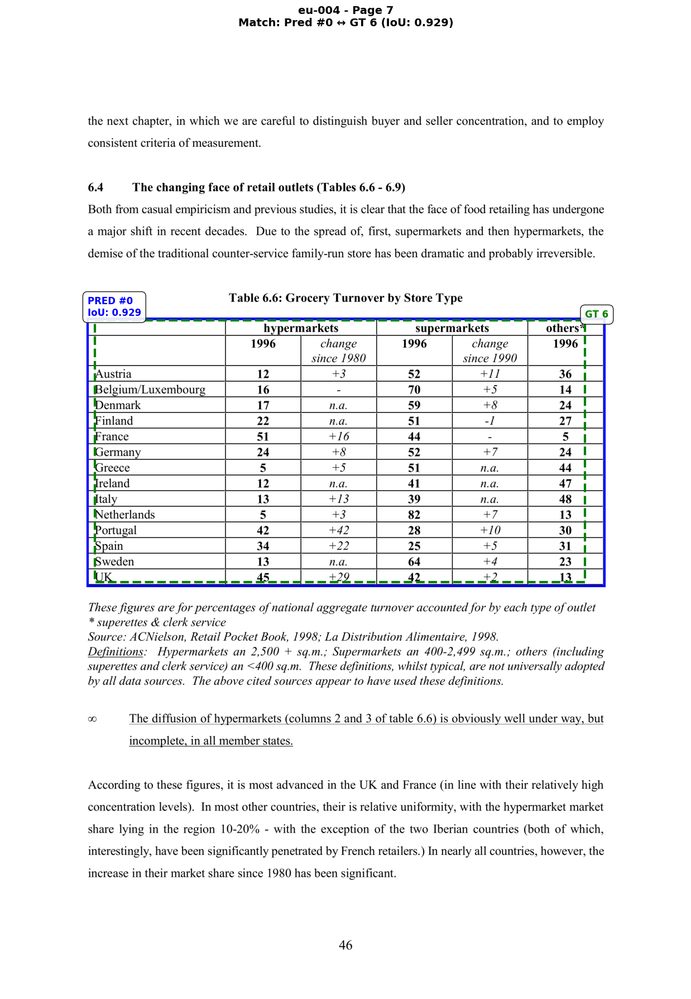

✓ Visualized Page 7


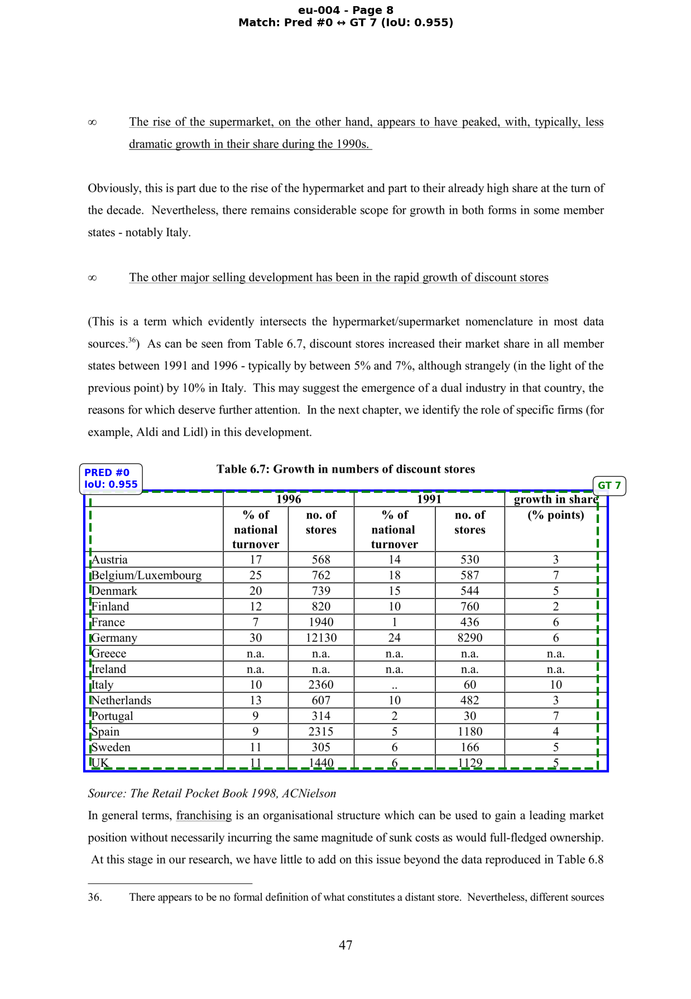

✓ Visualized Page 8


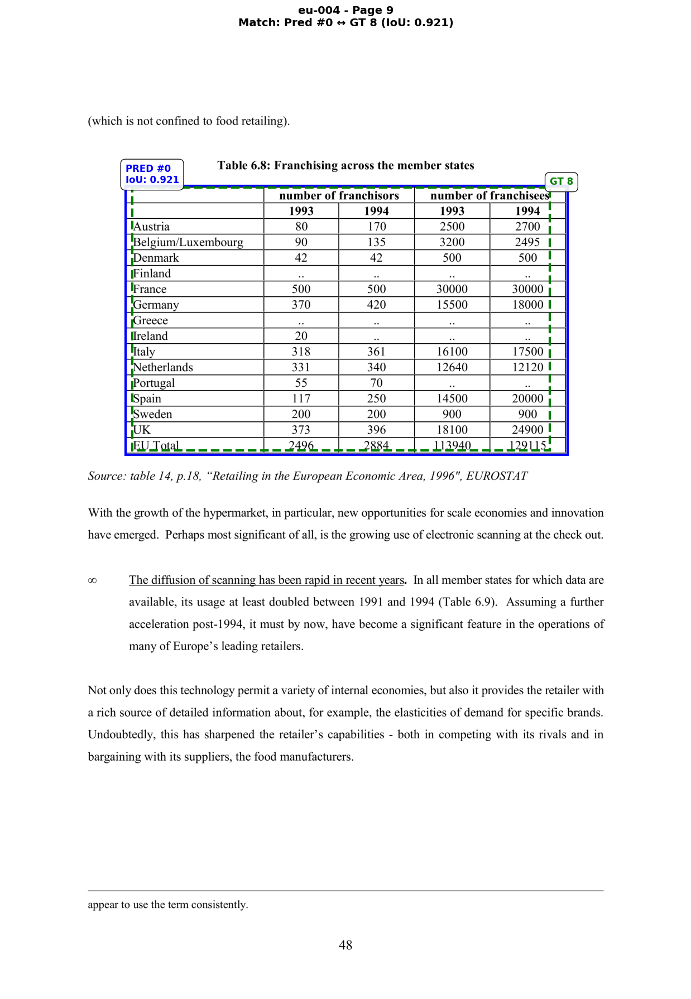

✓ Visualized Page 9

DEBUG COMPLETE


In [11]:
# Debug script for eu-004.pdf - PPStructure extraction and matching
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pathlib import Path

print("=" * 80)
print("DEBUG: eu-004.pdf TABLE EXTRACTION AND MATCHING")
print("=" * 80)

pdf_name = "eu-004"
part_name = "part1"

# Step 1: Extract with PPStructure
print("\n[STEP 1] EXTRACTING WITH PPSTRUCTURE")
print("-" * 80)

from paddleocr import PPStructure

table_engine = PPStructure(
    layout=True,
    table=True,
    ocr=True,
    use_gpu=False,
    show_log=False,
    lang='en',
    use_mp=False
)

# Get all page images for eu-004
pdf_dir = CONVERTED_DIR / part_name / pdf_name
page_images = sorted(pdf_dir.glob("page_*.png"))

print(f"Found {len(page_images)} pages for {pdf_name}")

# Extract from each page
extracted_tables = {}
for img_path in page_images:
    page_num = int(img_path.stem.split('_')[1])
    
    img = cv2.imread(str(img_path))
    if img is None:
        continue
    
    if len(img.shape) == 3 and img.shape[2] == 4:
        img = cv2.cvtColor(img, cv2.COLOR_BGRA2BGR)
    
    result = table_engine(img)
    
    tables = []
    for element in result:
        if element.get('type') == 'table':
            table_data = {
                'bbox': element.get('bbox', []),
                'html': None,
                'cell_bbox': []
            }
            
            if 'res' in element and isinstance(element['res'], dict):
                if 'html' in element['res']:
                    table_data['html'] = element['res']['html']
                if 'cell_bbox' in element['res']:
                    table_data['cell_bbox'] = element['res']['cell_bbox']
            
            tables.append(table_data)
    
    extracted_tables[page_num] = tables
    print(f"  Page {page_num}: Found {len(tables)} tables")

# Step 2: Load Ground Truth
print("\n[STEP 2] LOADING GROUND TRUTH")
print("-" * 80)

str_xml, reg_xml = find_xml_paths(part_name, pdf_name)
if str_xml:
    gt_tables_raw = parse_ground_truth_tables(str_xml, reg_xml)
    print(f"Found {len(gt_tables_raw)} GT tables total")
    
    for gt in gt_tables_raw:
        print(f"  GT {gt.table_id}: Page {gt.page}, bbox={[f'{x:.1f}' for x in gt.bbox]} (PDF coords)")
else:
    print("ERROR: No GT files found!")
    gt_tables_raw = []

# Step 3: Match predictions to GT
print("\n[STEP 3] MATCHING PREDICTIONS TO GROUND TRUTH")
print("-" * 80)

matches = []

for page_num, pred_tables in extracted_tables.items():
    print(f"\n📄 PAGE {page_num}")
    print("  " + "-" * 76)
    
    # Get page dimensions
    img_path = CONVERTED_DIR / part_name / pdf_name / f"page_{page_num}.png"
    img = cv2.imread(str(img_path))
    page_img_height, page_img_width = img.shape[:2]
    page_width_pdf, page_height_pdf = get_page_dimensions_from_png(img_path)
    
    print(f"  Image dimensions: {page_img_width} x {page_img_height}")
    print(f"  PDF dimensions: {page_width_pdf:.1f} x {page_height_pdf:.1f}")
    
    # Convert GT tables for this page
    page_gt_tables = []
    for gt_table in gt_tables_raw:
        if gt_table.page != page_num:
            continue
        
        converted_bbox = convert_bbox_to_png(gt_table.bbox, page_width_pdf, page_height_pdf)
        page_gt_tables.append({
            'table_id': gt_table.table_id,
            'page': gt_table.page,
            'bbox': converted_bbox,
            'bbox_original': gt_table.bbox,
            'gt_object': gt_table
        })
        
        print(f"  GT {gt_table.table_id}:")
        print(f"    PDF bbox:  {[f'{x:.1f}' for x in gt_table.bbox]}")
        print(f"    PNG bbox:  {[f'{x:.1f}' for x in converted_bbox]}")
    
    # Match each prediction
    for pred_idx, pred_table in enumerate(pred_tables):
        pred_bbox = normalize_pred_bbox(pred_table['bbox'], page_img_width, page_img_height)
        
        print(f"\n  🔍 PREDICTION #{pred_idx}")
        print(f"    Pred bbox: {[f'{x:.1f}' for x in pred_bbox]}")
        print(f"    Has HTML:  {bool(pred_table.get('html'))}")
        
        if not pred_table.get('html'):
            print(f"    ❌ SKIPPED: No HTML")
            continue
        
        # Find best match
        best_match = None
        best_iou = 0
        
        for gt_dict in page_gt_tables:
            iou = calculate_iou(pred_bbox, gt_dict['bbox'])
            print(f"    IoU with GT {gt_dict['table_id']}: {iou:.4f}")
            
            if iou > best_iou and iou >= 0.5:
                best_iou = iou
                best_match = gt_dict
        
        if best_match:
            print(f"    ✅ MATCHED to GT {best_match['table_id']} (IoU: {best_iou:.4f})")
            
            matches.append({
                'page': page_num,
                'pred_idx': pred_idx,
                'pred_bbox': pred_bbox,
                'gt_id': best_match['table_id'],
                'gt_bbox': best_match['bbox'],
                'gt_bbox_original': best_match['bbox_original'],
                'iou': best_iou,
                'pred_html': pred_table.get('html', '')[:200] + '...'
            })
        else:
            print(f"    ❌ NO MATCH (best IoU: {best_iou:.4f})")

# Step 4: Summary
print("\n" + "=" * 80)
print("MATCHING SUMMARY")
print("=" * 80)

for match in matches:
    print(f"\nPage {match['page']}, Prediction #{match['pred_idx']} → GT {match['gt_id']}")
    print(f"  IoU: {match['iou']:.4f}")
    print(f"  Pred bbox (PNG): {[f'{x:.1f}' for x in match['pred_bbox']]}")
    print(f"  GT bbox (PNG):   {[f'{x:.1f}' for x in match['gt_bbox']]}")
    print(f"  GT bbox (PDF):   {[f'{x:.1f}' for x in match['gt_bbox_original']]}")

# Step 5: Visualize matches
print("\n[STEP 4] GENERATING VISUALIZATIONS")
print("-" * 80)

for match in matches:
    page_num = match['page']
    img_path = CONVERTED_DIR / part_name / pdf_name / f"page_{page_num}.png"
    
    img = cv2.imread(str(img_path))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    fig, ax = plt.subplots(figsize=(14, 18))
    ax.imshow(img_rgb)
    
    # Draw prediction (blue)
    pred_bbox = match['pred_bbox']
    rect = patches.Rectangle(
        (pred_bbox[0], pred_bbox[1]),
        pred_bbox[2] - pred_bbox[0],
        pred_bbox[3] - pred_bbox[1],
        linewidth=3, edgecolor='blue', facecolor='none', linestyle='-'
    )
    ax.add_patch(rect)
    ax.text(pred_bbox[0], pred_bbox[1]-10,
           f"PRED #{match['pred_idx']}\nIoU: {match['iou']:.3f}",
           color='blue', fontsize=12, fontweight='bold',
           bbox=dict(boxstyle="round,pad=0.5", facecolor='white', alpha=0.9))
    
    # Draw GT (green)
    gt_bbox = match['gt_bbox']
    rect = patches.Rectangle(
        (gt_bbox[0], gt_bbox[1]),
        gt_bbox[2] - gt_bbox[0],
        gt_bbox[3] - gt_bbox[1],
        linewidth=3, edgecolor='green', facecolor='none', linestyle='--'
    )
    ax.add_patch(rect)
    ax.text(gt_bbox[2], gt_bbox[1]-10,
           f"GT {match['gt_id']}",
           color='green', fontsize=12, fontweight='bold',
           bbox=dict(boxstyle="round,pad=0.5", facecolor='white', alpha=0.9))
    
    ax.set_title(f"eu-004 - Page {page_num}\n" +
                f"Match: Pred #{match['pred_idx']} ↔ GT {match['gt_id']} (IoU: {match['iou']:.3f})",
                fontsize=14, fontweight='bold')
    ax.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"✓ Visualized Page {page_num}")

print("\n" + "=" * 80)
print("DEBUG COMPLETE")
print("=" * 80)

# Debug eu16 img2table

DEBUG: eu-016.pdf TABLE EXTRACTION AND MATCHING (img2table)

[STEP 1] EXTRACTING WITH IMG2TABLE
--------------------------------------------------------------------------------
Initializing img2table with PaddleOCR...
Found 3 pages for eu-016

  Extracting from Page 1...
  Page 1: Found 1 tables
    Table #0:
      bbox: ['522.0', '1313.0', '1891.0', '1714.0']
      Has HTML: True
      Confidence: 1.0
      HTML preview: <table>  <tr>   <td colspan="1" rowspan="1">    60   </td>   <td colspan="1" rowspan="1">   </td>   <td colspan="1" rowspan="1">   </td>   <td colspan...

  Extracting from Page 2...
  Page 2: Found 2 tables
    Table #0:
      bbox: ['364.0', '655.0', '995.0', '1023.0']
      Has HTML: True
      Confidence: 1.0
      HTML preview: <table>  <tr>   <td colspan="1" rowspan="1">   </td>   <td colspan="1" rowspan="1">    12000   </td>   <td colspan="1" rowspan="1">    S. Typhimurium ...
    Table #1:
      bbox: ['459.0', '1111.0', '1958.0', '1394.0']
      Has HTML: Tru

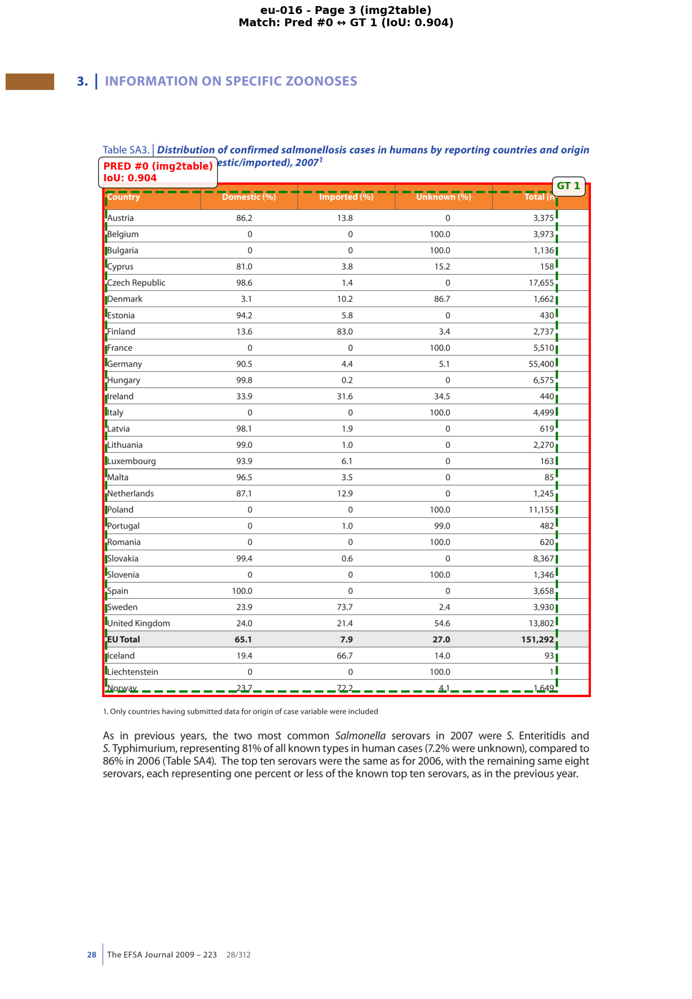

✓ Visualized Page 3

[STEP 6] VISUALIZING UNMATCHED PREDICTIONS
--------------------------------------------------------------------------------


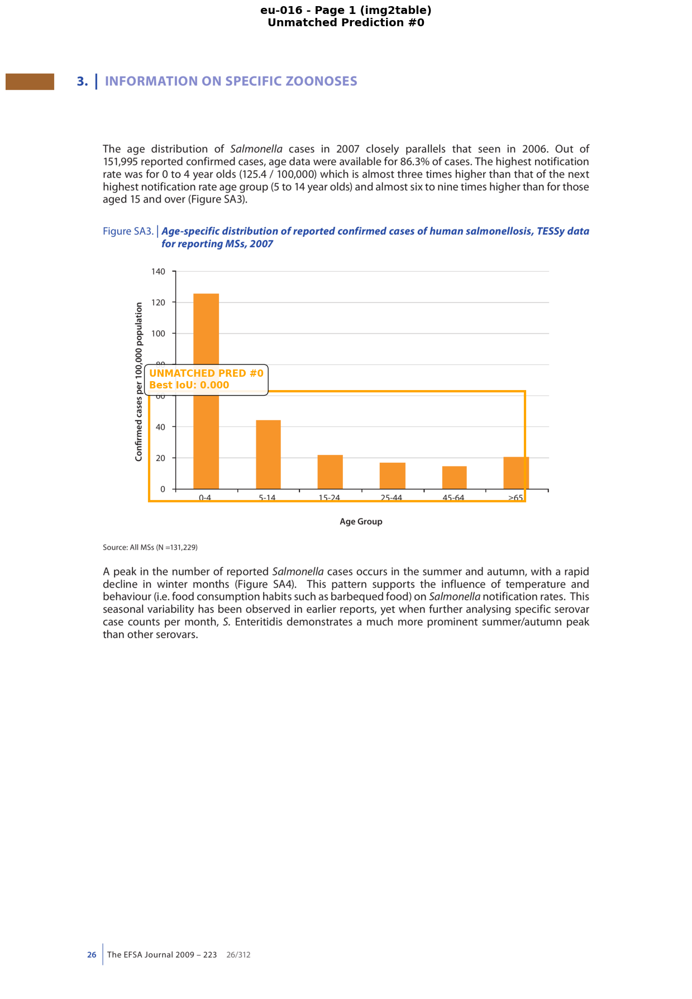

✓ Visualized unmatched prediction on Page 1


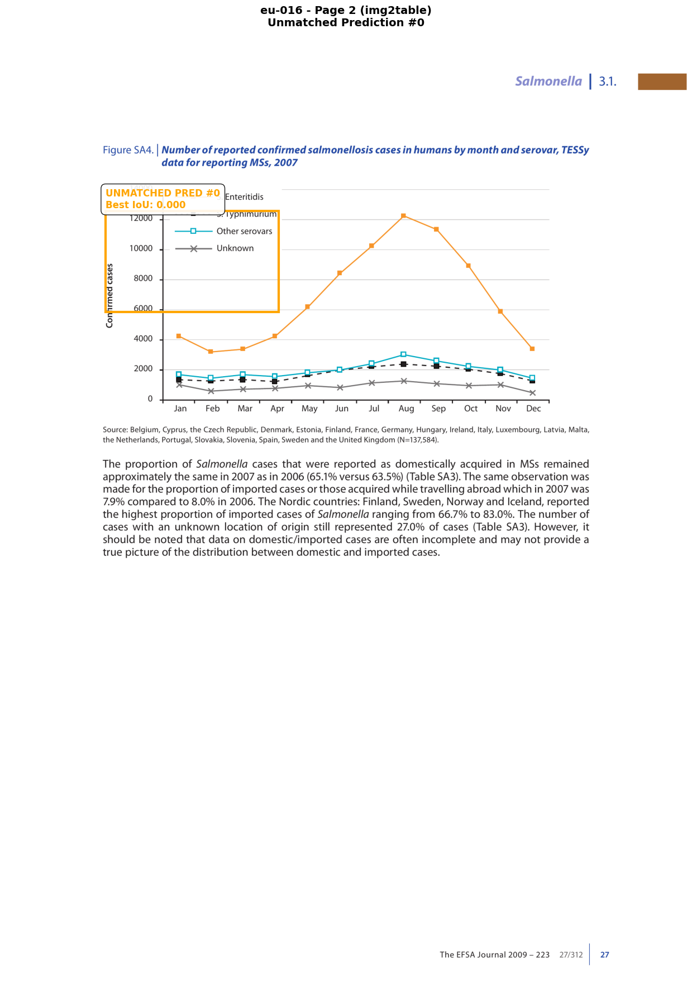

✓ Visualized unmatched prediction on Page 2


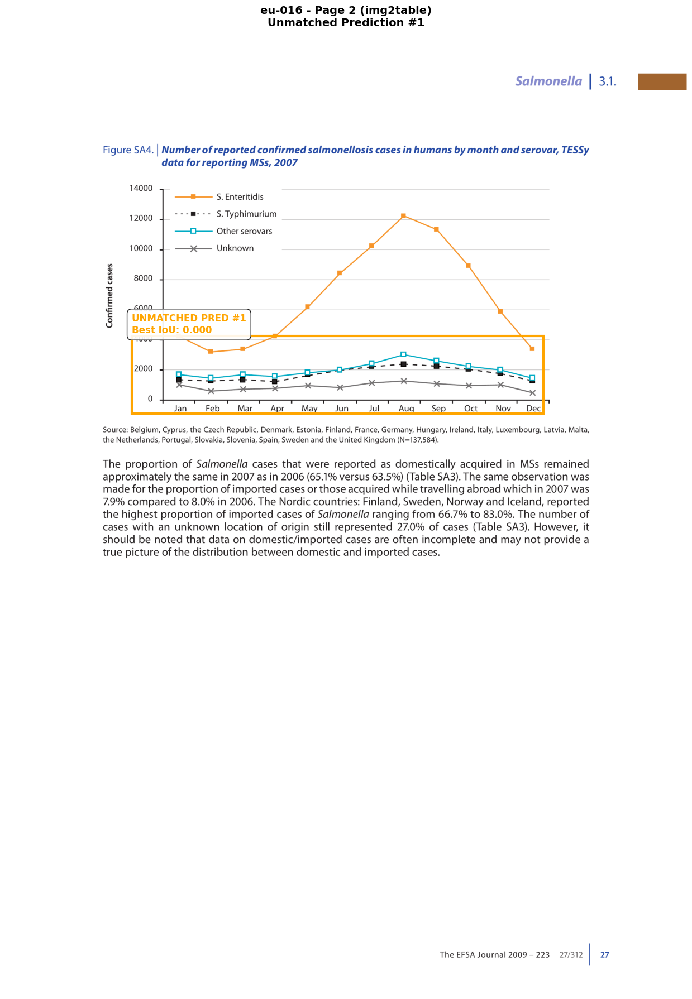

✓ Visualized unmatched prediction on Page 2

DEBUG COMPLETE


In [18]:
# Debug script for eu-016.pdf - img2table extraction and matching
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pathlib import Path

print("=" * 80)
print("DEBUG: eu-016.pdf TABLE EXTRACTION AND MATCHING (img2table)")
print("=" * 80)

pdf_name = "eu-016"
part_name = "part1"

# Step 1: Extract with img2table
print("\n[STEP 1] EXTRACTING WITH IMG2TABLE")
print("-" * 80)

import os
os.environ['CUDA_VISIBLE_DEVICES'] = '-1'

from img2table.document import Image as Img2TableImage
from img2table.ocr import PaddleOCR as Img2TablePaddleOCR

print("Initializing img2table with PaddleOCR...")
img2table_ocr = Img2TablePaddleOCR(lang='en')

def extract_tables_img2table(img_path, ocr_engine):
    """Extract tables using img2table."""
    tables = []
    
    try:
        img_doc = Img2TableImage(src=str(img_path))
        
        extracted_tables = img_doc.extract_tables(
            ocr=ocr_engine,
            implicit_rows=True,
            implicit_columns=True,
            borderless_tables=True,
            min_confidence=60
        )
        
        for table in extracted_tables:
            bbox = [table.bbox.x1, table.bbox.y1, table.bbox.x2, table.bbox.y2]
            
            cell_bboxes = []
            try:
                if hasattr(table, 'df') and table.df is not None:
                    for row_idx in range(len(table.df)):
                        for col_idx in range(len(table.df.columns)):
                            cell_value = table.df.iloc[row_idx, col_idx]
                            if cell_value is not None and str(cell_value).strip():
                                cell_bboxes.append({
                                    'row': row_idx,
                                    'col': col_idx,
                                    'text': str(cell_value)
                                })
            except:
                pass
            
            html_content = None
            try:
                if hasattr(table, 'html'):
                    if callable(table.html):
                        html_content = table.html()
                    else:
                        html_content = table.html
                elif hasattr(table, 'df') and table.df is not None:
                    html_content = table.df.to_html()
            except:
                html_content = None
            
            table_data = {
                'bbox': bbox,
                'html': html_content,
                'cell_bbox': cell_bboxes,
                'confidence': getattr(table, 'score', 1.0),
                'method': 'img2table',
                'raw_table_object': table  # Store for inspection
            }
            
            tables.append(table_data)
            
    except Exception as e:
        print(f"  Error extracting from {img_path}: {e}")
    
    return tables

# Get all page images for eu-016
pdf_dir = CONVERTED_DIR / part_name / pdf_name
page_images = sorted(pdf_dir.glob("page_*.png"))

print(f"Found {len(page_images)} pages for {pdf_name}")

# Extract from each page
extracted_tables = {}
for img_path in page_images:
    page_num = int(img_path.stem.split('_')[1])
    
    print(f"\n  Extracting from Page {page_num}...")
    tables = extract_tables_img2table(img_path, img2table_ocr)
    
    extracted_tables[page_num] = tables
    print(f"  Page {page_num}: Found {len(tables)} tables")
    
    # Show table details
    for idx, table in enumerate(tables):
        print(f"    Table #{idx}:")
        print(f"      bbox: {[f'{x:.1f}' for x in table['bbox']]}")
        print(f"      Has HTML: {bool(table.get('html'))}")
        print(f"      Confidence: {table.get('confidence', 'N/A')}")
        if table.get('html'):
            html_preview = table['html'][:150].replace('\n', ' ')
            print(f"      HTML preview: {html_preview}...")

# Step 2: Load Ground Truth
print("\n[STEP 2] LOADING GROUND TRUTH")
print("-" * 80)

str_xml, reg_xml = find_xml_paths(part_name, pdf_name)
if str_xml:
    gt_tables_raw = parse_ground_truth_tables(str_xml, reg_xml)
    print(f"Found {len(gt_tables_raw)} GT tables total")
    
    for gt in gt_tables_raw:
        print(f"  GT {gt.table_id}: Page {gt.page}, bbox={[f'{x:.1f}' for x in gt.bbox]} (PDF coords)")
else:
    print("ERROR: No GT files found!")
    gt_tables_raw = []

# Step 3: Match predictions to GT
print("\n[STEP 3] MATCHING PREDICTIONS TO GROUND TRUTH")
print("-" * 80)

matches = []
unmatched_preds = []

for page_num, pred_tables in extracted_tables.items():
    print(f"\n📄 PAGE {page_num}")
    print("  " + "-" * 76)
    
    # Get page dimensions
    img_path = CONVERTED_DIR / part_name / pdf_name / f"page_{page_num}.png"
    img = cv2.imread(str(img_path))
    page_img_height, page_img_width = img.shape[:2]
    page_width_pdf, page_height_pdf = get_page_dimensions_from_png(img_path)
    
    print(f"  Image dimensions: {page_img_width} x {page_img_height}")
    print(f"  PDF dimensions: {page_width_pdf:.1f} x {page_height_pdf:.1f}")
    
    # Convert GT tables for this page
    page_gt_tables = []
    for gt_table in gt_tables_raw:
        if gt_table.page != page_num:
            continue
        
        converted_bbox = convert_bbox_to_png(gt_table.bbox, page_width_pdf, page_height_pdf)
        page_gt_tables.append({
            'table_id': gt_table.table_id,
            'page': gt_table.page,
            'bbox': converted_bbox,
            'bbox_original': gt_table.bbox,
            'gt_object': gt_table
        })
        
        print(f"  GT {gt_table.table_id}:")
        print(f"    PDF bbox:  {[f'{x:.1f}' for x in gt_table.bbox]}")
        print(f"    PNG bbox:  {[f'{x:.1f}' for x in converted_bbox]}")
    
    # Match each prediction
    for pred_idx, pred_table in enumerate(pred_tables):
        pred_bbox = normalize_pred_bbox(pred_table['bbox'], page_img_width, page_img_height)
        
        print(f"\n  🔍 PREDICTION #{pred_idx}")
        print(f"    Pred bbox: {[f'{x:.1f}' for x in pred_bbox]}")
        print(f"    Has HTML:  {bool(pred_table.get('html'))}")
        print(f"    Confidence: {pred_table.get('confidence', 'N/A')}")
        
        if not pred_table.get('html'):
            print(f"    ❌ SKIPPED: No HTML")
            continue
        
        # Find best match
        best_match = None
        best_iou = 0
        
        for gt_dict in page_gt_tables:
            iou = calculate_iou(pred_bbox, gt_dict['bbox'])
            print(f"    IoU with GT {gt_dict['table_id']}: {iou:.4f}")
            
            if iou > best_iou and iou >= 0.5:
                best_iou = iou
                best_match = gt_dict
        
        if best_match:
            print(f"    ✅ MATCHED to GT {best_match['table_id']} (IoU: {best_iou:.4f})")
            
            matches.append({
                'page': page_num,
                'pred_idx': pred_idx,
                'pred_bbox': pred_bbox,
                'gt_id': best_match['table_id'],
                'gt_bbox': best_match['bbox'],
                'gt_bbox_original': best_match['bbox_original'],
                'iou': best_iou,
                'pred_html': pred_table.get('html', ''),
                'pred_table': pred_table
            })
        else:
            print(f"    ❌ NO MATCH (best IoU: {best_iou:.4f})")
            unmatched_preds.append({
                'page': page_num,
                'pred_idx': pred_idx,
                'pred_bbox': pred_bbox,
                'best_iou': best_iou
            })

# Step 4: Summary
print("\n" + "=" * 80)
print("MATCHING SUMMARY")
print("=" * 80)

print(f"\n✅ MATCHES: {len(matches)}")
for match in matches:
    print(f"\nPage {match['page']}, Prediction #{match['pred_idx']} → GT {match['gt_id']}")
    print(f"  IoU: {match['iou']:.4f}")
    print(f"  Pred bbox (PNG): {[f'{x:.1f}' for x in match['pred_bbox']]}")
    print(f"  GT bbox (PNG):   {[f'{x:.1f}' for x in match['gt_bbox']]}")
    print(f"  GT bbox (PDF):   {[f'{x:.1f}' for x in match['gt_bbox_original']]}")

print(f"\n❌ UNMATCHED PREDICTIONS: {len(unmatched_preds)}")
for unmatch in unmatched_preds:
    print(f"\nPage {unmatch['page']}, Prediction #{unmatch['pred_idx']}")
    print(f"  Best IoU: {unmatch['best_iou']:.4f}")
    print(f"  Pred bbox (PNG): {[f'{x:.1f}' for x in unmatch['pred_bbox']]}")

# Step 5: Analyze HTML structure for matched tables
print("\n" + "=" * 80)
print("HTML STRUCTURE ANALYSIS")
print("=" * 80)

import re

for match in matches:
    print(f"\n{'='*80}")
    print(f"Page {match['page']}, Pred #{match['pred_idx']} → GT {match['gt_id']}")
    print(f"IoU: {match['iou']:.4f}")
    print(f"{'='*80}")
    
    # Get prediction HTML
    pred_html = match['pred_html']
    
    # Get ground truth HTML
    str_xml, reg_xml = find_xml_paths(part_name, pdf_name)
    if str_xml:
        gt_tables = parse_ground_truth_tables(str_xml, reg_xml)
        gt_table = next((gt for gt in gt_tables 
                       if gt.table_id == match['gt_id'] and gt.page == match['page']), None)
        if gt_table:
            gt_html = create_html_from_gt_cells(gt_table.cells)
        else:
            gt_html = "GT not found"
    else:
        gt_html = "XML not found"
    
    # Count structural elements
    pred_rows = len(re.findall(r'<tr[>\s]', pred_html))
    gt_rows = len(re.findall(r'<tr[>\s]', gt_html))
    pred_cells = len(re.findall(r'<td[>\s]', pred_html))
    gt_cells = len(re.findall(r'<td[>\s]', gt_html))
    pred_rowspans = len(re.findall(r'rowspan', pred_html))
    gt_rowspans = len(re.findall(r'rowspan', gt_html))
    pred_colspans = len(re.findall(r'colspan', pred_html))
    gt_colspans = len(re.findall(r'colspan', gt_html))
    
    print(f"\n--- STRUCTURE COMPARISON ---")
    print(f"Rows:     Pred={pred_rows:3d} | GT={gt_rows:3d} | Diff={abs(pred_rows-gt_rows):3d}")
    print(f"Cells:    Pred={pred_cells:3d} | GT={gt_cells:3d} | Diff={abs(pred_cells-gt_cells):3d}")
    print(f"Rowspans: Pred={pred_rowspans:3d} | GT={gt_rowspans:3d} | Diff={abs(pred_rowspans-gt_rowspans):3d}")
    print(f"Colspans: Pred={pred_colspans:3d} | GT={gt_colspans:3d} | Diff={abs(pred_colspans-gt_colspans):3d}")
    
    print(f"\n--- PREDICTED HTML (first 500 chars) ---")
    print(pred_html[:500])
    
    print(f"\n--- GROUND TRUTH HTML (first 500 chars) ---")
    print(gt_html[:500])

# Step 6: Visualize matches
print("\n[STEP 5] GENERATING VISUALIZATIONS")
print("-" * 80)

for match in matches:
    page_num = match['page']
    img_path = CONVERTED_DIR / part_name / pdf_name / f"page_{page_num}.png"
    
    img = cv2.imread(str(img_path))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    fig, ax = plt.subplots(figsize=(14, 18))
    ax.imshow(img_rgb)
    
    # Draw prediction (red for img2table)
    pred_bbox = match['pred_bbox']
    rect = patches.Rectangle(
        (pred_bbox[0], pred_bbox[1]),
        pred_bbox[2] - pred_bbox[0],
        pred_bbox[3] - pred_bbox[1],
        linewidth=3, edgecolor='red', facecolor='none', linestyle='-'
    )
    ax.add_patch(rect)
    ax.text(pred_bbox[0], pred_bbox[1]-10,
           f"PRED #{match['pred_idx']} (img2table)\nIoU: {match['iou']:.3f}",
           color='red', fontsize=12, fontweight='bold',
           bbox=dict(boxstyle="round,pad=0.5", facecolor='white', alpha=0.9))
    
    # Draw GT (green)
    gt_bbox = match['gt_bbox']
    rect = patches.Rectangle(
        (gt_bbox[0], gt_bbox[1]),
        gt_bbox[2] - gt_bbox[0],
        gt_bbox[3] - gt_bbox[1],
        linewidth=3, edgecolor='green', facecolor='none', linestyle='--'
    )
    ax.add_patch(rect)
    ax.text(gt_bbox[2], gt_bbox[1]-10,
           f"GT {match['gt_id']}",
           color='green', fontsize=12, fontweight='bold',
           bbox=dict(boxstyle="round,pad=0.5", facecolor='white', alpha=0.9))
    
    ax.set_title(f"eu-016 - Page {page_num} (img2table)\n" +
                f"Match: Pred #{match['pred_idx']} ↔ GT {match['gt_id']} (IoU: {match['iou']:.3f})",
                fontsize=14, fontweight='bold')
    ax.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"✓ Visualized Page {page_num}")

# Visualize unmatched predictions too
print("\n[STEP 6] VISUALIZING UNMATCHED PREDICTIONS")
print("-" * 80)

for unmatch in unmatched_preds:
    page_num = unmatch['page']
    img_path = CONVERTED_DIR / part_name / pdf_name / f"page_{page_num}.png"
    
    img = cv2.imread(str(img_path))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    fig, ax = plt.subplots(figsize=(14, 18))
    ax.imshow(img_rgb)
    
    # Draw unmatched prediction (orange)
    pred_bbox = unmatch['pred_bbox']
    rect = patches.Rectangle(
        (pred_bbox[0], pred_bbox[1]),
        pred_bbox[2] - pred_bbox[0],
        pred_bbox[3] - pred_bbox[1],
        linewidth=3, edgecolor='orange', facecolor='none', linestyle='-'
    )
    ax.add_patch(rect)
    ax.text(pred_bbox[0], pred_bbox[1]-10,
           f"UNMATCHED PRED #{unmatch['pred_idx']}\nBest IoU: {unmatch['best_iou']:.3f}",
           color='orange', fontsize=12, fontweight='bold',
           bbox=dict(boxstyle="round,pad=0.5", facecolor='white', alpha=0.9))
    
    ax.set_title(f"eu-016 - Page {page_num} (img2table)\n" +
                f"Unmatched Prediction #{unmatch['pred_idx']}",
                fontsize=14, fontweight='bold')
    ax.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"✓ Visualized unmatched prediction on Page {page_num}")

print("\n" + "=" * 80)
print("DEBUG COMPLETE")
print("=" * 80)